# Introduction

Danial Bashir 10.11.2024
Student ID: 544630

Group number: 201

This notebook is a part of the final project of the course TDT4173 Modern Machine Learning in Practice. 

The aim for the project was to predict future vessel trajectories based on historic AIS data.

This notebook provides an overview for the project, spanning through EDA, feature engeneering, different suuccsessful and unsuccesful models/algorithms as well as model interpretation



# EDA

In [3]:
#Load datasets

import pandas as pd
import warnings
import numpy as np

warnings.filterwarnings("ignore")

# Load and merge datasets
ais_train = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_train.csv', sep='|')
ais_test = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_test.csv')

#merge with vessels
vessels = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/vessels.csv', sep='|')
ais_train = ais_train.merge(vessels, on='vesselId', how='left', suffixes=('', '_vessel'))
ais_test = ais_test.merge(vessels, on='vesselId', how='left', suffixes=('', '_vessel'))

#merge with ports
ports = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ports.csv', sep='|')
ais_train = ais_train.merge(ports, on='portId', how='left', suffixes=('', '_port'))


In [4]:
# Summary statistics
summary_stats = ais_train.describe()
print(summary_stats)

# Check for missing values
missing_values = ais_train.isnull().sum()
print("\nMissing values:\n", missing_values)


                cog           sog           rot       heading       navstat  \
count  1.522065e+06  1.522065e+06  1.522065e+06  1.522065e+06  1.522065e+06   
mean   1.782494e+02  6.331703e+00  5.054561e-01  1.762737e+02  2.092604e+00   
std    1.076785e+02  7.539364e+00  1.760916e+01  1.070860e+02  2.411965e+00   
min    0.000000e+00  0.000000e+00 -1.270000e+02  0.000000e+00  0.000000e+00   
25%    7.820000e+01  0.000000e+00  0.000000e+00  7.500000e+01  0.000000e+00   
50%    1.838000e+02  5.000000e-01  0.000000e+00  1.800000e+02  0.000000e+00   
75%    2.690000e+02  1.410000e+01  0.000000e+00  2.650000e+02  5.000000e+00   
max    3.600000e+02  1.023000e+02  1.280000e+02  5.110000e+02  1.500000e+01   

       latitude_vessel  longitude_vessel           CEU           DWT  \
count     1.522065e+06      1.522065e+06  1.522065e+06  1.507116e+06   
mean      3.658497e+01      1.153646e+01  4.154166e+03  1.707106e+04   
std       2.290488e+01      6.871572e+01  2.531363e+03  9.287010e+03   


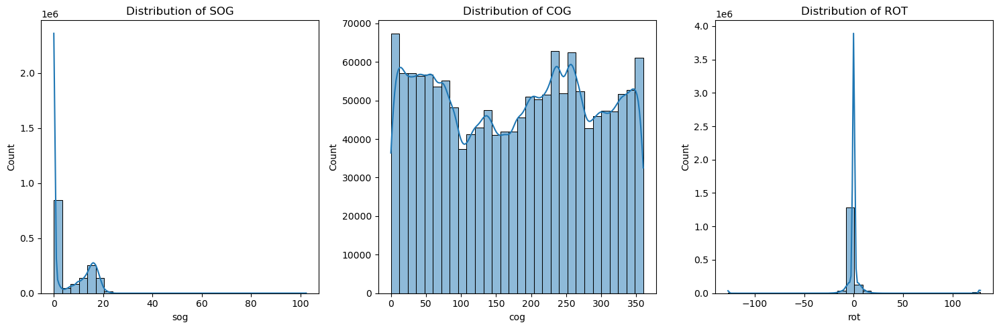

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot distributions of key features
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.histplot(ais_train['sog'], bins=30, kde=True)
plt.title('Distribution of SOG')

plt.subplot(1, 3, 2)
sns.histplot(ais_train['cog'], bins=30, kde=True)
plt.title('Distribution of COG')

plt.subplot(1, 3, 3)
sns.histplot(ais_train['rot'], bins=30, kde=True)
plt.title('Distribution of ROT')

plt.tight_layout()
plt.show()


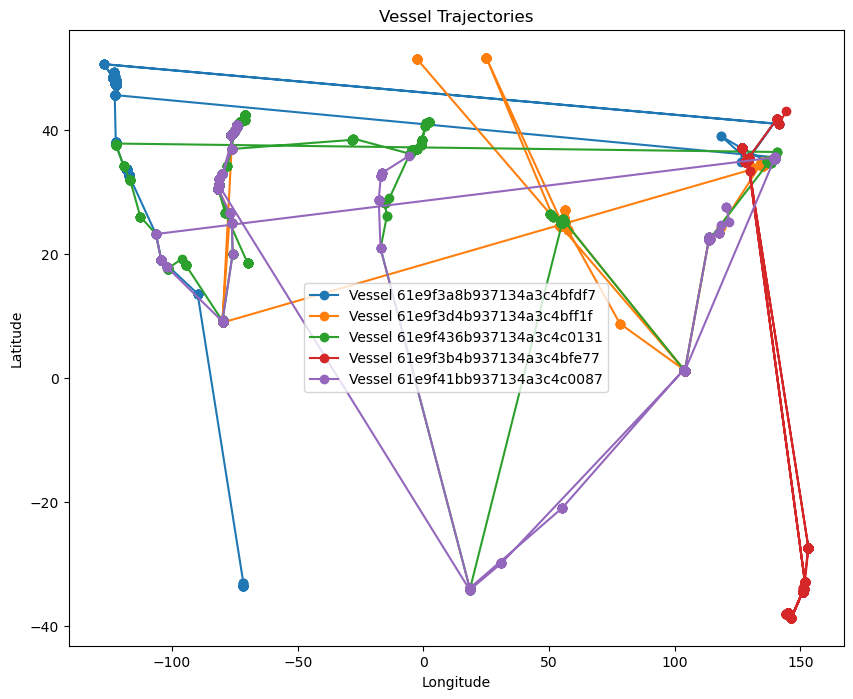

In [6]:
# Filter for a few vessels
sample_vessels = ais_train['vesselId'].unique()[:5]  # Select the first 5 unique vessel IDs for simplicity
sample_data = ais_train[ais_train['vesselId'].isin(sample_vessels)]

# Plot vessel positions
plt.figure(figsize=(10, 8))
for vessel_id in sample_vessels:
    vessel_data = sample_data[sample_data['vesselId'] == vessel_id]
    plt.plot(vessel_data['longitude'], vessel_data['latitude'], marker='o', label=f'Vessel {vessel_id}')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Vessel Trajectories')
plt.legend()
plt.show()


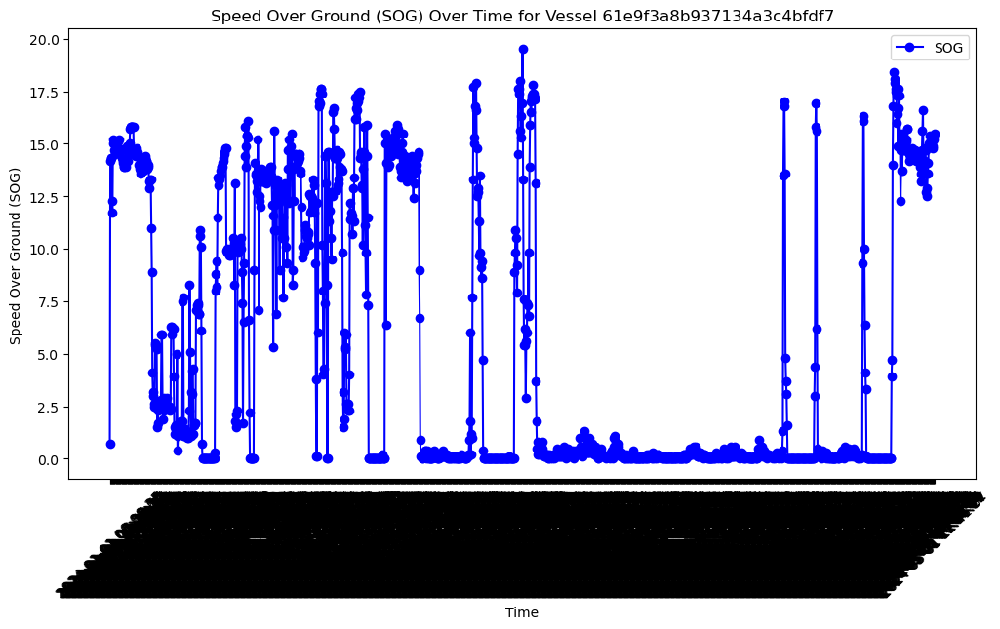

In [7]:
# Select a single vessel
vessel_id = ais_train['vesselId'].iloc[0]  # Take the first vessel as an example
vessel_data = ais_train[ais_train['vesselId'] == vessel_id]

# Plot SOG over time
plt.figure(figsize=(12, 6))
plt.plot(vessel_data['time'], vessel_data['sog'], marker='o', color='b', label='SOG')
plt.title(f'Speed Over Ground (SOG) Over Time for Vessel {vessel_id}')
plt.xlabel('Time')
plt.ylabel('Speed Over Ground (SOG)')
plt.xticks(rotation=45)
plt.legend()
plt.show()


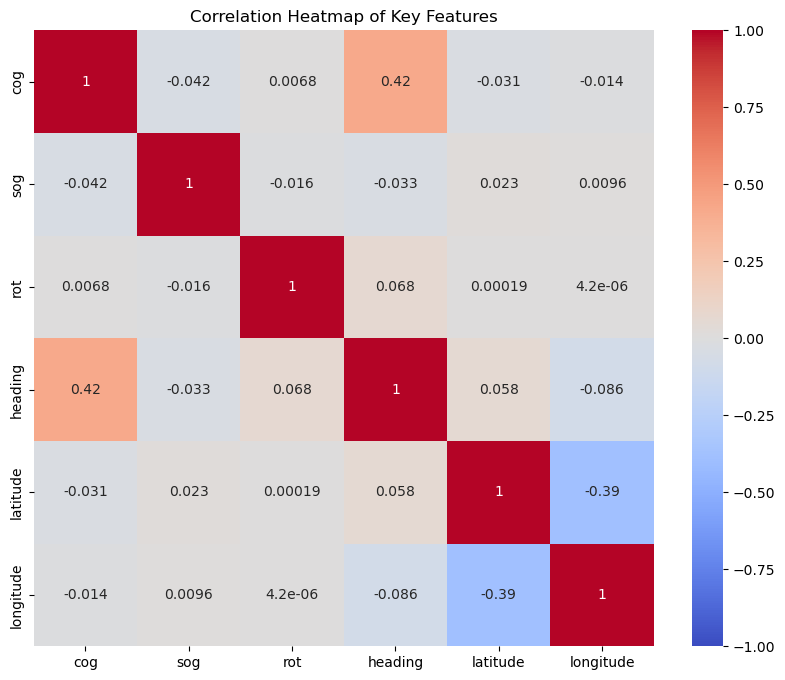

In [8]:

# Compute correlation matrix
correlation_matrix = ais_train[['cog', 'sog', 'rot', 'heading', 'latitude', 'longitude']].corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Key Features')
plt.show()


In [10]:
#calculate number of vessels in bot ais_train and ais_test
print('Number of vessels in ais_train:', len(ais_train['vesselId'].unique()))
print('Number of vessels in ais_test:', len(ais_test['vesselId'].unique()))

#calculate number of entries of each vessel in ais_train
print('Number of entries of each vessel in ais_train:')
print(ais_train['vesselId'].value_counts())

#check id vesselId 61e9f3cbb937134a3c4bff09 is in ais_test
print('Is vesselId 61e9f3cbb937134a3c4bff09 in ais_test:', '61e9f3cbb937134a3c4bff09' in ais_test['vesselId'].unique())

#median number of entries of each vessel in ais_train
print('Median number of entries of each vessel in ais_train:', ais_train['vesselId'].value_counts().median())


Number of vessels in ais_train: 688
Number of vessels in ais_test: 215
Number of entries of each vessel in ais_train:
vesselId
6323f2287abc89c0a9631e57    8656
61e9f466b937134a3c4c0273    8626
61e9f464b937134a3c4c025f    7958
61e9f465b937134a3c4c026d    7928
61e9f465b937134a3c4c0271    7689
                            ... 
61e9f45cb937134a3c4c022b     196
61e9f42cb937134a3c4c00f9     191
61e9f3c6b937134a3c4bfed5     160
61e9f3adb937134a3c4bfe37      31
61e9f3cbb937134a3c4bff09       1
Name: count, Length: 688, dtype: int64
Is vesselId 61e9f3cbb937134a3c4bff09 in ais_test: False
Median number of entries of each vessel in ais_train: 1709.0


In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
#create column for time difference between entries
ais_train['time'] = pd.to_datetime(ais_train['time'])
ais_train = ais_train.sort_values(['vesselId', 'time'])
ais_train['time_diff'] = ais_train['time'].diff().dt.total_seconds()
#for the first entry of each vessel, set the time difference to 0
ais_train.loc[ais_train['vesselId'] != ais_train['vesselId'].shift(), 'time_diff'] = 0





In [12]:
#Check how many entries have time difference greater than 1 hour
print('Number of entries with time difference greater than 1 hour:', len(ais_train[ais_train['time_diff'] > 3600]))

#check how many entries have cog, sog, and heading equal to 511
print('Number of entries with cog equal to 511:', len(ais_train[ais_train['cog'] >=360]))
print('Number of entries with sog equal to 511:', len(ais_train[ais_train['sog'] ==102.3]))
print('Number of entries with heading equal to 511:', len(ais_train[ais_train['heading'] == 511]))

#check how many entries have latitudes and longitudes outside of the range
print('Number of entries with latitude outside of the range:', len(ais_train[(ais_train['latitude_vessel'] > 90) | (ais_train['latitude_vessel'] < -90)]))
print('Number of entries with longitude outside of the range:', len(ais_train[(ais_train['longitude_vessel'] > 180) | (ais_train['longitude_vessel'] < -180)]))

#calculate how long each vessel have travelled. this is done by calculating the distance between each longitude and latitude entry per vessel


Number of entries with time difference greater than 1 hour: 59012
Number of entries with cog equal to 511: 5858
Number of entries with sog equal to 511: 393
Number of entries with heading equal to 511: 4895
Number of entries with latitude outside of the range: 0
Number of entries with longitude outside of the range: 0


Vessel grouping into 'Long Sea' and 'Short Sea' completed.


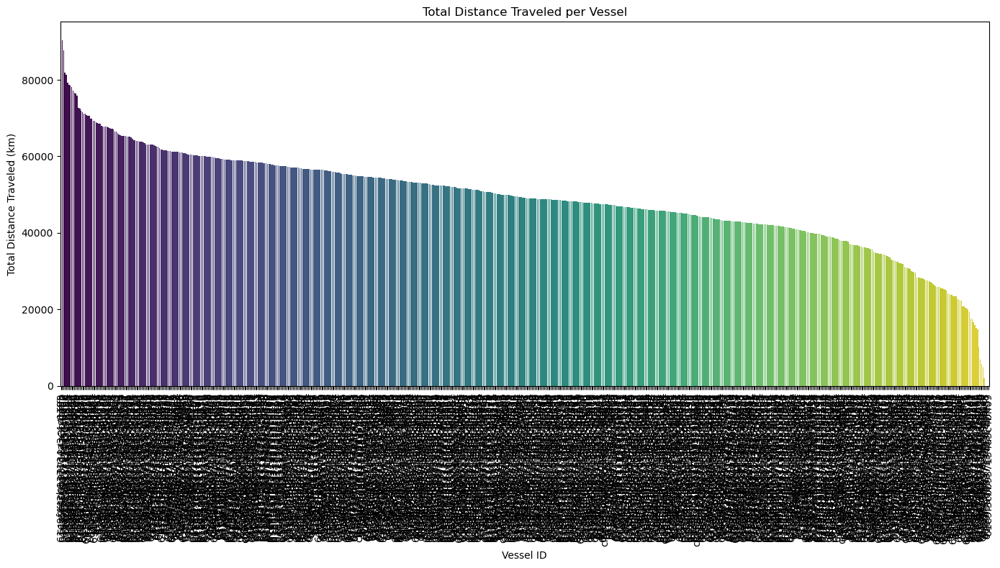

In [13]:
import numpy as np
import pandas as pd
from geopy.distance import geodesic  # or use haversine if preferred
from haversine import haversine, Unit


# Ensure the DataFrame is sorted
ais_train = ais_train.sort_values(by=['vesselId', 'time'])

# Create shifted columns
ais_train['prev_lat'] = ais_train.groupby('vesselId')['latitude_vessel'].shift()
ais_train['prev_lon'] = ais_train.groupby('vesselId')['longitude_vessel'].shift()

"""
# Define distance calculation using geodesic
def calculate_distance(row):
    if pd.isnull(row['prev_lat']) or pd.isnull(row['prev_lon']):
        return 0
    return geodesic((row['latitude_vessel'], row['longitude_vessel']),
                   (row['prev_lat'], row['prev_lon'])).meters
"""

 #Alternatively, use haversine for better performance
def calculate_distance(row):
    if pd.isnull(row['prev_lat']) or pd.isnull(row['prev_lon']):
        return 0
    return haversine((row['latitude_vessel'], row['longitude_vessel']),
                    (row['prev_lat'], row['prev_lon']),
                    unit=Unit.METERS)

# Apply the distance calculation
ais_train['distance'] = ais_train.apply(calculate_distance, axis=1)

     
# Drop shifted columns

# Fill NaN distances with 0
ais_train['distance'] = ais_train['distance'].fillna(0)

# Calculate cumulative distance
ais_train['cumulative_distance_km'] = ais_train.groupby('vesselId')['distance'].cumsum() / 1000

# Classify voyage type
ais_train['voyage_type'] = np.where(ais_train['cumulative_distance_km'] > 100, 'Long Sea', 'Short Sea')

print("Vessel grouping into 'Long Sea' and 'Short Sea' completed.")

import matplotlib.pyplot as plt
import seaborn as sns

# Calculate total distance per vessel in kilometers
total_distance = ais_train.groupby('vesselId')['distance'].sum().reset_index()
total_distance['total_distance_km'] = total_distance['distance'] / 1000  # Convert to kilometers

# Sort vessels by total distance for better visualization
total_distance = total_distance.sort_values(by='total_distance_km', ascending=False)

# Set plot size
plt.figure(figsize=(14, 8))

# Create bar plot
sns.barplot(
    x='vesselId',
    y='total_distance_km',
    data=total_distance,
    palette='viridis'
)

# Customize plot
plt.xticks(rotation=90)
plt.xlabel('Vessel ID')
plt.ylabel('Total Distance Traveled (km)')
plt.title('Total Distance Traveled per Vessel')
plt.tight_layout()

# Show plot
plt.show()



Average Distance Between Consecutive Entries per Vessel (Sorted by Average Distance in km):
                 vesselId  average_distance_m  average_distance_km
 61e9f42cb937134a3c4c00f9       275374.931665           275.374932
 61e9f38eb937134a3c4bfd8b       147326.996392           147.326996
 61e9f47ab937134a3c4c02f9       143066.676965           143.066677
 61e9f409b937134a3c4c0027       133117.673634           133.117674
 620bf33a718775aca4a81900       128834.450898           128.834451
 61e9f473b937134a3c4c02dd       125889.809029           125.889809
 61e9f3afb937134a3c4bfe47       125884.150762           125.884151
 61e9f460b937134a3c4c0243       118945.363014           118.945363
 61e9f418b937134a3c4c0077       117390.168816           117.390169
 61e9f3bcb937134a3c4bfe91       109987.520671           109.987521
 61e9f3f8b937134a3c4bffc9       108727.952279           108.727952
 61e9f3bab937134a3c4bfe8b       105161.398372           105.161398
 61e9f3aeb937134a3c4bfe45       10382

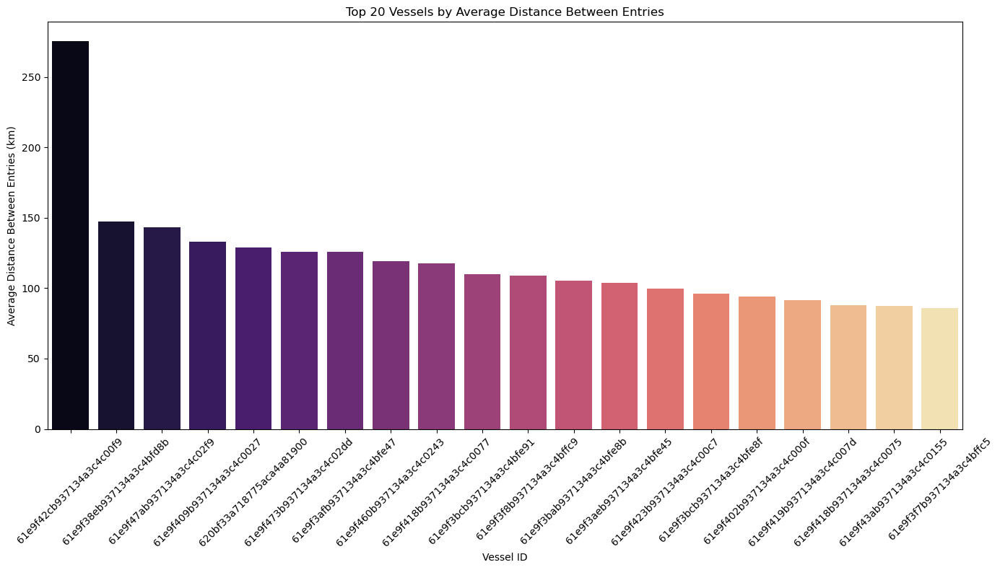

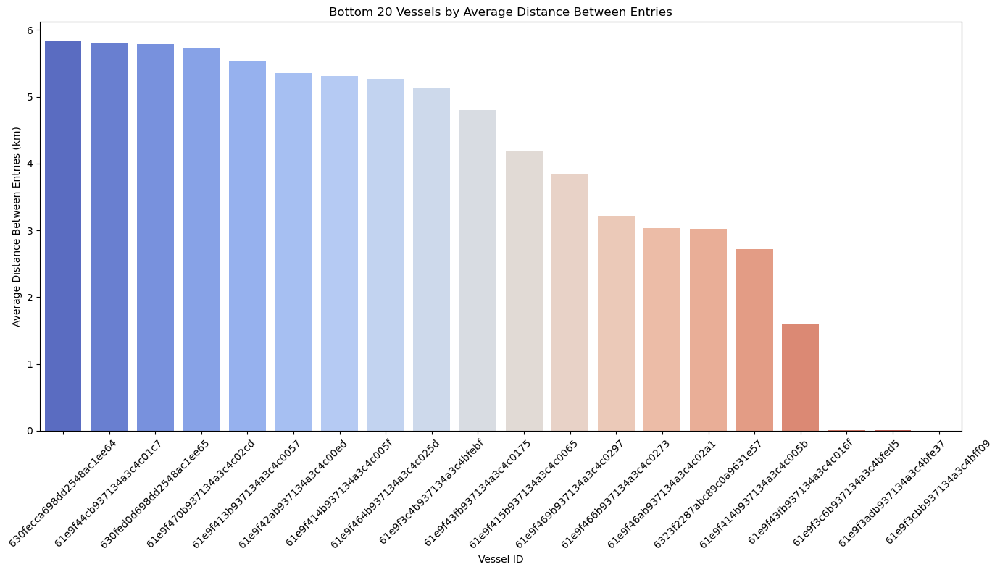

Average distances exported to 'average_distance_per_vessel_sorted.csv'.


In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Assuming 'ais_train' is your DataFrame and it's already loaded

# Step 1: Ensure the DataFrame is sorted by 'vesselId' and 'time'
ais_train = ais_train.sort_values(by=['vesselId', 'time'])

# Step 2: Calculate the average distance per vessel in meters
average_distance_m = ais_train.groupby('vesselId')['distance'].mean().reset_index()

# Rename the column for clarity
average_distance_m.rename(columns={'distance': 'average_distance_m'}, inplace=True)

# Step 3: Convert the average distance to kilometers
average_distance_m['average_distance_km'] = average_distance_m['average_distance_m'] / 1000

# Step 4: Sort the results by 'average_distance_km' in descending order
average_distance_sorted = average_distance_m.sort_values(by='average_distance_km', ascending=False).reset_index(drop=True)

# Step 5a: Print the sorted average distances
print("Average Distance Between Consecutive Entries per Vessel (Sorted by Average Distance in km):")
print(average_distance_sorted[['vesselId', 'average_distance_m', 'average_distance_km']].to_string(index=False))

# Step 5b: Plot the average distances for all vessels (if manageable)
num_vessels = len(average_distance_sorted)
if num_vessels <= 50:  # Adjust the threshold as needed
    plt.figure(figsize=(max(10, num_vessels * 0.3), 8))
    sns.barplot(
        x='vesselId',
        y='average_distance_km',
        data=average_distance_sorted,
        palette='viridis'
    )
    plt.xticks(rotation=90)
    plt.xlabel('Vessel ID')
    plt.ylabel('Average Distance Between Entries (km)')
    plt.title('Average Distance Between Consecutive Entries per Vessel')
    plt.tight_layout()
    plt.show()
else:
    print(f"Dataset contains {num_vessels} vessels. Consider plotting a subset for better visualization.")

# Step 6a: Plot Top N Vessels with Highest Average Distance
N = 20  # Adjust as needed
top_n_vessels = average_distance_sorted.head(N)

plt.figure(figsize=(14, 8))
sns.barplot(
    x='vesselId',
    y='average_distance_km',
    data=top_n_vessels,
    palette='magma'
)
plt.xticks(rotation=45)
plt.xlabel('Vessel ID')
plt.ylabel('Average Distance Between Entries (km)')
plt.title(f'Top {N} Vessels by Average Distance Between Entries')
plt.tight_layout()
plt.show()

# Step 6b: Plot Bottom N Vessels with Lowest Average Distance
bottom_n_vessels = average_distance_sorted.tail(N)

plt.figure(figsize=(14, 8))
sns.barplot(
    x='vesselId',
    y='average_distance_km',
    data=bottom_n_vessels,
    palette='coolwarm'
)
plt.xticks(rotation=45)
plt.xlabel('Vessel ID')
plt.ylabel('Average Distance Between Entries (km)')
plt.title(f'Bottom {N} Vessels by Average Distance Between Entries')
plt.tight_layout()
plt.show()

# Step 7: Create an Interactive Plot with Plotly
fig = px.bar(
    average_distance_sorted,
    x='vesselId',
    y='average_distance_km',
    title='Average Distance Between Consecutive Entries per Vessel',
    labels={'average_distance_km': 'Average Distance (km)', 'vesselId': 'Vessel ID'},
    hover_data=['average_distance_km'],
    height=600
)

fig.update_layout(
    xaxis_tickangle=-45,
    xaxis={'categoryorder':'total descending'}
)

fig.show()

# Step 8: Export the Results to CSV and Excel (Optional)
average_distance_sorted.to_csv('average_distance_per_vessel_sorted.csv', index=False)
print("Average distances exported to 'average_distance_per_vessel_sorted.csv'.")


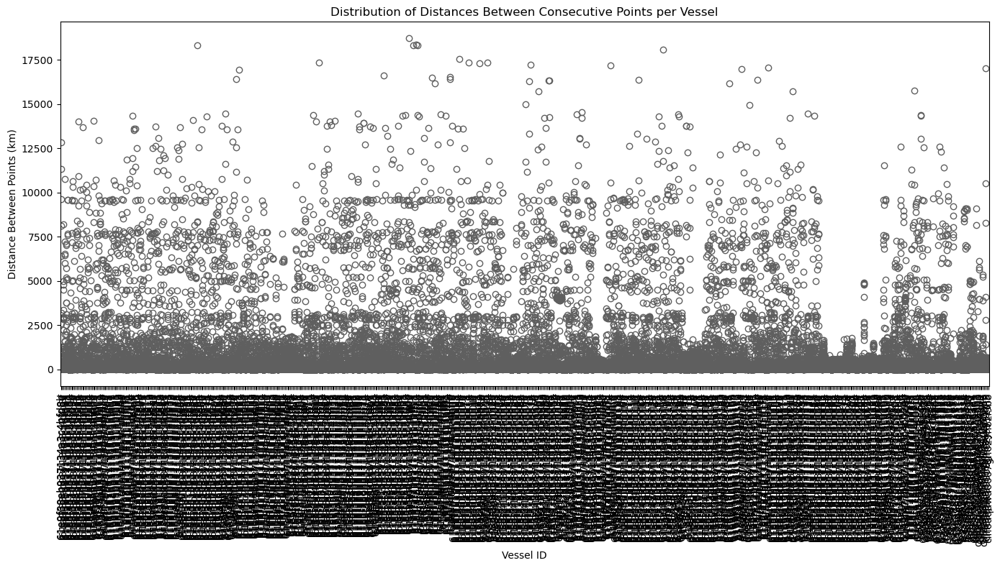

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Convert distance to kilometers for readability
ais_train['distance_km'] = ais_train['distance'] / 1000

# Set plot size
plt.figure(figsize=(14, 8))

# Create box plot
sns.boxplot(
    x='vesselId',
    y='distance_km',
    data=ais_train,
    palette='Set3'
)

# Customize plot
plt.xticks(rotation=90)
plt.xlabel('Vessel ID')
plt.ylabel('Distance Between Points (km)')
plt.title('Distribution of Distances Between Consecutive Points per Vessel')
plt.tight_layout()

# Show plot
plt.show()


Summary Statistics of Speeds (knots):
count    1.521377e+06
mean     6.232459e+00
std      9.193649e+00
min      0.000000e+00
25%      3.793398e-03
50%      3.350942e-01
75%      1.392365e+01
max      3.605936e+03
Name: speed_knots, dtype: float64

Number of anomalous speed records: 415 out of 1522065 (0.03%)


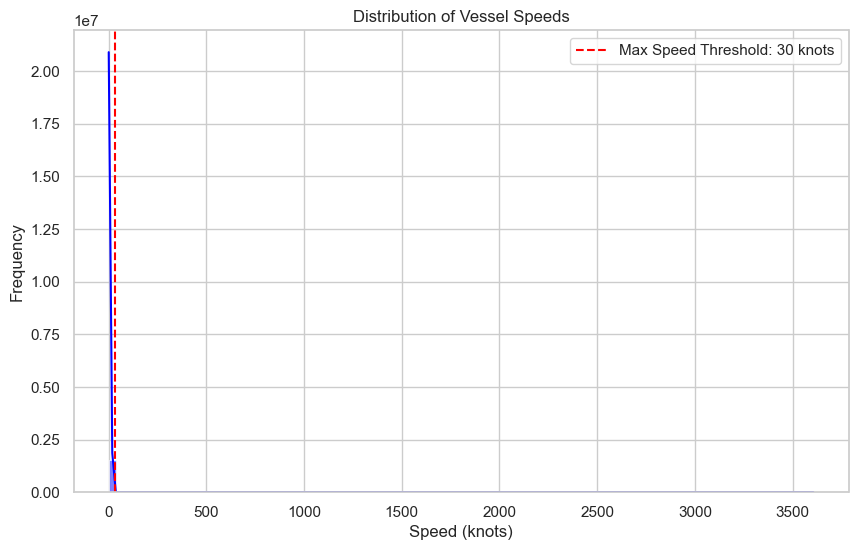


Anomalous Records (First 10):
                          vesselId                time  latitude_vessel  \
379       61e9f38eb937134a3c4bfd8b 2024-05-04 14:33:08         41.26654   
380       61e9f38eb937134a3c4bfd8b 2024-05-04 15:55:24         38.18549   
15850     61e9f392b937134a3c4bfd9b 2024-03-13 16:36:54         47.93531   
32846     61e9f398b937134a3c4bfdb3 2024-03-16 19:33:14         26.47745   
52707     61e9f39eb937134a3c4bfdcb 2024-03-25 02:34:09         53.93597   
...                            ...                 ...              ...   
1420261   631e3e46192150e13fa41627 2024-02-18 16:16:48         36.68169   
1426398   631e4091192150e13fa4162b 2024-04-03 09:01:42         40.64072   
1426399   631e4091192150e13fa4162b 2024-04-03 22:15:44         37.15016   
1505457  clh6aqawa0004gh0z12aogec9 2024-01-30 00:45:50         56.10948   
1505458  clh6aqawa0004gh0z12aogec9 2024-01-30 01:56:30         53.95814   

         longitude_vessel  speed_knots  
379               2.21116  

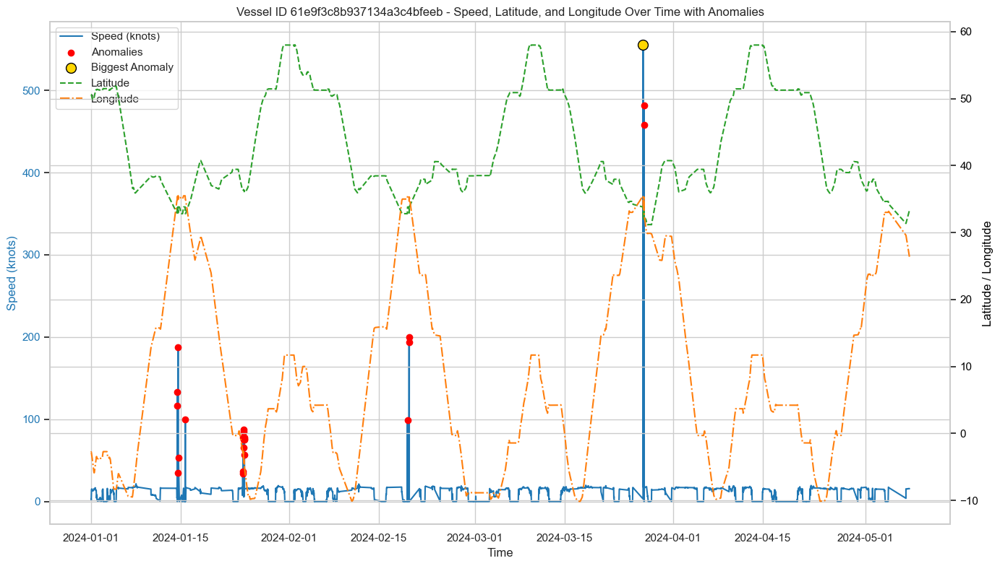


Surrounding Records for Vessel ID 61e9f3c8b937134a3c4bfeeb around the Biggest Anomaly:
                    time  latitude_vessel  longitude_vessel  speed_knots  \
3057 2024-03-25 16:38:13         34.41805          33.12620    16.704362   
3058 2024-03-25 16:58:19         34.32745          33.14954    16.564400   
3059 2024-03-25 17:16:27         34.24570          33.17165    16.604863   
3060 2024-03-25 17:23:07         34.21539          33.17992    16.753186   
3061 2024-03-27 06:44:40         33.81827          35.49080     3.149915   
3062 2024-03-27 06:58:47         31.93326          34.18690   555.503190   
3063 2024-03-27 07:38:22         31.98580          33.96810    17.587856   
3064 2024-03-27 07:58:52         32.01274          33.85458    17.597499   
3065 2024-03-27 08:18:58         32.03759          33.74481    17.293972   
3066 2024-03-27 08:39:15         32.06039          33.63502    17.046792   
3067 2024-03-27 08:59:39         32.07752          33.52445    16.852444   


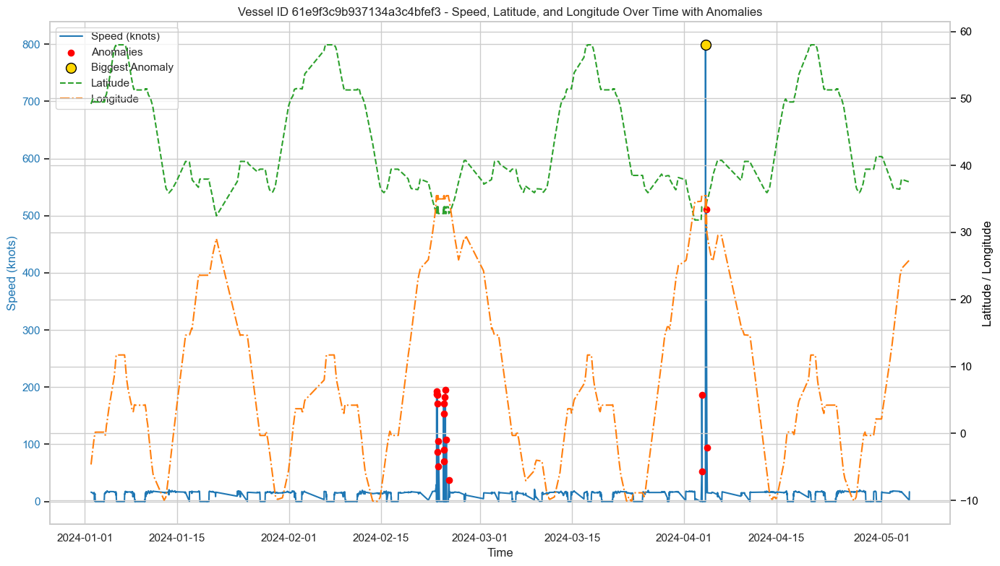


Surrounding Records for Vessel ID 61e9f3c9b937134a3c4bfef3 around the Biggest Anomaly:
                    time  latitude_vessel  longitude_vessel  speed_knots  \
3173 2024-04-04 03:16:19         33.81826          35.49081     0.006853   
3174 2024-04-04 03:34:19         33.81828          35.49079     0.005201   
3175 2024-04-04 03:40:09         33.81826          35.49080     0.013350   
3176 2024-04-04 05:39:49         33.81825          35.49080     0.000300   
3177 2024-04-04 05:54:59         33.81826          35.49081     0.003086   
3178 2024-04-04 06:11:09         33.93692          31.18302   799.042787   
3179 2024-04-04 07:31:03         34.13584          30.84773    15.416144   
3180 2024-04-04 07:48:16         34.17712          30.77743    14.935014   
3181 2024-04-04 08:15:59         33.81826          35.49080   511.068730   
3182 2024-04-04 11:15:42         34.69786          29.92982    93.979155   
3183 2024-04-04 12:43:35         34.90106          29.52440    16.003285   


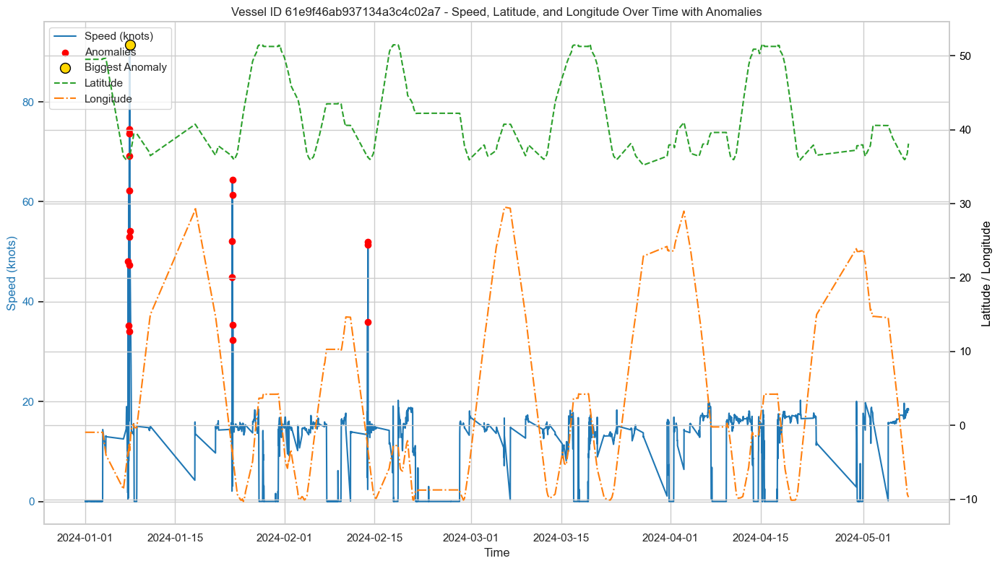


Surrounding Records for Vessel ID 61e9f46ab937134a3c4c02a7 around the Biggest Anomaly:
                   time  latitude_vessel  longitude_vessel  speed_knots  \
231 2024-01-07 20:59:23         36.33326          -2.58470    69.178134   
232 2024-01-07 21:19:55         36.28347          -2.95368    53.007480   
233 2024-01-07 21:34:58         36.30518          -2.77997    33.987694   
234 2024-01-07 21:54:58         36.25011          -3.28714    74.473939   
235 2024-01-07 22:15:01         36.30456          -2.78445    73.629115   
236 2024-01-07 22:35:12         36.23422          -3.41228    91.416014   
237 2024-01-07 22:55:40         36.27579          -3.03506    54.158521   
238 2024-01-08 03:28:57         37.32970          -0.82014    27.226014   
239 2024-01-08 04:56:29         37.56124          -0.50604    14.010224   
240 2024-01-08 05:18:58         37.62967          -0.44162    13.673796   
241 2024-01-08 05:37:47         37.68690          -0.38689    13.738269   

     time_d

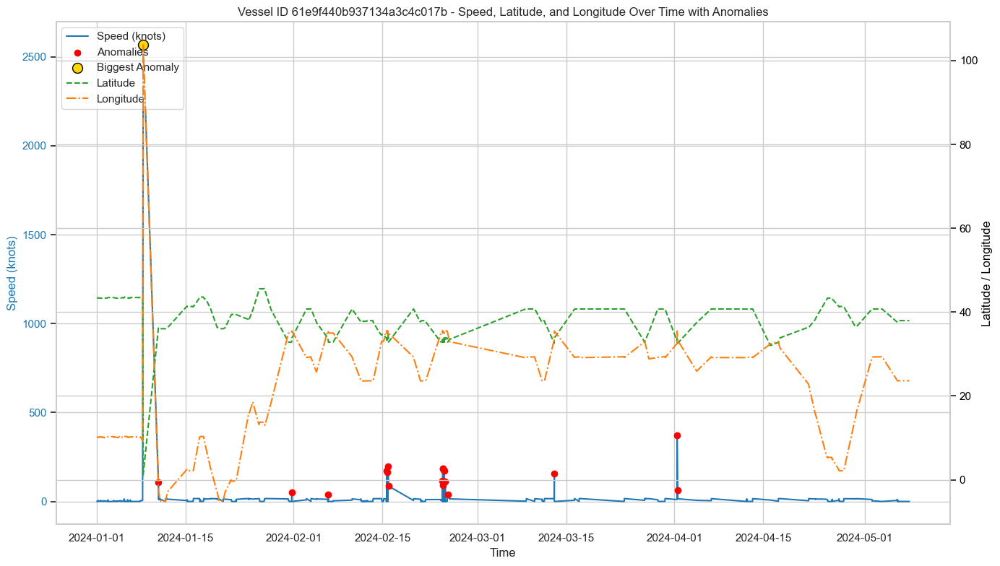


Surrounding Records for Vessel ID 61e9f440b937134a3c4c017b around the Biggest Anomaly:
                   time  latitude_vessel  longitude_vessel  speed_knots  \
478 2024-01-08 01:10:24         43.28801           9.80019     4.490549   
479 2024-01-08 01:20:34         43.28639           9.78255     4.598086   
480 2024-01-08 03:57:41         43.25345           9.47044     5.278898   
481 2024-01-08 04:06:43         43.25091           9.45013     6.001066   
482 2024-01-08 05:17:13         43.23345           9.29080     6.013199   
483 2024-01-08 07:26:57          1.18368         103.75900  2568.139004   
484 2024-01-10 17:13:55         36.34401          -2.82451   106.658995   
485 2024-01-10 17:23:22         36.33949          -2.86692    13.165217   
486 2024-01-10 17:54:52         36.31756          -3.02277    14.608121   
487 2024-01-10 18:15:03         36.30506          -3.11807    13.917267   
488 2024-01-10 18:35:37         36.29389          -3.21623    14.025231   

     time_d

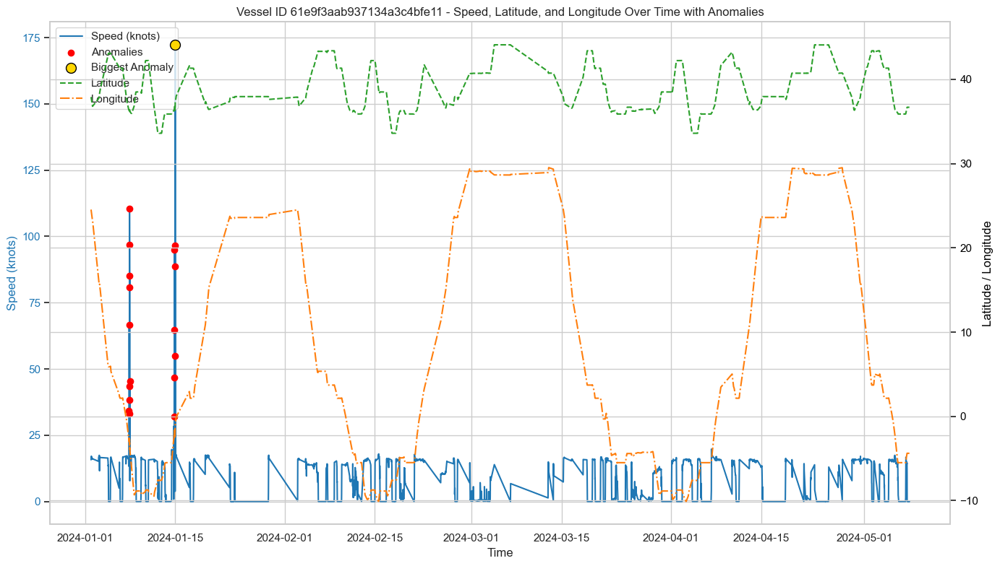


Surrounding Records for Vessel ID 61e9f3aab937134a3c4bfe11 around the Biggest Anomaly:
                   time  latitude_vessel  longitude_vessel  speed_knots  \
454 2024-01-14 22:17:20         36.47058          -2.03142    24.084575   
455 2024-01-14 22:37:32         36.51128          -1.97240    11.153682   
456 2024-01-14 22:57:28         36.31090          -2.58722    96.638203   
457 2024-01-14 23:18:28         36.49905          -1.98966    88.743864   
458 2024-01-14 23:35:47         36.51128          -1.97240     3.849049   
459 2024-01-14 23:58:17         37.23085          -0.97311   172.274529   
460 2024-01-15 00:19:35         37.29815          -0.87807    17.131193   
461 2024-01-15 00:39:59         37.36321          -0.78748    17.148162   
462 2024-01-15 00:55:00         37.41088          -0.72071    17.117931   
463 2024-01-15 01:15:00         37.47523          -0.62965    17.442051   
464 2024-01-15 01:35:29         37.54201          -0.53582    17.595197   

     time_d

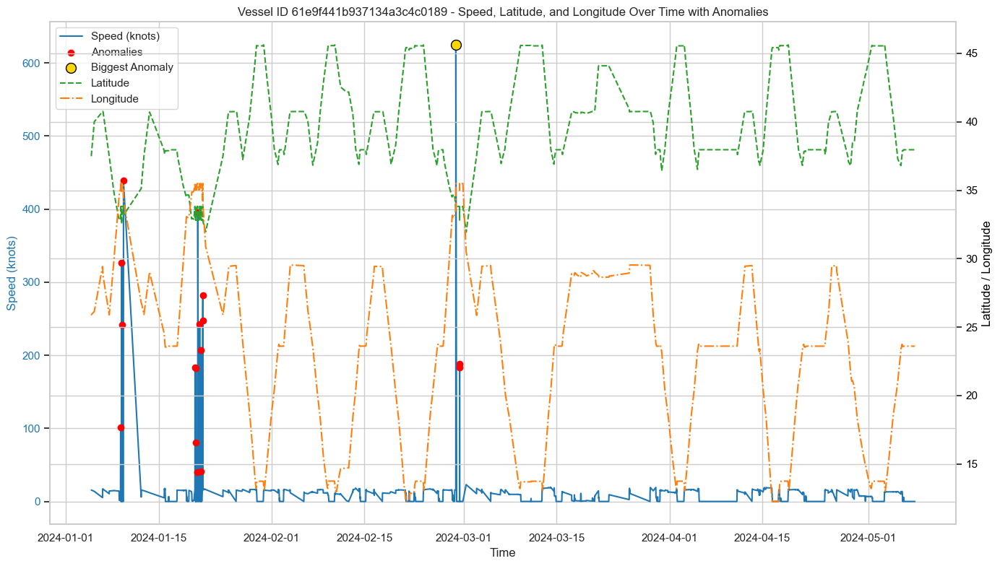


Surrounding Records for Vessel ID 61e9f441b937134a3c4c0189 around the Biggest Anomaly:
                    time  latitude_vessel  longitude_vessel  speed_knots  \
1228 2024-02-28 17:23:22         34.02244          33.42128    15.558192   
1229 2024-02-28 17:42:22         33.94985          33.46505    15.363976   
1230 2024-02-28 18:09:52         33.84338          33.52605    15.419174   
1231 2024-02-28 18:30:01         33.76475          33.56988    15.466481   
1232 2024-02-28 18:56:46         33.65948          33.62724    15.538442   
1233 2024-02-28 19:05:46         33.81825          35.49080   624.846528   
1234 2024-02-28 21:56:19         33.81825          35.49103     0.004045   
1235 2024-02-28 22:16:38         33.81826          35.49080     0.034001   
1236 2024-02-28 22:37:19         33.81825          35.49082     0.003381   
1237 2024-02-28 22:39:59         33.81825          35.49082     0.000000   
1238 2024-02-28 23:38:48         33.81827          35.49079     0.001958   


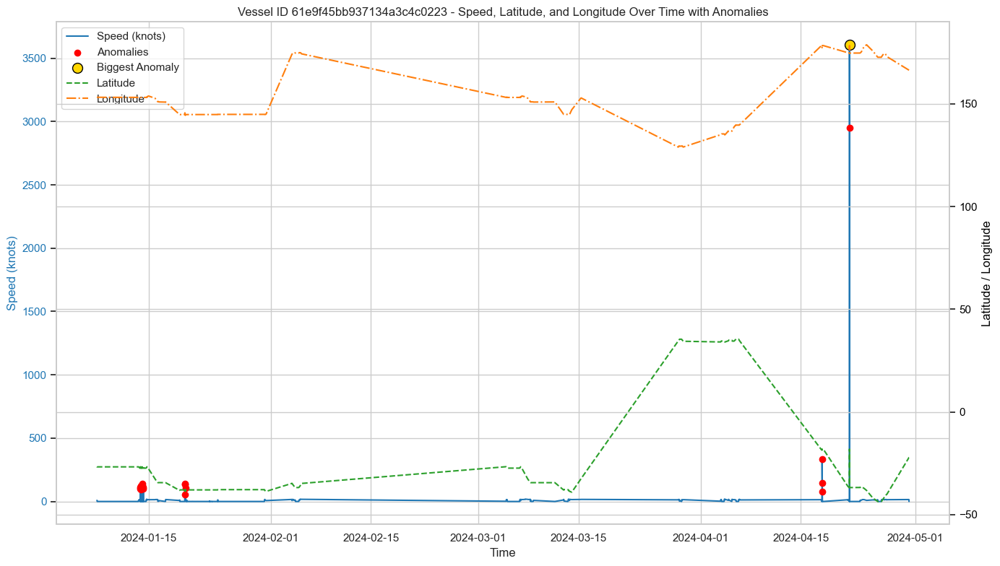


Surrounding Records for Vessel ID 61e9f45bb937134a3c4c0223 around the Biggest Anomaly:
                    time  latitude_vessel  longitude_vessel  speed_knots  \
1093 2024-04-21 17:19:26        -36.80390         174.82221    11.721855   
1094 2024-04-21 17:34:10        -36.83969         174.80641     9.267347   
1095 2024-04-21 17:54:23        -36.83781         174.77260     4.844433   
1096 2024-04-21 18:06:02        -36.84041         174.77267     0.802568   
1097 2024-04-21 18:33:02        -36.84037         174.77269     0.005740   
1098 2024-04-21 18:51:56        -18.13405         178.42346  3605.936047   
1099 2024-04-21 19:15:02        -36.84038         174.77267  2950.313307   
1100 2024-04-21 19:33:03        -36.84035         174.77270     0.007681   
1101 2024-04-21 19:54:02        -36.84039         174.77267     0.008003   
1102 2024-04-21 20:15:49        -36.84039         174.77267     0.000000   
1103 2024-04-21 20:38:44        -36.84039         174.77268     0.001261   


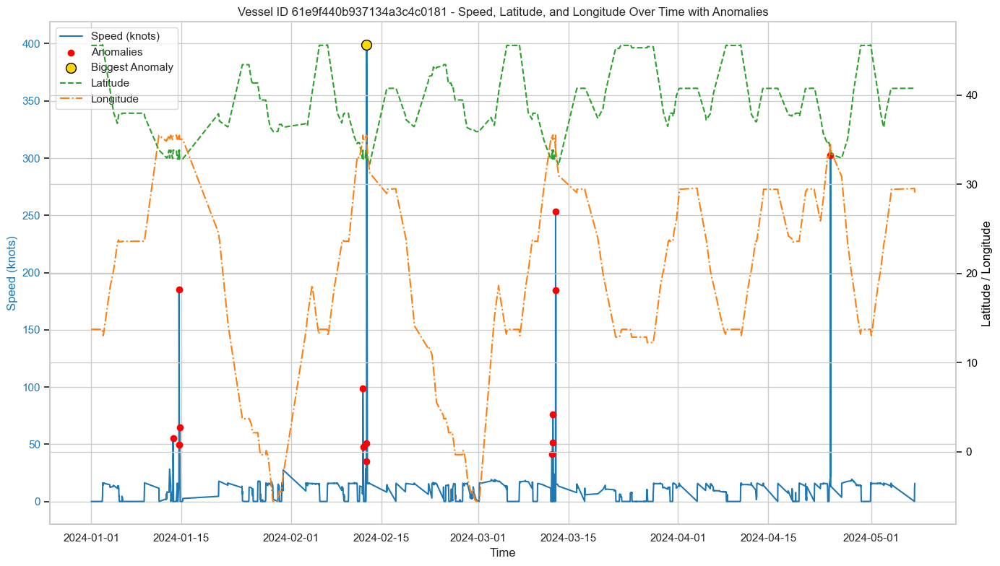


Surrounding Records for Vessel ID 61e9f440b937134a3c4c0181 around the Biggest Anomaly:
                    time  latitude_vessel  longitude_vessel  speed_knots  \
1172 2024-02-12 11:39:05         32.81058          35.03241     0.000959   
1173 2024-02-12 13:54:06         33.81828          35.49079    28.707027   
1174 2024-02-12 13:57:02         33.81828          35.49080     0.010225   
1175 2024-02-12 15:44:51         32.85321          35.01695    34.787262   
1176 2024-02-12 16:58:50         33.81829          35.49081    50.696437   
1177 2024-02-12 17:09:14         32.92852          34.61333   399.006312   
1178 2024-02-12 20:08:50         32.92510          33.69424    15.506584   
1179 2024-02-12 23:51:56         32.61155          32.59378    15.801404   
1180 2024-02-13 02:19:56         32.40564          31.87357    15.634958   
1181 2024-02-13 02:34:57         32.38526          31.79909    15.884916   
1182 2024-02-13 02:54:26         32.35787          31.70252    15.933730   


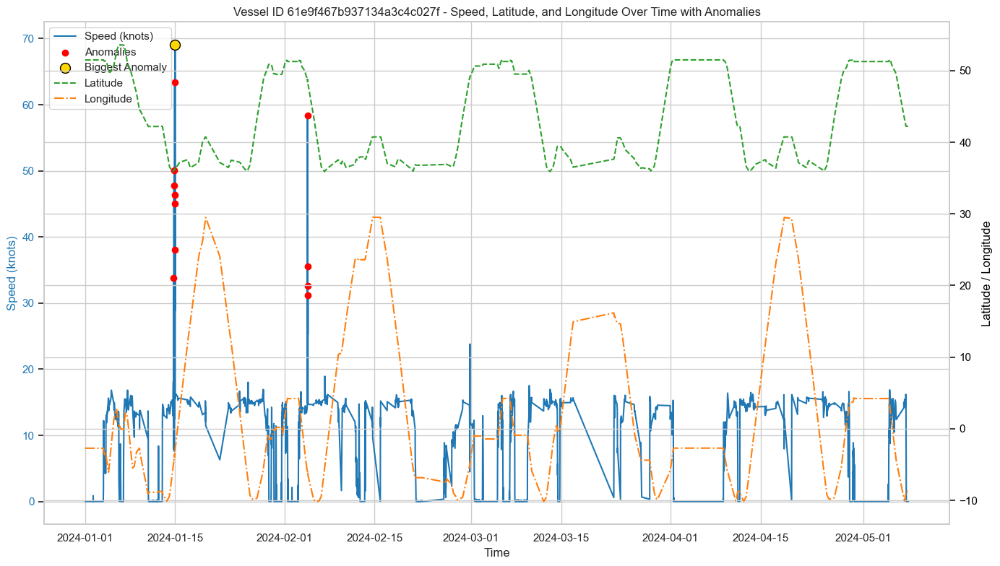


Surrounding Records for Vessel ID 61e9f467b937134a3c4c027f around the Biggest Anomaly:
                   time  latitude_vessel  longitude_vessel  speed_knots  \
724 2024-01-14 22:17:20         36.22237          -3.46721    63.353059   
725 2024-01-14 22:37:40         36.21333          -3.55381    12.509072   
726 2024-01-14 22:58:09         36.24975          -3.23994    45.084183   
727 2024-01-14 23:18:32         36.21252          -3.56109    46.355556   
728 2024-01-14 23:39:01         36.23499          -3.36031    28.822550   
729 2024-01-14 23:58:22         36.29436          -2.90716    69.064313   
730 2024-01-15 00:19:58         36.30803          -2.79346    15.485514   
731 2024-01-15 00:39:58         36.32065          -2.68749    15.581604   
732 2024-01-15 00:52:46         36.32997          -2.61881    15.826669   
733 2024-01-15 01:14:34         36.34700          -2.50032    16.056301   
734 2024-01-15 01:35:34         36.36323          -2.38501    16.207129   

     time_d

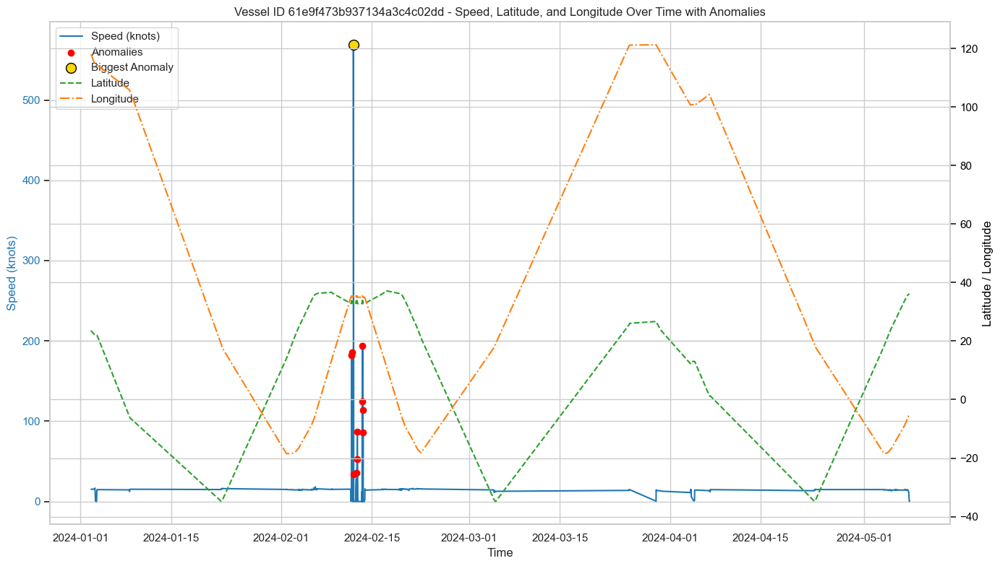


Surrounding Records for Vessel ID 61e9f473b937134a3c4c02dd around the Biggest Anomaly:
                   time  latitude_vessel  longitude_vessel  speed_knots  \
207 2024-02-11 21:35:00         32.82168          35.00301     3.798076   
208 2024-02-11 21:46:36         32.82010          35.00258     0.502133   
209 2024-02-11 23:12:37         32.82008          35.00252     0.002275   
210 2024-02-12 01:15:15         32.82011          35.00249     0.001150   
211 2024-02-12 03:09:57         33.81827          35.49081    33.803873   
212 2024-02-12 03:16:46         32.82009          35.00251   568.804088   
213 2024-02-12 04:30:56         32.82008          35.00253     0.000951   
214 2024-02-12 05:37:36         32.82007          35.00253     0.000539   
215 2024-02-12 05:58:07         32.82007          35.00253     0.000000   
216 2024-02-12 06:18:36         32.82009          35.00254     0.003808   
217 2024-02-12 06:24:47         32.82009          35.00254     0.000000   

     time_d

In [16]:
import pandas as pd
import numpy as np
from geopy.distance import geodesic
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import os

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

# Load the data
# Replace with your actual file paths
ais_train = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_train.csv', delimiter='|')

# Convert 'time' to datetime
ais_train['time'] = pd.to_datetime(ais_train['time'])

# Ensure latitude and longitude are numeric
ais_train['latitude_vessel'] = pd.to_numeric(ais_train['latitude_vessel'], errors='coerce')
ais_train['longitude_vessel'] = pd.to_numeric(ais_train['longitude_vessel'], errors='coerce')

# Sort the DataFrame by 'vesselId' and 'time'
ais_train_sorted = ais_train.sort_values(['vesselId', 'time']).reset_index(drop=True)

# Initialize a new column for distance
ais_train_sorted['distance_meters'] = np.nan

# Function to compute distance between two points
def compute_distance(row):
    if pd.isnull(row['prev_latitude']) or pd.isnull(row['prev_longitude']):
        return np.nan
    else:
        point1 = (row['prev_latitude'], row['prev_longitude'])
        point2 = (row['latitude_vessel'], row['longitude_vessel'])
        return geodesic(point1, point2).meters

# Shift the latitude and longitude to get previous points
ais_train_sorted['prev_latitude'] = ais_train_sorted.groupby('vesselId')['latitude_vessel'].shift(1)
ais_train_sorted['prev_longitude'] = ais_train_sorted.groupby('vesselId')['longitude_vessel'].shift(1)

# Apply the distance calculation
ais_train_sorted['distance_meters'] = ais_train_sorted.apply(compute_distance, axis=1)

# Drop the intermediate shifted columns if not needed
ais_train_sorted.drop(columns=['prev_latitude', 'prev_longitude'], inplace=True)

# Calculate time difference in seconds
ais_train_sorted['time_diff_seconds'] = ais_train_sorted.groupby('vesselId')['time'].diff().dt.total_seconds()

# Calculate speed in meters per second
ais_train_sorted['speed_m_s'] = ais_train_sorted['distance_meters'] / ais_train_sorted['time_diff_seconds']

# Convert speed to knots (1 m/s ≈ 1.94384 knots)
ais_train_sorted['speed_knots'] = ais_train_sorted['speed_m_s'] * 1.94384

# Define a realistic maximum speed threshold in knots
MAX_REALISTIC_SPEED_KNOTS = 30  # Adjust based on your dataset's vessel types

# Flag rows where speed exceeds the threshold
ais_train_sorted['speed_anomaly'] = ais_train_sorted['speed_knots'] > MAX_REALISTIC_SPEED_KNOTS

# Summary Statistics
print("Summary Statistics of Speeds (knots):")
print(ais_train_sorted['speed_knots'].describe())

# Count the number of anomalies
num_anomalies = ais_train_sorted['speed_anomaly'].sum()
total_records = ais_train_sorted['speed_anomaly'].count()
print(f"\nNumber of anomalous speed records: {num_anomalies} out of {total_records} ({(num_anomalies/total_records)*100:.2f}%)")

# Plot the distribution of speeds
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.histplot(ais_train_sorted['speed_knots'].dropna(), bins=100, kde=True, color='blue')
plt.axvline(MAX_REALISTIC_SPEED_KNOTS, color='red', linestyle='--', label=f'Max Speed Threshold: {MAX_REALISTIC_SPEED_KNOTS} knots')
plt.title('Distribution of Vessel Speeds')
plt.xlabel('Speed (knots)')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# Filter anomalous records
anomalies = ais_train_sorted[ais_train_sorted['speed_anomaly']]

print(f"\nAnomalous Records (First 10):\n{anomalies[['vesselId', 'time', 'latitude_vessel', 'longitude_vessel', 'speed_knots']]}\n")

# Count anomalies per vessel
anomalies_per_vessel = anomalies.groupby('vesselId').size().sort_values(ascending=False)

print("Top 10 Vessels with Most Anomalies:")
print(anomalies_per_vessel.head(10))

# Create a directory for plots if it doesn't exist
os.makedirs('vessel_plots', exist_ok=True)

# Function to retrieve surrounding records
def get_surrounding_records(df, anomaly_pos, window=5):
    """
    Retrieves records surrounding the anomaly position.

    Parameters:
    - df (pd.DataFrame): The DataFrame sorted by 'vesselId' and 'time'.
    - anomaly_pos (int): The local position of the anomaly in the DataFrame.
    - window (int): Number of records to retrieve before and after the anomaly.

    Returns:
    - pd.DataFrame: A subset of the DataFrame containing surrounding records.
    """
    start_idx = max(anomaly_pos - window, 0)
    end_idx = anomaly_pos + window + 1  # +1 to include the anomaly
    return df.iloc[start_idx:end_idx]

# Visualize anomalies on a map
# Create a base map centered around the mean location
mean_lat = ais_train_sorted['latitude_vessel'].mean()
mean_lon = ais_train_sorted['longitude_vessel'].mean()
m = folium.Map(location=[mean_lat, mean_lon], zoom_start=2)

# Add anomalous points to the map
for _, row in anomalies.iterrows():
    folium.CircleMarker(
        location=[row['latitude_vessel'], row['longitude_vessel']],
        radius=5,
        popup=f"Vessel ID: {row['vesselId']}<br>Speed: {row['speed_knots']:.2f} knots<br>Time: {row['time']}",
        color='red',
        fill=True,
        fill_color='red'
    ).add_to(m)

# Save the map to an HTML file
m.save('anomalies_map.html')
print("Anomalies map saved as 'anomalies_map.html'. Open this file in a browser to view the map.")

# Visualize Speed, Latitude, and Longitude Over Time for Top 10 Vessels with Most Anomalies
top_vessels = anomalies_per_vessel.head(10).index.tolist()

for vessel in top_vessels:
    vessel_data = ais_train_sorted[ais_train_sorted['vesselId'] == vessel].reset_index(drop=True)  # Reset index for local position
    vessel_anomalies = anomalies[anomalies['vesselId'] == vessel]
    
    if vessel_anomalies.empty:
        print(f"No anomalies found for Vessel ID {vessel}. Skipping plot.")
        continue
    
    # Identify the biggest anomaly (maximum speed)
    biggest_anomaly = vessel_anomalies.loc[vessel_anomalies['speed_knots'].idxmax()]
    
    # Find the local position of the anomaly within vessel_data
    # Since vessel_data is reset_index(drop=True), we can use boolean indexing
    anomaly_positions = vessel_data[vessel_data['time'] == biggest_anomaly['time']].index.tolist()
    
    if not anomaly_positions:
        print(f"No matching time found for the biggest anomaly in Vessel ID {vessel}. Skipping surrounding records.")
        surrounding_records = pd.DataFrame()
    else:
        anomaly_pos = anomaly_positions[0]
        # Retrieve surrounding records
        surrounding_records = get_surrounding_records(vessel_data, anomaly_pos, window=5)
    
    # Initialize the plot
    fig, ax1 = plt.subplots(figsize=(14, 8))
    
    # Plot Speed on the primary y-axis
    color_speed = 'tab:blue'
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Speed (knots)', color=color_speed)
    ax1.plot(vessel_data['time'], vessel_data['speed_knots'], label='Speed (knots)', color=color_speed)
    ax1.tick_params(axis='y', labelcolor=color_speed)
    
    # Plot Anomalies on the primary y-axis
    ax1.scatter(vessel_anomalies['time'], vessel_anomalies['speed_knots'], color='red', label='Anomalies', zorder=5)
    
    # Highlight the biggest anomaly
    ax1.scatter(biggest_anomaly['time'], biggest_anomaly['speed_knots'], color='gold', s=100, label='Biggest Anomaly', edgecolors='black', zorder=10)
    
    # Create a secondary y-axis for Latitude and Longitude
    ax2 = ax1.twinx()
    
    color_lat = 'tab:green'
    color_lon = 'tab:orange'
    ax2.set_ylabel('Latitude / Longitude', color='black')  # We'll handle color in the plots
    
    # Plot Latitude
    ax2.plot(vessel_data['time'], vessel_data['latitude_vessel'], label='Latitude', color=color_lat, linestyle='--')
    
    # Plot Longitude
    ax2.plot(vessel_data['time'], vessel_data['longitude_vessel'], label='Longitude', color=color_lon, linestyle='-.')
     
    ax2.tick_params(axis='y', labelcolor='black')
    
    # Combine legends from both axes
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')
    
    # Set plot title
    plt.title(f'Vessel ID {vessel} - Speed, Latitude, and Longitude Over Time with Anomalies')
    
    # Improve layout
    fig.tight_layout()
    
    # Show the plot
    plt.show()
    
    # Print surrounding records if available
    if not surrounding_records.empty:
        print(f"\nSurrounding Records for Vessel ID {vessel} around the Biggest Anomaly:")
        print(surrounding_records[['time', 'latitude_vessel', 'longitude_vessel', 'speed_knots', 'time_diff_seconds']])
    else:
        print(f"\nNo surrounding records found for Vessel ID {vessel} around the Biggest Anomaly.")
    
    print("\n" + "-"*80 + "\n")
    
    # Save the plot to the designated directory
    plt.savefig(f'vessel_plots/vessel_{vessel}_speed_lat_lon.png')
    plt.close()
    print(f"Plot saved for Vessel ID {vessel} as 'vessel_plots/vessel_{vessel}_speed_lat_lon.png'\n")


Data range after filtering: 2024-04-01 00:00:56 to 2024-05-07 23:59:08
Analyzing seasonality for each vessel based on latitude and longitude...


Processing Vessels: 100%|██████████| 683/683 [00:00<00:00, 816.01it/s]



Number of vessels flagged with seasonality in both latitude and longitude: 4
Flagged Vessels:
                     vesselId  latitude_seasonality_score  \
566  61e9f464b937134a3c4c0263                    0.259730   
593  61e9f469b937134a3c4c029f                    0.214305   
598  61e9f46ab937134a3c4c02a9                    0.521723   
603  61e9f46bb937134a3c4c02b3                    0.358317   

     latitude_seasonal_strength  longitude_seasonality_score  \
566                    0.275397                     0.294989   
593                    0.273724                     0.230623   
598                    0.733558                     0.481583   
603                    0.578823                     0.309323   

     longitude_seasonal_strength  
566                     0.236987  
593                     0.320195  
598                     0.713980  
603                     0.561410  


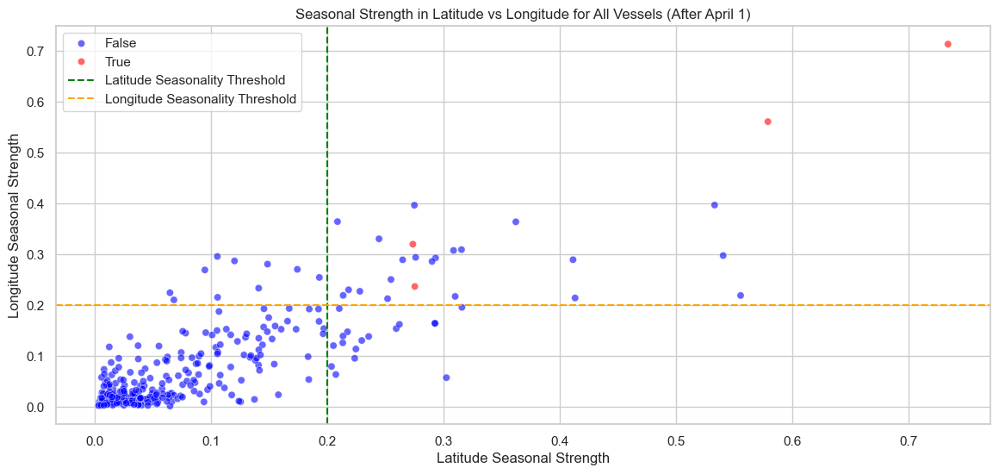

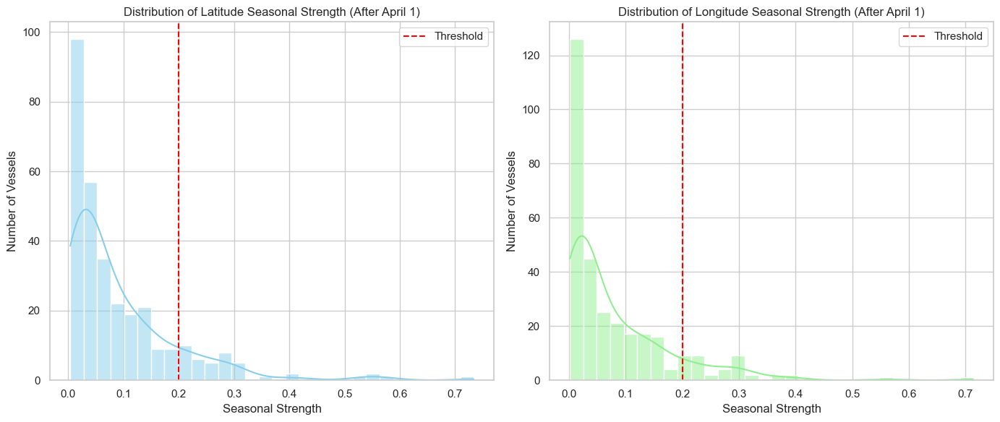


Plotting seasonal decomposition for 4 flagged vessels...


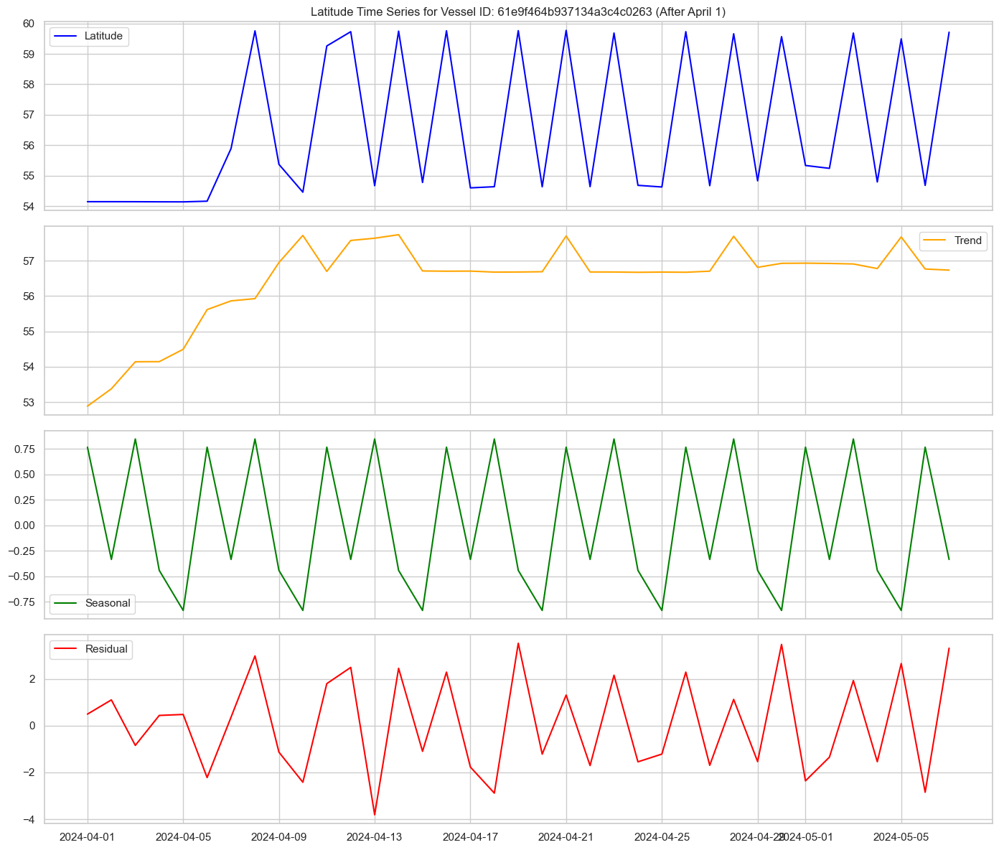

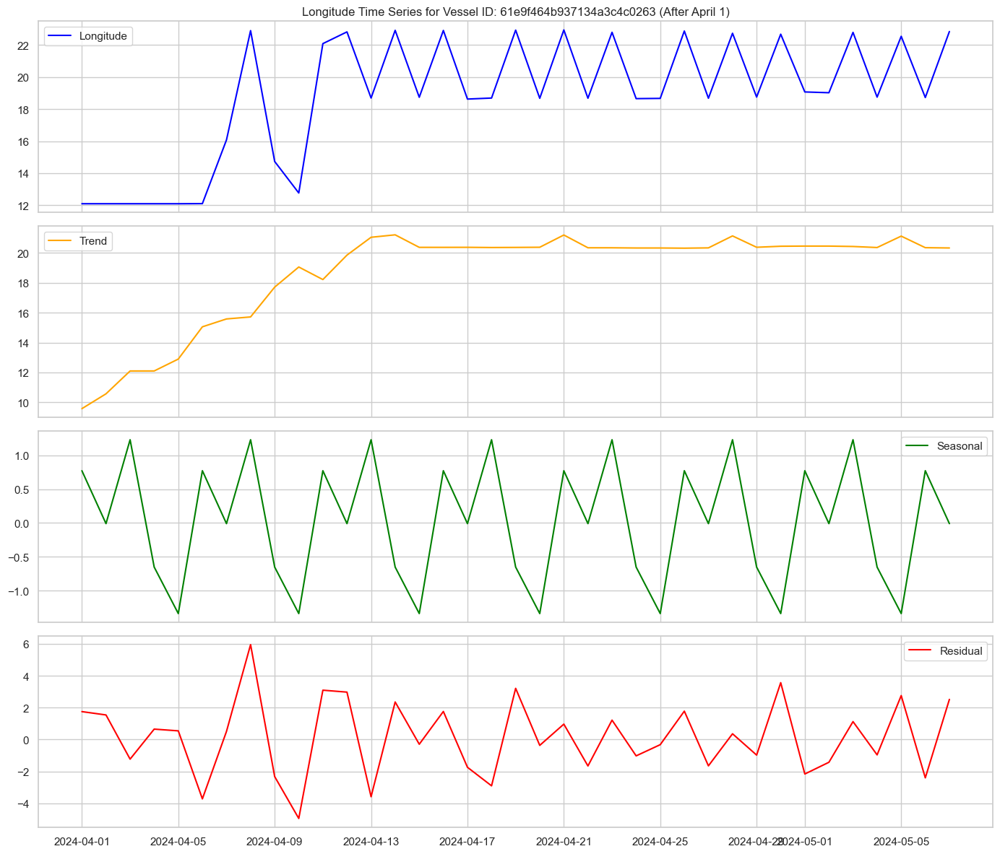

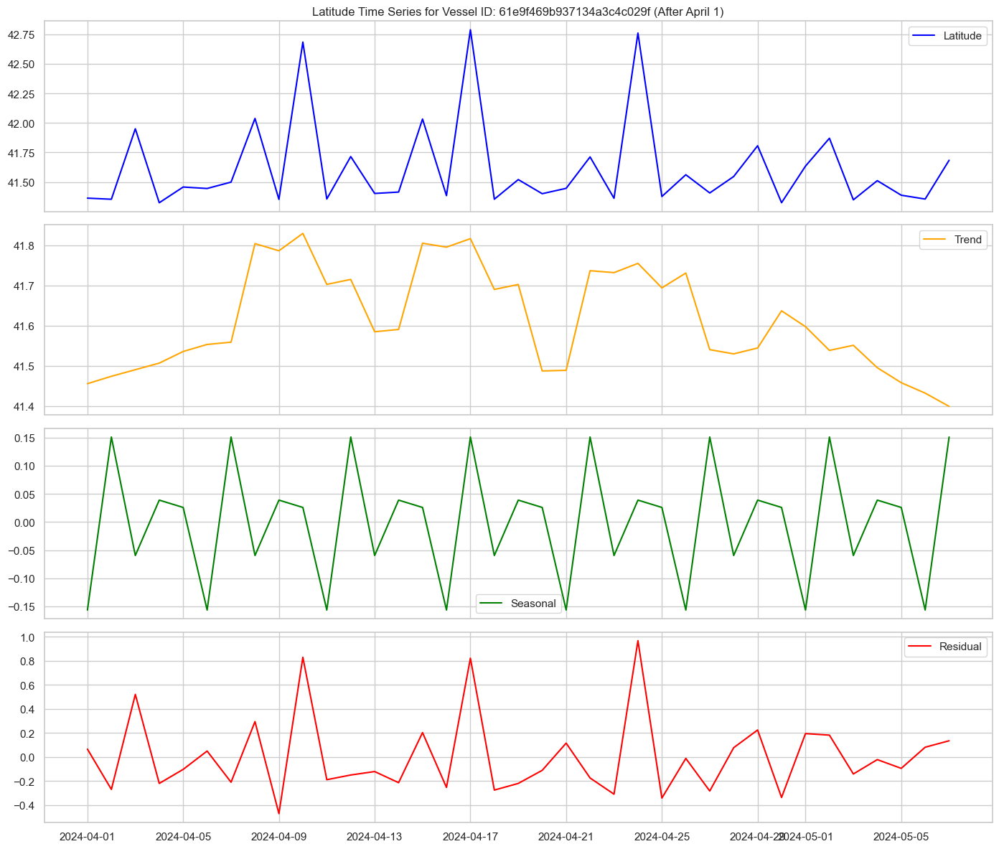

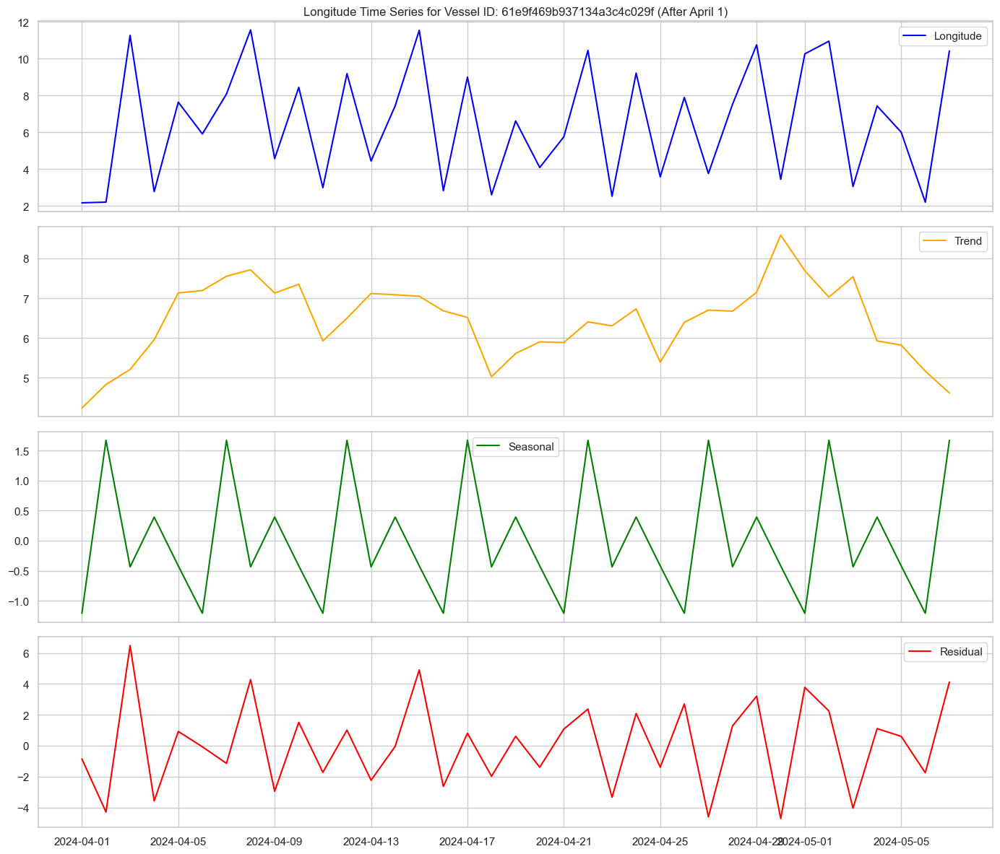

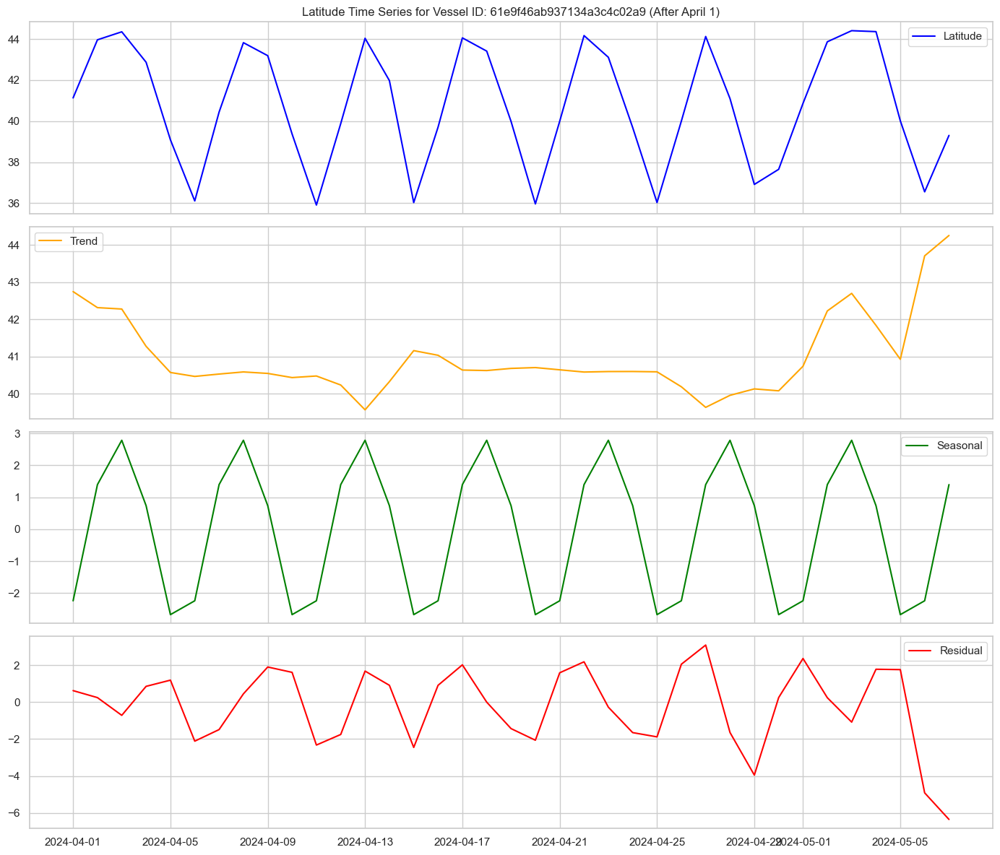

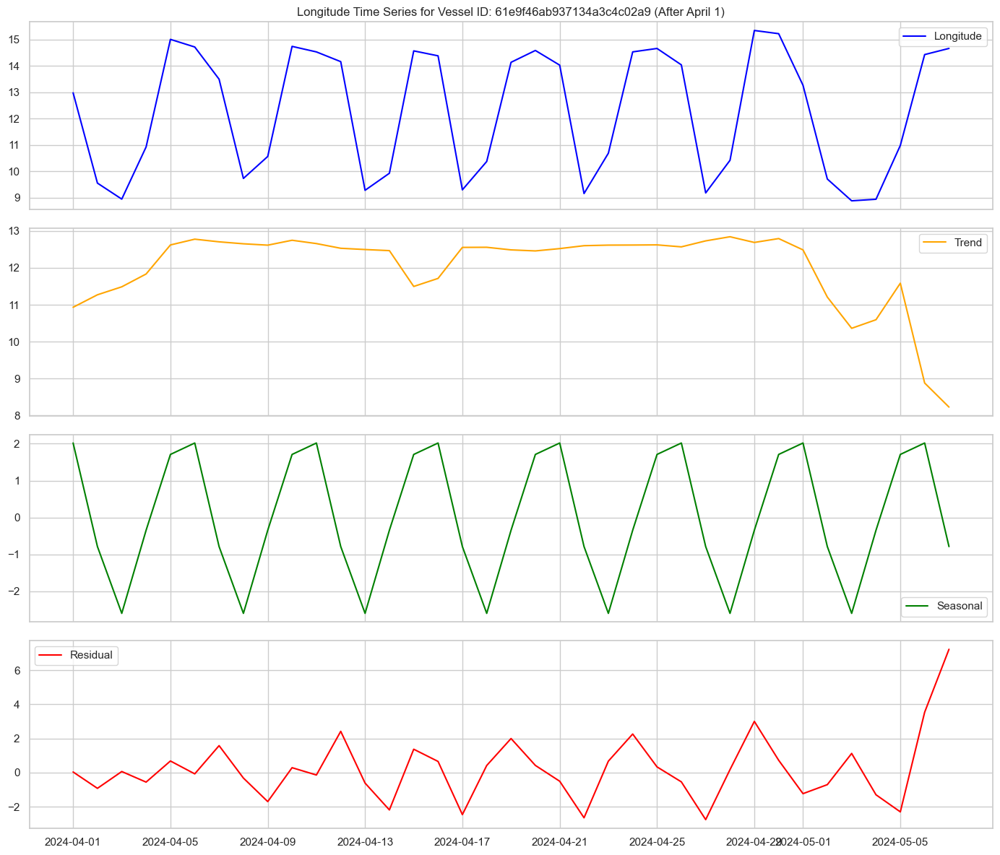

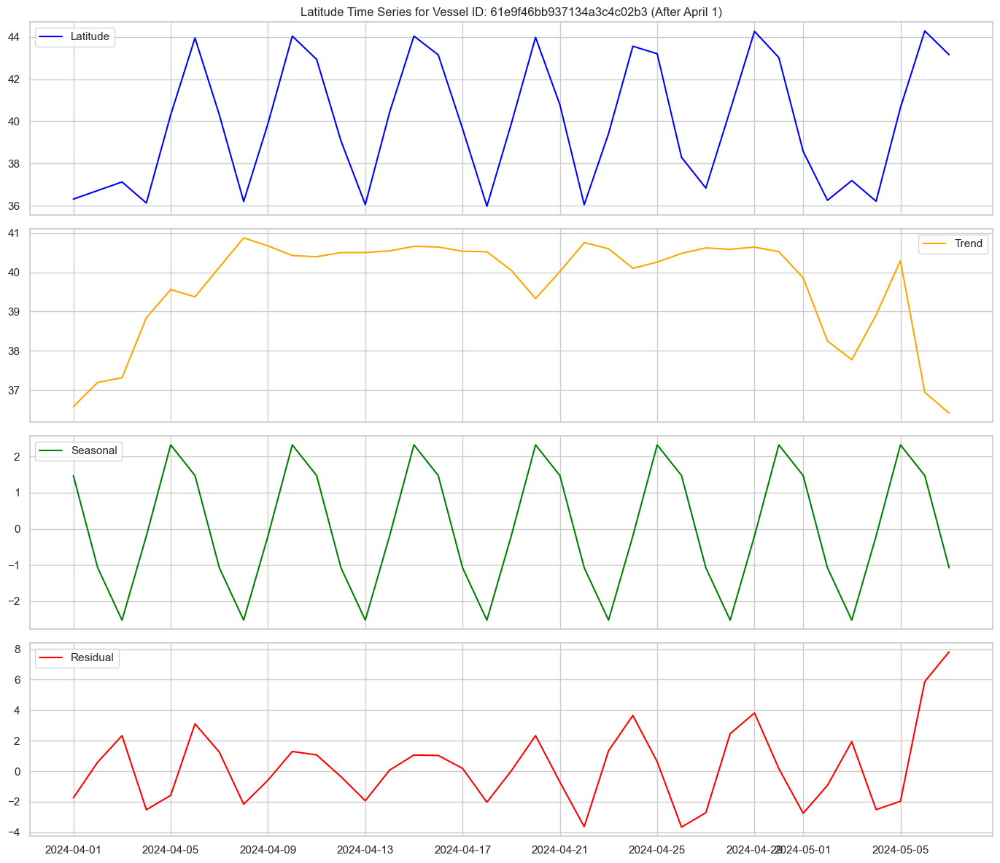

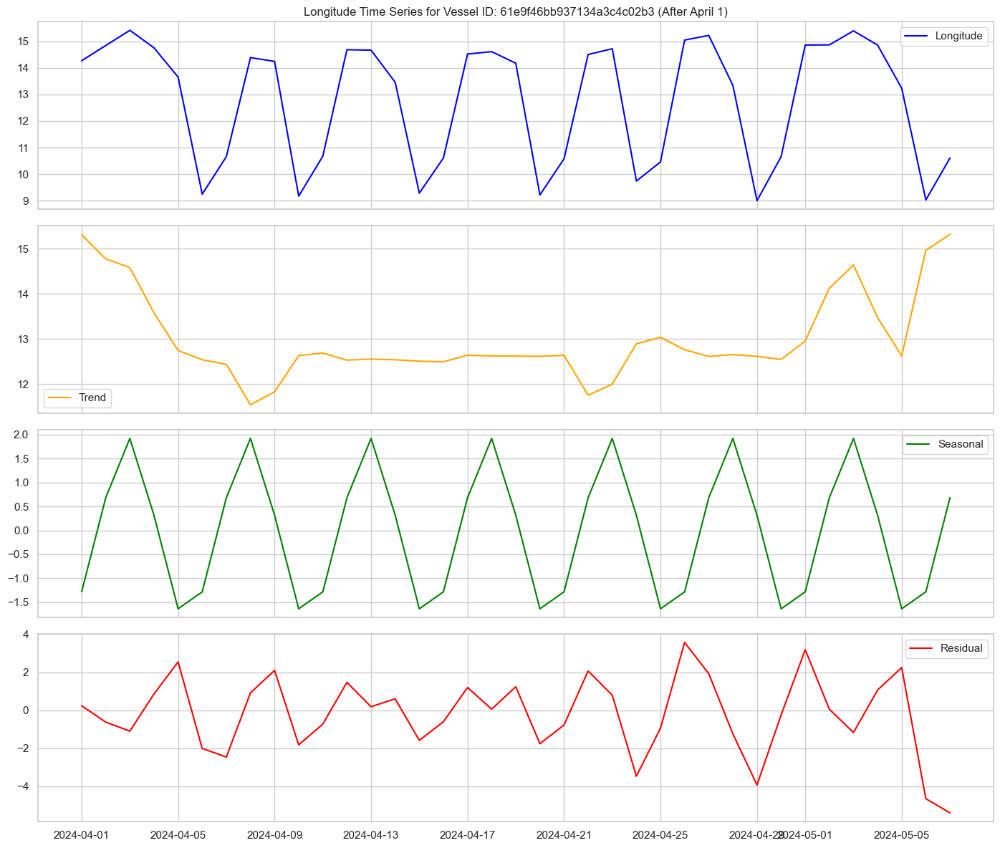

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf
from tqdm import tqdm
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# 1. Load the Data
# Replace the file path with your actual data file path
data_file_path = '/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_train.csv'

# Load the dataset with appropriate delimiter
df = pd.read_csv(data_file_path, delimiter='|')

# 2. Data Preprocessing

# Convert 'time' column to datetime
df['time'] = pd.to_datetime(df['time'])

# Sort the data by 'vesselId' and 'time'
df = df.sort_values(['vesselId', 'time'])

# Drop rows with missing values in essential columns
df = df.dropna(subset=['vesselId', 'latitude_vessel', 'longitude_vessel', 'time'])

# Create a new column for date (without time)
df['date'] = df['time'].dt.date

# Filter data to include only records after April 1
# Determine the year(s) present in the data
years_present = df['time'].dt.year.unique()
if len(years_present) != 1:
    raise ValueError("Data contains multiple years. Please specify the year for filtering.")
year = years_present[0]

# Define the cutoff date: April 1 of the identified year
cutoff_date = pd.to_datetime(f'{year}-04-01')

# Filter the dataframe to include only records on or after April 1
df = df[df['time'] >= cutoff_date]

# Verify the filtering
print(f"Data range after filtering: {df['time'].min()} to {df['time'].max()}")

# 3. Data Aggregation

# Aggregate the data into daily average latitude and longitude per vessel
vessel_daily_coords = df.groupby(['vesselId', 'date']).agg({
    'latitude_vessel': 'mean',
    'longitude_vessel': 'mean'
}).reset_index()

# Convert 'date' to datetime
vessel_daily_coords['date'] = pd.to_datetime(vessel_daily_coords['date'])

# Define the complete date range after filtering
start_date = vessel_daily_coords['date'].min()
end_date = vessel_daily_coords['date'].max()
all_dates = pd.date_range(start=start_date, end=end_date, freq='D')

# Initialize a dictionary to store seasonality results
seasonality_results = {
    'vesselId': [],
    'latitude_seasonality_score': [],
    'latitude_seasonal_strength': [],
    'longitude_seasonality_score': [],
    'longitude_seasonal_strength': [],
    'has_latitude_seasonality': [],
    'has_longitude_seasonality': [],
    'has_both_seasonality': []
}

# Parameters for seasonality detection
seasonal_period = 5  # Weekly seasonality
decompose_model = 'additive'  # Can be 'additive' or 'multiplicative'
seasonality_threshold = 0.2  # Threshold for seasonal strength to flag seasonality
autocorr_threshold = 0.2  # Threshold for autocorrelation to flag seasonality

# 4. Seasonality Detection per Vessel
print("Analyzing seasonality for each vessel based on latitude and longitude...")

for vessel in tqdm(vessel_daily_coords['vesselId'].unique(), desc="Processing Vessels"):
    # Extract data for the vessel
    vessel_data = vessel_daily_coords[vessel_daily_coords['vesselId'] == vessel].set_index('date')
    
    # Reindex to ensure all dates are present
    vessel_ts = vessel_data.reindex(all_dates, fill_value=np.nan)
    
    # Interpolate missing values linearly
    vessel_ts['latitude_vessel'] = vessel_ts['latitude_vessel'].interpolate(method='linear')
    vessel_ts['longitude_vessel'] = vessel_ts['longitude_vessel'].interpolate(method='linear')
    
    # Check if the time series is long enough for decomposition
    if len(vessel_ts) < 2 * seasonal_period:
        # Not enough data points to detect seasonality
        seasonality_results['vesselId'].append(vessel)
        seasonality_results['latitude_seasonality_score'].append(np.nan)
        seasonality_results['latitude_seasonal_strength'].append(np.nan)
        seasonality_results['longitude_seasonality_score'].append(np.nan)
        seasonality_results['longitude_seasonal_strength'].append(np.nan)
        seasonality_results['has_latitude_seasonality'].append(False)
        seasonality_results['has_longitude_seasonality'].append(False)
        seasonality_results['has_both_seasonality'].append(False)
        continue
    
    try:
        # Perform seasonal decomposition for latitude
        decomposition_lat = seasonal_decompose(vessel_ts['latitude_vessel'], model=decompose_model, period=seasonal_period, extrapolate_trend='freq')
        seasonal_lat = decomposition_lat.seasonal
        trend_lat = decomposition_lat.trend
        resid_lat = decomposition_lat.resid
        
        # Calculate seasonal strength for latitude
        std_lat = vessel_ts['latitude_vessel'].std()
        std_seasonal_lat = seasonal_lat.std()
        seasonal_strength_lat = std_seasonal_lat / std_lat if std_lat != 0 else 0
        
        # Autocorrelation at seasonal lag for latitude
        acf_values_lat = acf(vessel_ts['latitude_vessel'].dropna(), nlags=seasonal_period, fft=True)
        autocorr_lat = acf_values_lat[seasonal_period]
        
        # Determine if latitude has seasonality
        has_seasonality_lat = (autocorr_lat > autocorr_threshold) and (seasonal_strength_lat > seasonality_threshold)
        
        # Perform seasonal decomposition for longitude
        decomposition_lon = seasonal_decompose(vessel_ts['longitude_vessel'], model=decompose_model, period=seasonal_period, extrapolate_trend='freq')
        seasonal_lon = decomposition_lon.seasonal
        trend_lon = decomposition_lon.trend
        resid_lon = decomposition_lon.resid
        
        # Calculate seasonal strength for longitude
        std_lon = vessel_ts['longitude_vessel'].std()
        std_seasonal_lon = seasonal_lon.std()
        seasonal_strength_lon = std_seasonal_lon / std_lon if std_lon != 0 else 0
        
        # Autocorrelation at seasonal lag for longitude
        acf_values_lon = acf(vessel_ts['longitude_vessel'].dropna(), nlags=seasonal_period, fft=True)
        autocorr_lon = acf_values_lon[seasonal_period]
        
        # Determine if longitude has seasonality
        has_seasonality_lon = (autocorr_lon > autocorr_threshold) and (seasonal_strength_lon > seasonality_threshold)
        
        # Flag if both latitude and longitude have seasonality
        has_both_seasonality = has_seasonality_lat and has_seasonality_lon
        
        # Store the results
        seasonality_results['vesselId'].append(vessel)
        seasonality_results['latitude_seasonality_score'].append(autocorr_lat)
        seasonality_results['latitude_seasonal_strength'].append(seasonal_strength_lat)
        seasonality_results['longitude_seasonality_score'].append(autocorr_lon)
        seasonality_results['longitude_seasonal_strength'].append(seasonal_strength_lon)
        seasonality_results['has_latitude_seasonality'].append(has_seasonality_lat)
        seasonality_results['has_longitude_seasonality'].append(has_seasonality_lon)
        seasonality_results['has_both_seasonality'].append(has_both_seasonality)
        
    except Exception as e:
        # In case of any errors during decomposition
        seasonality_results['vesselId'].append(vessel)
        seasonality_results['latitude_seasonality_score'].append(np.nan)
        seasonality_results['latitude_seasonal_strength'].append(np.nan)
        seasonality_results['longitude_seasonality_score'].append(np.nan)
        seasonality_results['longitude_seasonal_strength'].append(np.nan)
        seasonality_results['has_latitude_seasonality'].append(False)
        seasonality_results['has_longitude_seasonality'].append(False)
        seasonality_results['has_both_seasonality'].append(False)

# 5. Convert the Results to a DataFrame
seasonality_df = pd.DataFrame(seasonality_results)

# 6. Flagging Vessels with Seasonality in Both Latitude and Longitude
flagged_vessels = seasonality_df[seasonality_df['has_both_seasonality'] == True]

print(f"\nNumber of vessels flagged with seasonality in both latitude and longitude: {len(flagged_vessels)}")
print("Flagged Vessels:")
print(flagged_vessels[['vesselId', 'latitude_seasonality_score', 'latitude_seasonal_strength',
                       'longitude_seasonality_score', 'longitude_seasonal_strength']])

# 7. Save the Results to CSV Files
seasonality_df.to_csv('vessels_seasonality_analysis_after_april.csv', index=False)
flagged_vessels.to_csv('flagged_vessels_with_spatial_seasonality_after_april.csv', index=False)

# 8. Visualization (Optional)

# 8.1. Scatter Plot of Seasonal Strengths
plt.figure(figsize=(14, 6))
sns.scatterplot(data=seasonality_df, 
                x='latitude_seasonal_strength', 
                y='longitude_seasonal_strength', 
                hue='has_both_seasonality', 
                palette={False: 'blue', True: 'red'}, 
                alpha=0.6)
plt.axvline(seasonality_threshold, color='green', linestyle='--', label='Latitude Seasonality Threshold')
plt.axhline(seasonality_threshold, color='orange', linestyle='--', label='Longitude Seasonality Threshold')
plt.title('Seasonal Strength in Latitude vs Longitude for All Vessels (After April 1)')
plt.xlabel('Latitude Seasonal Strength')
plt.ylabel('Longitude Seasonal Strength')
plt.legend()
plt.show()

# 8.2. Histograms of Seasonal Strengths
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.histplot(seasonality_df['latitude_seasonal_strength'].dropna(), bins=30, kde=True, ax=axes[0], color='skyblue')
axes[0].axvline(seasonality_threshold, color='red', linestyle='--', label='Threshold')
axes[0].set_title('Distribution of Latitude Seasonal Strength (After April 1)')
axes[0].set_xlabel('Seasonal Strength')
axes[0].set_ylabel('Number of Vessels')
axes[0].legend()

sns.histplot(seasonality_df['longitude_seasonal_strength'].dropna(), bins=30, kde=True, ax=axes[1], color='lightgreen')
axes[1].axvline(seasonality_threshold, color='red', linestyle='--', label='Threshold')
axes[1].set_title('Distribution of Longitude Seasonal Strength (After April 1)')
axes[1].set_xlabel('Seasonal Strength')
axes[1].set_ylabel('Number of Vessels')
axes[1].legend()

plt.tight_layout()
plt.show()

# 8.3. Seasonal Decomposition Plots for Sample Flagged Vessels
num_samples_to_plot = min(10, len(flagged_vessels))  # Plot up to 10 vessels

if not flagged_vessels.empty:
    print(f"\nPlotting seasonal decomposition for {num_samples_to_plot} flagged vessels...")
    for i in range(num_samples_to_plot):
        # Select a sample vessel with seasonality
        sample_vessel = flagged_vessels['vesselId'].iloc[i]
        vessel_data = vessel_daily_coords[vessel_daily_coords['vesselId'] == sample_vessel].set_index('date')
        vessel_ts = vessel_data.reindex(all_dates, fill_value=np.nan)
        vessel_ts['latitude_vessel'] = vessel_ts['latitude_vessel'].interpolate(method='linear')
        vessel_ts['longitude_vessel'] = vessel_ts['longitude_vessel'].interpolate(method='linear')
        
        # Seasonal Decomposition for Latitude
        decomposition_lat = seasonal_decompose(vessel_ts['latitude_vessel'], model=decompose_model, period=seasonal_period, extrapolate_trend='freq')
        
        # Seasonal Decomposition for Longitude
        decomposition_lon = seasonal_decompose(vessel_ts['longitude_vessel'], model=decompose_model, period=seasonal_period, extrapolate_trend='freq')
        
        # Plotting Latitude Decomposition
        fig, axes_lat = plt.subplots(4, 1, figsize=(14, 12), sharex=True)
        
        axes_lat[0].plot(vessel_ts['latitude_vessel'], label='Latitude', color='blue')
        axes_lat[0].set_title(f'Latitude Time Series for Vessel ID: {sample_vessel} (After April 1)')
        axes_lat[0].legend()
        
        axes_lat[1].plot(decomposition_lat.trend, label='Trend', color='orange')
        axes_lat[1].legend()
        
        axes_lat[2].plot(decomposition_lat.seasonal, label='Seasonal', color='green')
        axes_lat[2].legend()
        
        axes_lat[3].plot(decomposition_lat.resid, label='Residual', color='red')
        axes_lat[3].legend()
        
        plt.tight_layout()
        plt.show()
        
        # Plotting Longitude Decomposition
        fig, axes_lon = plt.subplots(4, 1, figsize=(14, 12), sharex=True)
        
        axes_lon[0].plot(vessel_ts['longitude_vessel'], label='Longitude', color='blue')
        axes_lon[0].set_title(f'Longitude Time Series for Vessel ID: {sample_vessel} (After April 1)')
        axes_lon[0].legend()
        
        axes_lon[1].plot(decomposition_lon.trend, label='Trend', color='orange')
        axes_lon[1].legend()
        
        axes_lon[2].plot(decomposition_lon.seasonal, label='Seasonal', color='green')
        axes_lon[2].legend()
        
        axes_lon[3].plot(decomposition_lon.resid, label='Residual', color='red')
        axes_lon[3].legend()
        
        plt.tight_layout()
        plt.show()
else:
    print("No vessels were flagged with significant seasonality in both latitude and longitude after April 1.")


# EDA clustering

Number of vessels with average time difference > 150000 seconds: 1


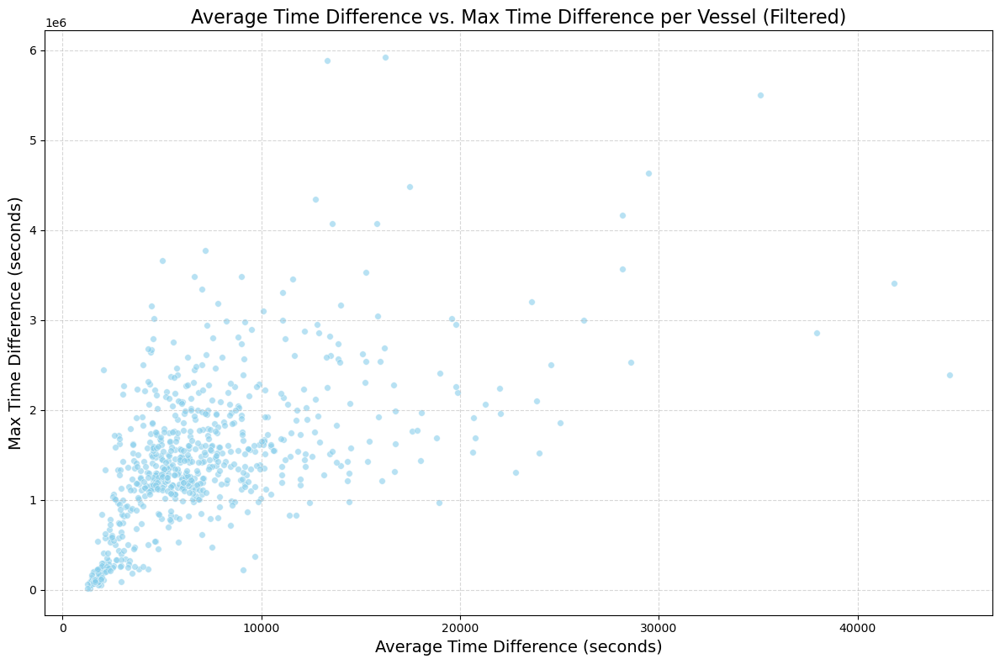

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------------
# 1. Load and Clean the Data
# -------------------------------

# Load the dataset
ais_train = pd.read_csv(
    '/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_train.csv',
    delimiter='|'
)

# Clean column names by stripping leading/trailing spaces
ais_train.columns = ais_train.columns.str.strip()

# Optional: Verify column names
# print("Column Names:", ais_train.columns.tolist())

# Optional: Check for missing values in 'vesselId' and 'time'
# print("Missing 'vesselId':", ais_train['vesselId'].isnull().sum())
# print("Missing 'time':", ais_train['time'].isnull().sum())

# -------------------------------
# 2. Calculate Time Differences and Metrics
# -------------------------------

# Convert 'time' to datetime, coercing errors to NaT
ais_train['time'] = pd.to_datetime(ais_train['time'], errors='coerce')

# Drop rows with invalid 'time' entries
ais_train = ais_train.dropna(subset=['time'])

# Sort by 'vesselId' and 'time' to ensure chronological order within each vessel
ais_train = ais_train.sort_values(['vesselId', 'time'])

# Calculate time differences in seconds
ais_train['time_diff'] = ais_train.groupby('vesselId')['time'].diff().dt.total_seconds()

# Calculate average time difference per vessel
avg_diff = ais_train.groupby('vesselId')['time_diff'].mean()

# Calculate maximum time difference per vessel
max_diff = ais_train.groupby('vesselId')['time_diff'].max()

# -------------------------------
# 3. Identify and Remove Outlier Vessels
# -------------------------------

# Define the threshold for average time difference (150,000 seconds)
threshold = 150000  # seconds

# Identify vessels exceeding the threshold
outlier_vessels = avg_diff[avg_diff > threshold].index.tolist()
num_outliers = len(outlier_vessels)

print(f"Number of vessels with average time difference > {threshold} seconds: {num_outliers}")

# Optional: List the outlier vessel IDs
# print("Outlier Vessel IDs:", outlier_vessels)

# Remove outlier vessels from avg_diff and max_diff
filtered_avg_diff = avg_diff[avg_diff <= threshold]
filtered_max_diff = max_diff[avg_diff <= threshold]

# -------------------------------
# 4. Prepare Data for Plotting
# -------------------------------

# Combine the filtered metrics into a single DataFrame
metrics_df = pd.DataFrame({
    'Average_Time_Diff': filtered_avg_diff,
    'Max_Time_Diff': filtered_max_diff
})

# Drop any remaining vessels with NaN values (e.g., vessels with only one timestamp)
metrics_df = metrics_df.dropna()

# Optional: Reset index to have 'vesselId' as a column
metrics_df.reset_index(inplace=True)

# -------------------------------
# 5. Create the Updated Scatter Plot
# -------------------------------

plt.figure(figsize=(12, 8))
plt.scatter(
    metrics_df['Average_Time_Diff'],
    metrics_df['Max_Time_Diff'],
    alpha=0.6,
    s=30,
    c='skyblue',
    edgecolors='w',
    linewidth=0.5
)

# Adding titles and labels
plt.title('Average Time Difference vs. Max Time Difference per Vessel (Filtered)', fontsize=16)
plt.xlabel('Average Time Difference (seconds)', fontsize=14)
plt.ylabel('Max Time Difference (seconds)', fontsize=14)

# Optional: Add grid for better readability
plt.grid(True, linestyle='--', alpha=0.5)

# Optional: Annotate points with vessel IDs (may be cluttered with 688 vessels)
# To reduce clutter, annotate only a subset, e.g., every 50th vessel
# for idx, row in metrics_df.iterrows():
#     if idx % 50 == 0:
#         plt.text(row['Average_Time_Diff'], row['Max_Time_Diff'], row['vesselId'], fontsize=8)

plt.tight_layout()
plt.show()


                   vesselId  Average_Time_Diff  Max_Time_Diff  \
0  61e9f38eb937134a3c4bfd8b       24556.316708      2499832.0   
1  61e9f38eb937134a3c4bfd8d        1839.290253       142508.0   
2  61e9f38eb937134a3c4bfd8f       14509.088060      1572826.0   
3  61e9f38eb937134a3c4bfd91       12951.150602      1640641.0   
4  61e9f390b937134a3c4bfd93        7786.810563      1746974.0   

   Average_Delta_Longitude  Max_Delta_Longitude  Average_Delta_Latitude  \
0                 1.394906            228.58321                0.631517   
1                 0.052562              5.90122                0.043109   
2                 0.872600            264.94262                0.360451   
3                 0.509469            244.45332                0.389685   
4                 0.298490             47.85339                0.252911   

   Max_Delta_Latitude  
0            69.69977  
1             8.97138  
2            35.42813  
3            54.96456  
4            61.20958  


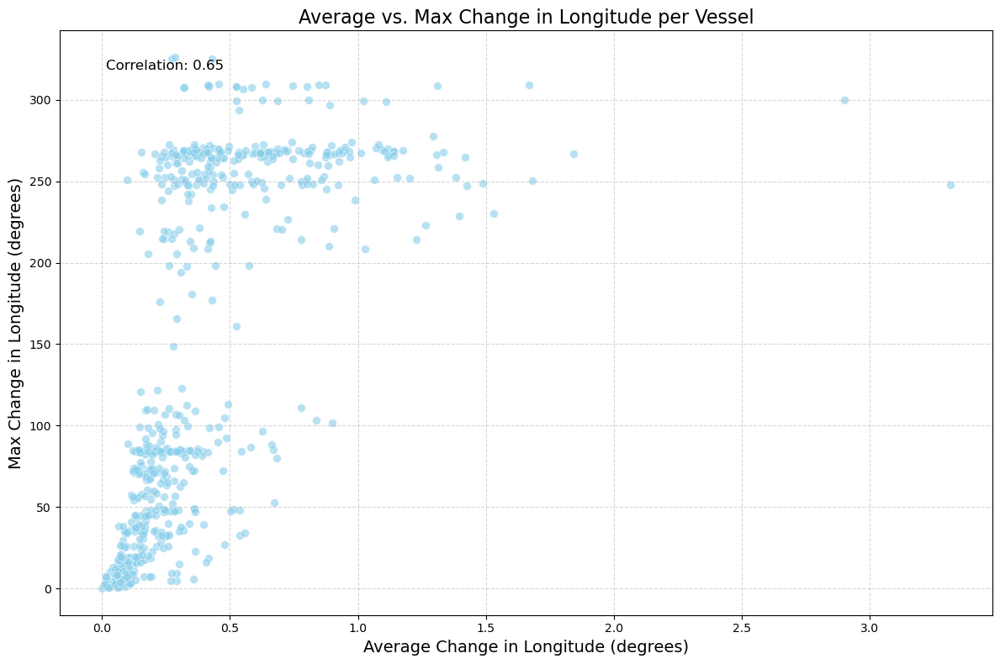

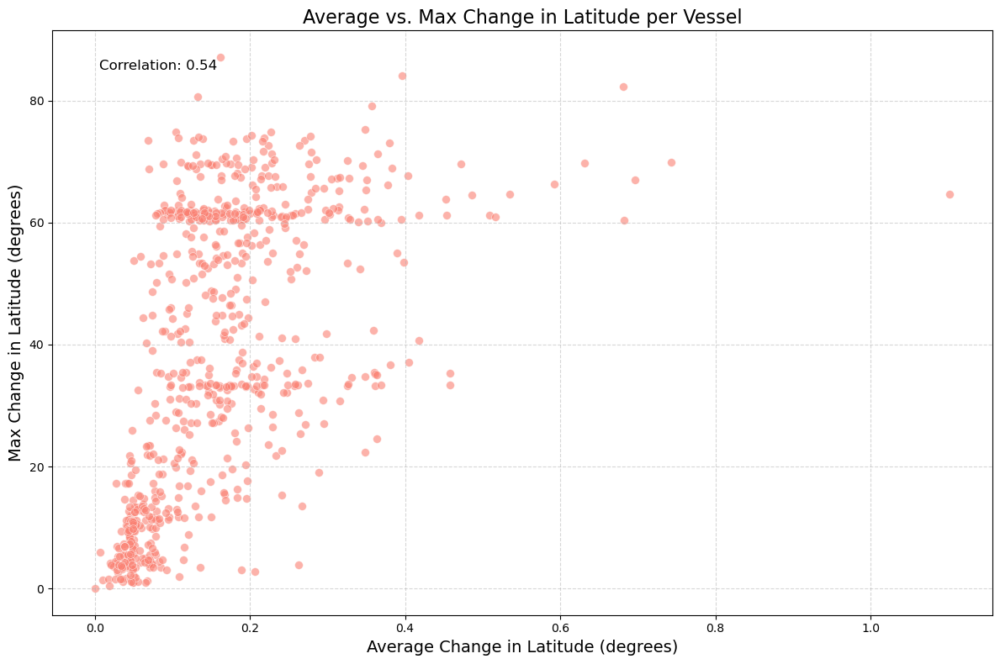

In [ ]:
# Calculate changes in longitude and latitude
ais_train['delta_longitude'] = ais_train.groupby('vesselId')['longitude_vessel'].diff().abs()
ais_train['delta_latitude'] = ais_train.groupby('vesselId')['latitude_vessel'].diff().abs()

# Calculate average and maximum changes in longitude
avg_delta_longitude = ais_train.groupby('vesselId')['delta_longitude'].mean()
max_delta_longitude = ais_train.groupby('vesselId')['delta_longitude'].max()

# Calculate average and maximum changes in latitude
avg_delta_latitude = ais_train.groupby('vesselId')['delta_latitude'].mean()
max_delta_latitude = ais_train.groupby('vesselId')['delta_latitude'].max()

# Combine the metrics into a single DataFrame
metrics_df = pd.DataFrame({
    'Average_Time_Diff': filtered_avg_diff,
    'Max_Time_Diff': filtered_max_diff,
    'Average_Delta_Longitude': avg_delta_longitude[avg_delta_longitude.index.isin(filtered_avg_diff.index)],
    'Max_Delta_Longitude': max_delta_longitude[max_delta_longitude.index.isin(filtered_avg_diff.index)],
    'Average_Delta_Latitude': avg_delta_latitude[avg_delta_latitude.index.isin(filtered_avg_diff.index)],
    'Max_Delta_Latitude': max_delta_latitude[max_delta_latitude.index.isin(filtered_avg_diff.index)]
})

# Drop any remaining vessels with NaN values (e.g., vessels with only one timestamp)
metrics_df = metrics_df.dropna()

# Reset index to have 'vesselId' as a column
metrics_df.reset_index(inplace=True)

# Verify the final DataFrame
print(metrics_df.head())


# Function to plot Average vs Max Changes
def plot_avg_vs_max(sorted_df, x_col, y_col, title, xlabel, ylabel, color):
    plt.figure(figsize=(12, 8))
    plt.scatter(
        sorted_df[x_col],
        sorted_df[y_col],
        alpha=0.6,
        s=50,
        c=color,
        edgecolors='w',
        linewidth=0.5
    )
    
    # Adding titles and labels
    plt.title(title, fontsize=16)
    plt.xlabel(xlabel, fontsize=14)
    plt.ylabel(ylabel, fontsize=14)
    
    # Optional: Add grid for better readability
    plt.grid(True, linestyle='--', alpha=0.5)
    
    # Optional: Calculate and display correlation
    correlation = sorted_df[x_col].corr(sorted_df[y_col])
    plt.text(0.05, 0.95, f'Correlation: {correlation:.2f}', transform=plt.gca().transAxes,
             fontsize=12, verticalalignment='top')
    
    plt.tight_layout()
    plt.show()

# Plotting Average vs Max Change in Longitude
plot_avg_vs_max(
    sorted_df=metrics_df,
    x_col='Average_Delta_Longitude',
    y_col='Max_Delta_Longitude',
    title='Average vs. Max Change in Longitude per Vessel',
    xlabel='Average Change in Longitude (degrees)',
    ylabel='Max Change in Longitude (degrees)',
    color='skyblue'
)

# Plotting Average vs Max Change in Latitude
plot_avg_vs_max(
    sorted_df=metrics_df,
    x_col='Average_Delta_Latitude',
    y_col='Max_Delta_Latitude',
    title='Average vs. Max Change in Latitude per Vessel',
    xlabel='Average Change in Latitude (degrees)',
    ylabel='Max Change in Latitude (degrees)',
    color='salmon'
)



Number of vessels with average time difference > 150000 seconds: 1
                   vesselId  Average_Time_Diff  Max_Time_Diff  \
0  61e9f38eb937134a3c4bfd8b       24556.316708      2499832.0   
1  61e9f38eb937134a3c4bfd8d        1839.290253       142508.0   
2  61e9f38eb937134a3c4bfd8f       14509.088060      1572826.0   
3  61e9f38eb937134a3c4bfd91       12951.150602      1640641.0   
4  61e9f390b937134a3c4bfd93        7786.810563      1746974.0   

   Average_Haversine_Distance  Max_Haversine_Distance  
0               147694.191381            1.283613e+07  
1                 7011.311694            1.051554e+06  
2                79206.568484            8.207689e+06  
3                62608.663046            1.077456e+07  
4                44718.814857            7.124479e+06  


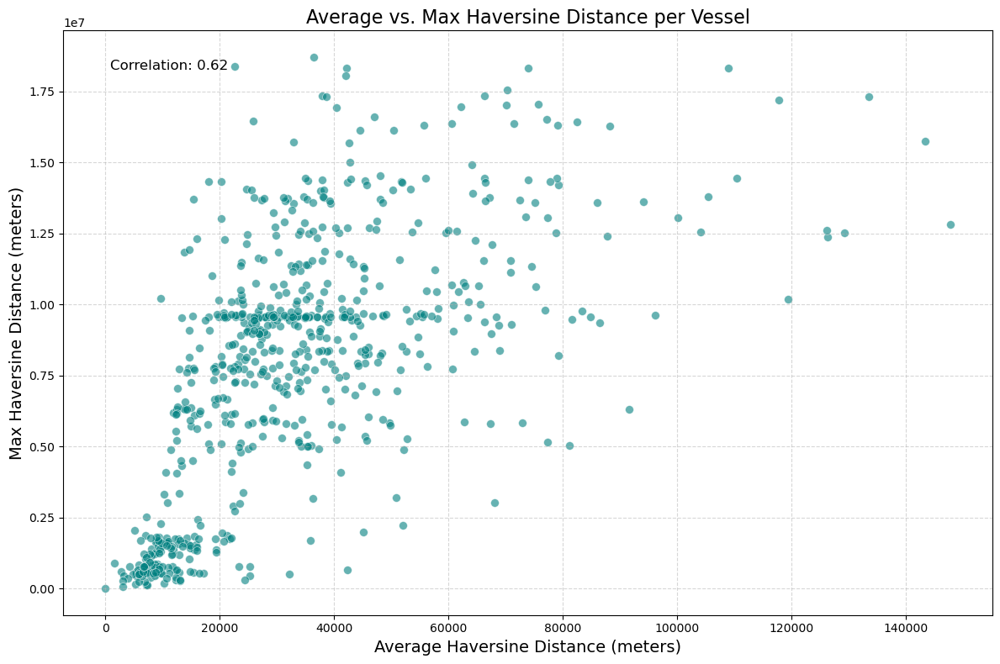

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------
# 1. Define the Haversine Function
# -------------------------------

def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the Haversine distance between two points on the Earth.
    
    Parameters:
    - lat1, lon1: Latitude and Longitude of point 1 in decimal degrees.
    - lat2, lon2: Latitude and Longitude of point 2 in decimal degrees.
    
    Returns:
    - Distance in meters between point 1 and point 2.
    """
    # Earth radius in meters
    R = 6371000  

    # Convert decimal degrees to radians
    phi1 = np.radians(lat1)
    phi2 = np.radians(lat2)
    delta_phi = np.radians(lat2 - lat1)
    delta_lambda = np.radians(lon2 - lon1)

    # Haversine formula
    a = np.sin(delta_phi / 2.0)**2 + \
        np.cos(phi1) * np.cos(phi2) * np.sin(delta_lambda / 2.0)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    distance = R * c  # Output distance in meters
    return distance

# -------------------------------
# 2. Load and Clean the Data
# -------------------------------

# Load the dataset
ais_train = pd.read_csv(
    '/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_train.csv',
    delimiter='|'
)

# Clean column names by stripping leading/trailing spaces
ais_train.columns = ais_train.columns.str.strip()

# Verify column names (optional)
# print("Column Names:", ais_train.columns.tolist())

# Check for missing values in 'vesselId' and 'time' (optional)
# print("Missing 'vesselId':", ais_train['vesselId'].isnull().sum())
# print("Missing 'time':", ais_train['time'].isnull().sum())

# -------------------------------
# 3. Calculate Time Differences and Filter Vessels
# -------------------------------

# Convert 'time' to datetime, coercing errors to NaT
ais_train['time'] = pd.to_datetime(ais_train['time'], errors='coerce')

# Drop rows with invalid 'time' entries
ais_train = ais_train.dropna(subset=['time'])

# Sort by 'vesselId' and 'time' to ensure chronological order within each vessel
ais_train = ais_train.sort_values(['vesselId', 'time'])

# Calculate time differences in seconds
ais_train['time_diff'] = ais_train.groupby('vesselId')['time'].diff().dt.total_seconds()

# Calculate average time difference per vessel
avg_diff = ais_train.groupby('vesselId')['time_diff'].mean()

# Calculate maximum time difference per vessel
max_diff = ais_train.groupby('vesselId')['time_diff'].max()

# Define the threshold for average time difference (150,000 seconds)
threshold = 150000  # seconds

# Identify vessels exceeding the threshold
outlier_vessels = avg_diff[avg_diff > threshold].index.tolist()
num_outliers = len(outlier_vessels)

print(f"Number of vessels with average time difference > {threshold} seconds: {num_outliers}")

# Remove outlier vessels from avg_diff and max_diff
filtered_avg_diff = avg_diff[avg_diff <= threshold]
filtered_max_diff = max_diff[avg_diff <= threshold]

# -------------------------------
# 4. Calculate Haversine Distance Between Consecutive Points
# -------------------------------

# Shift latitude and longitude to get previous point's coordinates
ais_train['prev_latitude'] = ais_train.groupby('vesselId')['latitude_vessel'].shift()
ais_train['prev_longitude'] = ais_train.groupby('vesselId')['longitude_vessel'].shift()

# Calculate Haversine distance
ais_train['haversine_distance'] = haversine_distance(
    ais_train['prev_latitude'],
    ais_train['prev_longitude'],
    ais_train['latitude_vessel'],
    ais_train['longitude_vessel']
)

# -------------------------------
# 5. Calculate Average and Maximum Haversine Distances per Vessel
# -------------------------------

# Calculate average and maximum Haversine distance per vessel
avg_haversine = ais_train.groupby('vesselId')['haversine_distance'].mean()
max_haversine = ais_train.groupby('vesselId')['haversine_distance'].max()

# -------------------------------
# 6. Prepare Data for Plotting
# -------------------------------

# Combine the metrics into a single DataFrame
metrics_df = pd.DataFrame({
    'Average_Time_Diff': filtered_avg_diff,
    'Max_Time_Diff': filtered_max_diff,
    'Average_Haversine_Distance': avg_haversine[avg_haversine.index.isin(filtered_avg_diff.index)],
    'Max_Haversine_Distance': max_haversine[max_haversine.index.isin(filtered_avg_diff.index)]
})

# Drop any remaining vessels with NaN values (e.g., vessels with only one timestamp)
metrics_df = metrics_df.dropna()

# Reset index to have 'vesselId' as a column
metrics_df.reset_index(inplace=True)

# Verify the final DataFrame (optional)
print(metrics_df.head())
#remove the one vessel with highest average haversine distance before plotting
metrics_df = metrics_df[metrics_df['Average_Haversine_Distance'] < 250000]


# -------------------------------
# 7. Create Scatter Plot for Haversine Distances
# -------------------------------

# Function to plot Average vs Max Haversine Distance
def plot_avg_vs_max_haversine(df, avg_col, max_col, title, xlabel, ylabel, color):
    """
    Plots a scatter plot of average vs. max Haversine distances.
    
    Parameters:
    - df: pandas DataFrame containing the data.
    - avg_col: Column name for average Haversine distance.
    - max_col: Column name for max Haversine distance.
    - title: Title of the plot.
    - xlabel: Label for the x-axis.
    - ylabel: Label for the y-axis.
    - color: Color of the scatter points.
    """
    plt.figure(figsize=(12, 8))
    plt.scatter(
        df[avg_col],
        df[max_col],
        alpha=0.6,
        s=50,
        c=color,
        edgecolors='w',
        linewidth=0.5
    )
    
    # Adding titles and labels
    plt.title(title, fontsize=16)
    plt.xlabel(xlabel, fontsize=14)
    plt.ylabel(ylabel, fontsize=14)
    
    # Optional: Add grid for better readability
    plt.grid(True, linestyle='--', alpha=0.5)
    
    # Optional: Calculate and display correlation
    correlation = df[avg_col].corr(df[max_col])
    plt.text(0.05, 0.95, f'Correlation: {correlation:.2f}', transform=plt.gca().transAxes,
             fontsize=12, verticalalignment='top')
    
    plt.tight_layout()
    plt.show()

# Plotting Average vs Max Haversine Distance
plot_avg_vs_max_haversine(
    df=metrics_df,
    avg_col='Average_Haversine_Distance',
    max_col='Max_Haversine_Distance',
    title='Average vs. Max Haversine Distance per Vessel',
    xlabel='Average Haversine Distance (meters)',
    ylabel='Max Haversine Distance (meters)',
    color='teal'
)


Column Names: ['time', 'cog', 'sog', 'rot', 'heading', 'navstat', 'etaRaw', 'latitude_vessel', 'longitude_vessel', 'vesselId', 'portId']
Missing 'vesselId': 0
Missing 'time': 0
Number of vessels with average time difference > 150000 seconds: 1
                   vesselId  Average_Time_Diff  Max_Time_Diff  \
0  61e9f38eb937134a3c4bfd8b       24556.316708      2499832.0   
1  61e9f38eb937134a3c4bfd8d        1839.290253       142508.0   
2  61e9f38eb937134a3c4bfd8f       14509.088060      1572826.0   
3  61e9f38eb937134a3c4bfd91       12951.150602      1640641.0   
4  61e9f390b937134a3c4bfd93        7786.810563      1746974.0   

   Average_Haversine_Distance  Max_Haversine_Distance  \
0               147694.191381            1.283613e+07   
1                 7011.311694            1.051554e+06   
2                79206.568484            8.207689e+06   
3                62608.663046            1.077456e+07   
4                44718.814857            7.124479e+06   

   Variance_Haversine_

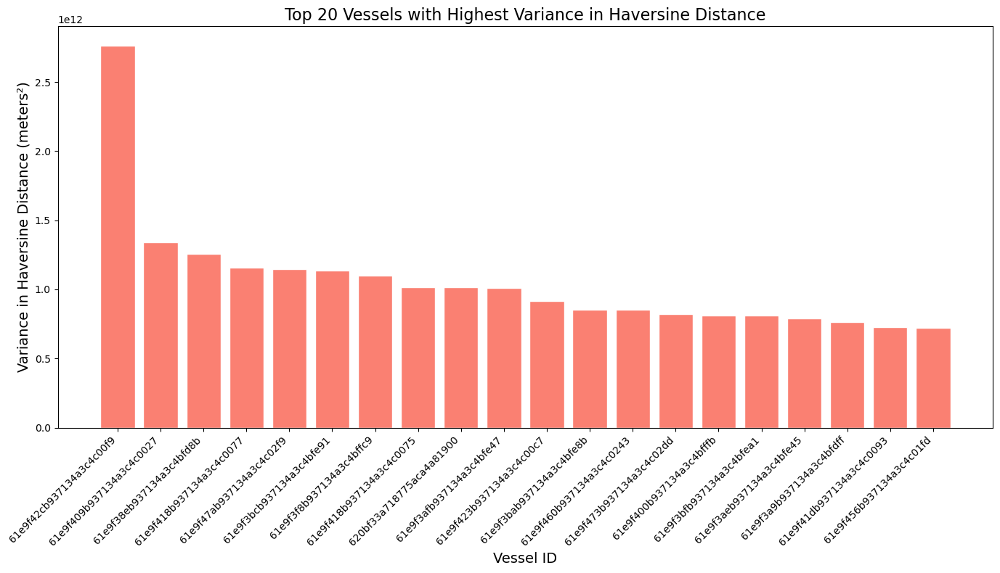

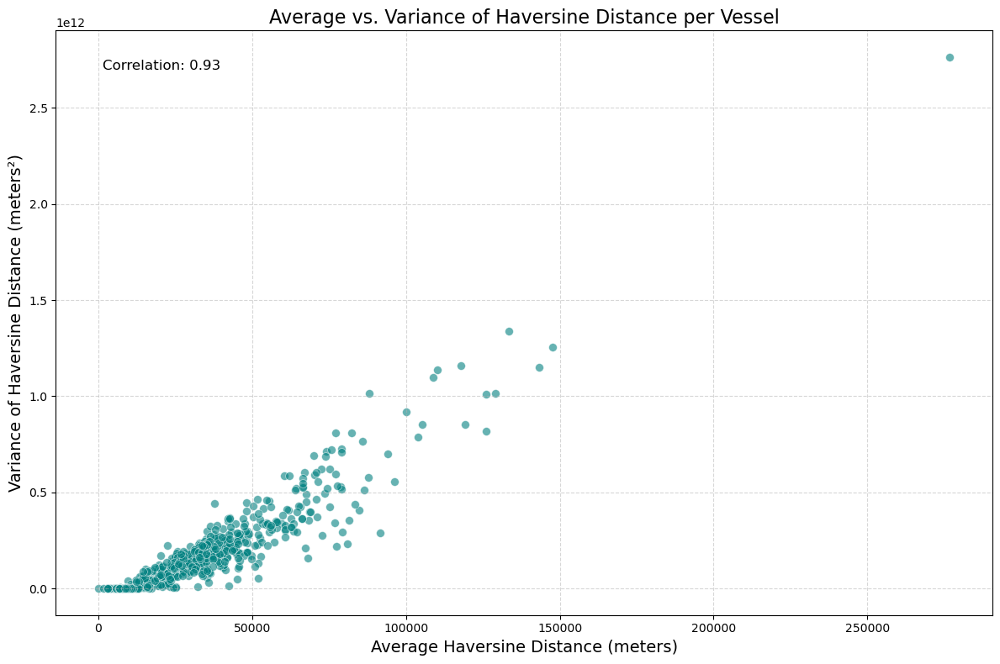

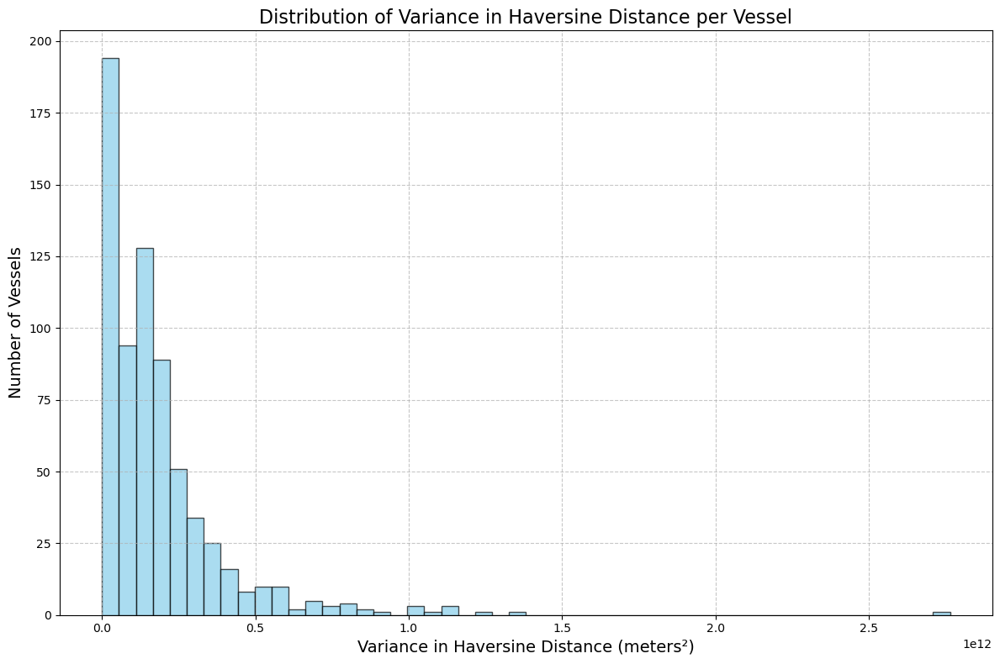

count       686.000000
mean      33826.852228
std       24409.095733
min           5.387341
25%       16761.466152
50%       29386.655031
75%       42667.938094
max      276823.891045
Name: Average_Haversine_Distance, dtype: float64


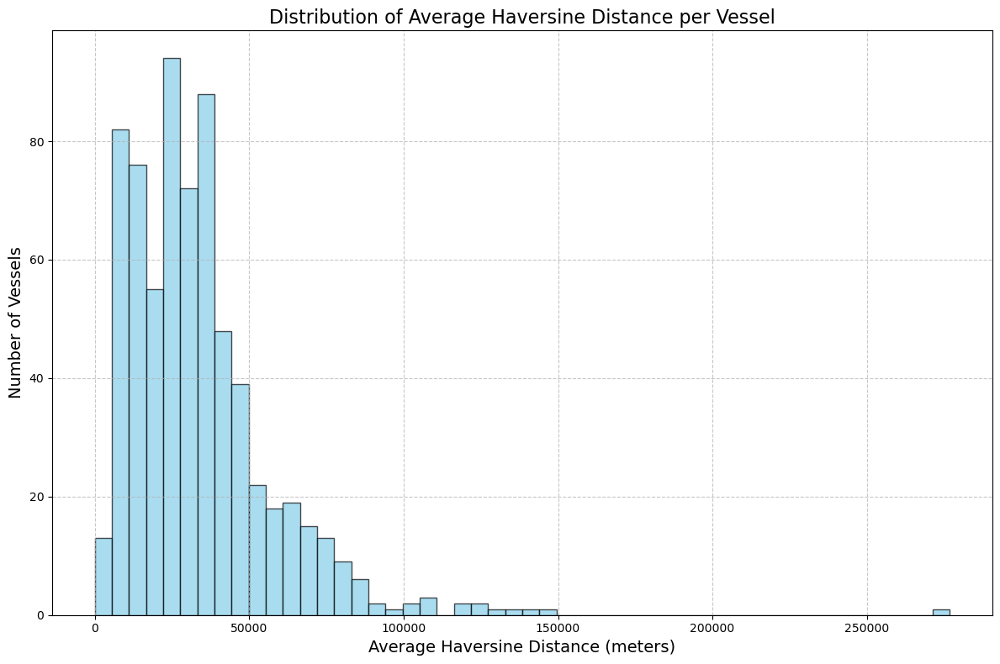

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------
# 1. Define the Haversine Function
# -------------------------------

def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the Haversine distance between two points on the Earth.

    Parameters:
    - lat1, lon1: Latitude and Longitude of point 1 in decimal degrees.
    - lat2, lon2: Latitude and Longitude of point 2 in decimal degrees.

    Returns:
    - Distance in meters between point 1 and point 2.
    """
    # Earth radius in meters
    R = 6371000  

    # Convert decimal degrees to radians
    phi1 = np.radians(lat1)
    phi2 = np.radians(lat2)
    delta_phi = np.radians(lat2 - lat1)
    delta_lambda = np.radians(lon2 - lon1)

    # Haversine formula
    a = np.sin(delta_phi / 2.0)**2 + \
        np.cos(phi1) * np.cos(phi2) * np.sin(delta_lambda / 2.0)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    distance = R * c  # Output distance in meters
    return distance

# -------------------------------
# 2. Load and Clean the Data
# -------------------------------

# Load the dataset
ais_train = pd.read_csv(
    '/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_train.csv',
    delimiter='|'
)

# Clean column names by stripping leading/trailing spaces
ais_train.columns = ais_train.columns.str.strip()

# Verify column names (optional)
print("Column Names:", ais_train.columns.tolist())

# Check for missing values in 'vesselId' and 'time' (optional)
print("Missing 'vesselId':", ais_train['vesselId'].isnull().sum())
print("Missing 'time':", ais_train['time'].isnull().sum())

# -------------------------------
# 3. Calculate Time Differences and Filter Vessels
# -------------------------------

# Convert 'time' to datetime, coercing errors to NaT
ais_train['time'] = pd.to_datetime(ais_train['time'], errors='coerce')

# Drop rows with invalid 'time' entries
ais_train = ais_train.dropna(subset=['time'])

# Sort by 'vesselId' and 'time' to ensure chronological order within each vessel
ais_train = ais_train.sort_values(['vesselId', 'time'])

# Calculate time differences in seconds
ais_train['time_diff'] = ais_train.groupby('vesselId')['time'].diff().dt.total_seconds()

# Calculate average time difference per vessel
avg_diff = ais_train.groupby('vesselId')['time_diff'].mean()

# Calculate maximum time difference per vessel
max_diff = ais_train.groupby('vesselId')['time_diff'].max()

# Define the threshold for average time difference (150,000 seconds)
threshold = 150000  # seconds

# Identify vessels exceeding the threshold
outlier_vessels = avg_diff[avg_diff > threshold].index.tolist()
num_outliers = len(outlier_vessels)

print(f"Number of vessels with average time difference > {threshold} seconds: {num_outliers}")

# Remove outlier vessels from avg_diff and max_diff
filtered_avg_diff = avg_diff[avg_diff <= threshold]
filtered_max_diff = max_diff[avg_diff <= threshold]

# -------------------------------
# 4. Calculate Haversine Distance Between Consecutive Points
# -------------------------------

# Shift latitude and longitude to get previous point's coordinates
ais_train['prev_latitude'] = ais_train.groupby('vesselId')['latitude_vessel'].shift()
ais_train['prev_longitude'] = ais_train.groupby('vesselId')['longitude_vessel'].shift()

# Calculate Haversine distance
ais_train['haversine_distance'] = haversine_distance(
    ais_train['prev_latitude'],
    ais_train['prev_longitude'],
    ais_train['latitude_vessel'],
    ais_train['longitude_vessel']
)

# Note: The first entry for each vessel will have NaN for 'haversine_distance'

# -------------------------------
# 5. Calculate Variance of Haversine Distance per Vessel
# -------------------------------

# Calculate variance of Haversine distance per vessel
variance_haversine = ais_train.groupby('vesselId')['haversine_distance'].var()

# Calculate average and maximum Haversine distance per vessel
avg_haversine = ais_train.groupby('vesselId')['haversine_distance'].mean()
max_haversine = ais_train.groupby('vesselId')['haversine_distance'].max()

# -------------------------------
# 6. Combine Metrics into a Single DataFrame
# -------------------------------

# Ensure that all grouped metrics are aligned by 'vesselId'
# Since 'filtered_avg_diff' contains the vessels we're interested in, we'll use its index
# to filter the other metrics

metrics_df = pd.DataFrame({
    'Average_Time_Diff': filtered_avg_diff,
    'Max_Time_Diff': filtered_max_diff,
    'Average_Haversine_Distance': avg_haversine.loc[filtered_avg_diff.index],
    'Max_Haversine_Distance': max_haversine.loc[filtered_avg_diff.index],
    'Variance_Haversine_Distance': variance_haversine.loc[filtered_avg_diff.index]
})

# Drop any remaining vessels with NaN values (e.g., vessels with only one timestamp)
metrics_df = metrics_df.dropna()

# Reset index to have 'vesselId' as a column
metrics_df.reset_index(inplace=True)

# Verify the final DataFrame
print(metrics_df.head())

# -------------------------------
# 7. Visualize the Variance
# -------------------------------

# a. Bar Plot of Top N Vessels with Highest Variance
# Sort the DataFrame by variance in descending order
metrics_df_sorted_variance = metrics_df.sort_values(by='Variance_Haversine_Distance', ascending=False)

# Select top N vessels with highest variance
top_n = 20  # Adjust as needed
top_variance_df = metrics_df_sorted_variance.head(top_n)

# Plotting the top N vessels with highest variance
plt.figure(figsize=(14, 8))
plt.bar(
    top_variance_df['vesselId'],
    top_variance_df['Variance_Haversine_Distance'],
    color='salmon',
    edgecolor='w'
)
plt.title(f'Top {top_n} Vessels with Highest Variance in Haversine Distance', fontsize=16)
plt.xlabel('Vessel ID', fontsize=14)
plt.ylabel('Variance in Haversine Distance (meters²)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# b. Scatter Plot of Average vs. Variance of Haversine Distances
plt.figure(figsize=(12, 8))
plt.scatter(
    metrics_df['Average_Haversine_Distance'],
    metrics_df['Variance_Haversine_Distance'],
    alpha=0.6,
    s=50,
    c='teal',
    edgecolors='w',
    linewidth=0.5
)

# Adding titles and labels
plt.title('Average vs. Variance of Haversine Distance per Vessel', fontsize=16)
plt.xlabel('Average Haversine Distance (meters)', fontsize=14)
plt.ylabel('Variance of Haversine Distance (meters²)', fontsize=14)

# Optional: Add grid for better readability
plt.grid(True, linestyle='--', alpha=0.5)

# Calculate and display correlation
correlation = metrics_df['Average_Haversine_Distance'].corr(metrics_df['Variance_Haversine_Distance'])
plt.text(0.05, 0.95, f'Correlation: {correlation:.2f}', transform=plt.gca().transAxes,
         fontsize=12, verticalalignment='top')

plt.tight_layout()
plt.show()

# c. Histogram of Variance of Haversine Distances
plt.figure(figsize=(12, 8))
plt.hist(
    metrics_df['Variance_Haversine_Distance'],
    bins=50,
    color='skyblue',
    edgecolor='k',
    alpha=0.7
)
plt.title('Distribution of Variance in Haversine Distance per Vessel', fontsize=16)
plt.xlabel('Variance in Haversine Distance (meters²)', fontsize=14)
plt.ylabel('Number of Vessels', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
#log
plt.tight_layout()
plt.show()

#describe average haversine distance
print(metrics_df['Average_Haversine_Distance'].describe())

# Plot distribution of avg_haversine
plt.figure(figsize=(12, 8))
plt.hist(
    metrics_df['Average_Haversine_Distance'],
    bins=50,
    color='skyblue',
    edgecolor='k',
    alpha=0.7
)
plt.title('Distribution of Average Haversine Distance per Vessel', fontsize=16)
plt.xlabel('Average Haversine Distance (meters)', fontsize=14)
plt.ylabel('Number of Vessels', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()


# Feature engeneering and different models 

Here follows different approaches to the vessel trajectory prediction. Notice that I have tried several different feature engeenering strategies, variables and parameters. See also the model interpretation results after training for most of the models used to tune which features to include and exclude.

# Baseline model


In [ ]:
import pandas as pd
import warnings
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from geopy.distance import geodesic

warnings.filterwarnings("ignore")

# Load datasets
ais_train = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_train.csv', sep='|')
ais_test = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_test.csv')
ports = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ports.csv', sep='|')
schedules = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/schedules_to_may_2024.csv', sep='|')
vessels = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/vessels.csv', sep='|')

# Convert timestamp to datetime
ais_train['time'] = pd.to_datetime(ais_train['time'])
ais_test['time'] = pd.to_datetime(ais_test['time'])


# Feature Engeneering


In [ ]:
# Sort data by ID and timestamp
ais_train.sort_values(by=['vesselId', 'time'], inplace=True)

# Create lag features for longitude and latitude
ais_train['prev_longitude'] = ais_train.groupby('vesselId')['longitude'].shift(1)
ais_train['prev_latitude'] = ais_train.groupby('vesselId')['latitude'].shift(1)

# Calculate time difference in seconds
ais_train['time_diff'] = ais_train.groupby('vesselId')['time'].diff().dt.total_seconds()

# Drop rows with NaN values created by lagging
ais_train.dropna(inplace=True)

ais_train.head()


,time,cog,sog,rot,heading,navstat,etaRaw,latitude,longitude,vesselId,portId,prev_longitude,prev_latitude,time_diff
131279,2024-01-12 14:31:00,307.6,17.3,5,313,0,01-14 23:30,7.57302,77.49505,61e9f38eb937134a3c4bfd8b,61d376d893c6feb83e5eb546,77.58340,7.50361,1393.0
131514,2024-01-12 14:57:23,306.8,16.9,5,312,0,01-14 23:30,7.65043,77.39404,61e9f38eb937134a3c4bfd8b,61d376d893c6feb83e5eb546,77.49505,7.57302,1583.0
131696,2024-01-12 15:18:48,307.9,16.9,6,313,0,01-14 23:30,7.71275,77.31394,61e9f38eb937134a3c4bfd8b,61d376d893c6feb83e5eb546,77.39404,7.65043,1285.0
131885,2024-01-12 15:39:47,307.0,16.3,7,313,0,01-14 23:30,7.77191,77.23585,61e9f38eb937134a3c4bfd8b,61d376d893c6feb83e5eb546,77.31394,7.71275,1259.0
132038,2024-01-12 15:54:48,307.6,16.1,5,313,0,01-14 23:30,7.81285,77.18147,61e9f38eb937134a3c4bfd8b,61d376d893c6feb83e5eb546,77.23585,7.77191,901.0


# Choose training features and targets

In [ ]:
# Define features and target
X = ais_train[['cog', 'sog', 'prev_longitude', 'prev_latitude', 'time_diff']]
y_longitude = ais_train['longitude']
y_latitude = ais_train['latitude']


# Train model

In [ ]:

# Sequentially split the data into training and validation sets
split_index = int(len(X) * 0.8)  # Using 80% for training

# Create training and validation sets
X_train = X[:split_index]
y_train_long = y_longitude[:split_index]
y_train_lat = y_latitude[:split_index]

X_val = X[split_index:]
y_val_long = y_longitude[split_index:]
y_val_lat = y_latitude[split_index:]

# Train model for longitude
model_long = RandomForestRegressor(n_estimators=100, max_depth=20, n_jobs=-1, random_state=42, verbose=0)
model_long.fit(X_train, y_train_long)

# Train model for latitude
model_lat = RandomForestRegressor(n_estimators=100, max_depth=20, n_jobs=-1, random_state=42, verbose=0)
model_lat.fit(X_train, y_train_lat)

# Validate model
predictions_long = model_long.predict(X_val)
predictions_lat = model_lat.predict(X_val)

def calculate_geodetic_distance(lat1, lon1, lat2, lon2):
    return geodesic((lat1, lon1), (lat2, lon2)).km

# Calculate geodetic distances between the actual and predicted coordinates
distances = [
    calculate_geodetic_distance(y_val_lat.iloc[i], y_val_long.iloc[i], predictions_lat[i], predictions_long[i]) 
    for i in range(len(predictions_lat))
]

mean_distance = np.mean(distances)
print(f"Mean Geodetic Distance on Validation Set: {mean_distance:.2f} km")


Mean Geodetic Distance on Validation Set: 10.24 km


# Prepare predictions


In [ ]:
ais_predict = ais_test.copy()
ais_predict['latitude_predicted'] = -123
ais_predict['longitude_predicted'] = -123
ais_predict['cog'] = -123
ais_predict['sog'] = -123
ais_predict['prev_longitude'] = -123
ais_predict['prev_latitude'] = -123
ais_predict['time_diff'] = -123

# Sort ais_predict by vesselId and time
ais_predict.sort_values(by=['vesselId', 'time'], inplace=True)

# Precompute ais_train by vesselId for faster lookups
ais_train_sorted = ais_train.sort_values(by=['vesselId', 'time'])

ais_train_groups = ais_train_sorted.groupby('vesselId')

# Convert times to numeric timestamps for faster computation of time differences
ais_predict['time'] = pd.to_datetime(ais_predict['time'])
ais_train_sorted['time'] = pd.to_datetime(ais_train_sorted['time'])

ais_predict['timestamp'] = ais_predict['time'].astype(np.int64) // 10**9  # Convert to seconds
ais_train_sorted['timestamp'] = ais_train_sorted['time'].astype(np.int64) // 10**9

total_rows = len(ais_predict)
progress_interval = total_rows // 100  # Calculate for 1% intervals
processed_rows = 0  # Initialize counter for processed rows


# Do prediction


In [ ]:
# Loop through each vesselId to perform bulk processing
for vessel_id, group in ais_predict.groupby('vesselId'):
    
    # Get past data for this vessel
    past_data = ais_train_groups.get_group(vessel_id)
        
    # Track last known position within each vessel group
    last_known_data = past_data[['cog', 'sog', 'longitude', 'latitude', 'timestamp']].iloc[-1]
        
    for idx, (index, row) in enumerate(group.iterrows()):
        # Calculate time_diff
        time_diff = row['timestamp'] - last_known_data['timestamp']
        
        # Safely retrieve values to avoid KeyErrors
        prev_long = last_known_data.get('longitude', -123)
        prev_lat = last_known_data.get('latitude', -123)
        
        # Update relevant columns with last known values
        ais_predict.at[index, 'cog'] = last_known_data['cog']
        ais_predict.at[index, 'sog'] = last_known_data['sog']
        ais_predict.at[index, 'prev_longitude'] = prev_long
        ais_predict.at[index, 'prev_latitude'] = prev_lat
        ais_predict.at[index, 'time_diff'] = time_diff
        
        # Extract features and predict
        features = np.array([last_known_data['cog'], last_known_data['sog'], prev_long, prev_lat, time_diff]).reshape(1, -1)
        
        # Make predictions
        pred_long = model_long.predict(features)[0]
        pred_lat = model_lat.predict(features)[0]
            
        # Update predictions
        ais_predict.at[index, 'longitude_predicted'] = pred_long
        ais_predict.at[index, 'latitude_predicted'] = pred_lat

        # Update last known data for next iteration with the new predictions
        last_known_data = row[['cog', 'sog', 'timestamp']].copy()
        last_known_data['longitude'] = pred_long
        last_known_data['latitude'] = pred_lat

        # Increment the counter for processed rows
        processed_rows += 1

        # Print progress at each 1% interval
        if processed_rows % progress_interval == 0:
            percent_complete = int((processed_rows / total_rows) * 100)
            print(f"Processing: {percent_complete}% complete.")


print("Processing: 100% complete.")

detailed_predictions = ais_predict[['ID','vesselId', 'time', 'longitude_predicted', 'latitude_predicted']]
detailed_predictions.to_csv('Detailed_Predictions.csv', index=False)
print("Detailed predictions saved to Detailed_Predictions.csv.")

submission_predictions = ais_predict[['ID', 'longitude_predicted', 'latitude_predicted']]
submission_predictions.to_csv('Submission.csv', index=False)
print("Submission predictions saved to Submission.csv.")


Processing: 0% complete.
Processing: 1% complete.
Processing: 2% complete.
Processing: 3% complete.
Processing: 4% complete.
Processing: 5% complete.
Processing: 6% complete.
Processing: 7% complete.
Processing: 8% complete.
Processing: 9% complete.
Processing: 10% complete.
Processing: 11% complete.
Processing: 12% complete.
Processing: 13% complete.
Processing: 14% complete.
Processing: 15% complete.
Processing: 16% complete.
Processing: 17% complete.
Processing: 18% complete.
Processing: 19% complete.
Processing: 20% complete.
Processing: 21% complete.
Processing: 22% complete.
Processing: 23% complete.
Processing: 24% complete.
Processing: 25% complete.
Processing: 26% complete.
Processing: 27% complete.
Processing: 28% complete.
Processing: 29% complete.
Processing: 30% complete.
Processing: 31% complete.
Processing: 32% complete.
Processing: 33% complete.
Processing: 34% complete.
Processing: 35% complete.
Processing: 36% complete.
Processing: 37% complete.
Processing: 38% comple

# Improved Random forest with five days validation

# Load data and import modules

In [ ]:
import pandas as pd
import warnings
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from geopy.distance import geodesic

warnings.filterwarnings("ignore")

# Load datasets
ais_train = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_train.csv', sep='|')
ais_test = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_test.csv')
ports = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ports.csv', sep='|')
schedules = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/schedules_to_may_2024.csv', sep='|')
vessels = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/vessels.csv', sep='|')

# Convert timestamp to datetime
ais_train['time'] = pd.to_datetime(ais_train['time'])
ais_test['time'] = pd.to_datetime(ais_test['time'])


# Feature Engeneering


In [ ]:
import numpy as np
from geopy.distance import geodesic

# Sort data by vesselID and timestamp
ais_train.sort_values(by=['vesselId', 'time'], inplace=True)

# Create lag features for longitude and latitude
ais_train['prev_longitude'] = ais_train.groupby('vesselId')['longitude'].shift(1)
ais_train['prev_latitude'] = ais_train.groupby('vesselId')['latitude'].shift(1)

# Calculate time difference in seconds
ais_train['time_diff'] = ais_train.groupby('vesselId')['time'].diff().dt.total_seconds()

# Drop rows with NaN values due to shift operations to prevent unnecessary calculations
ais_train.dropna(inplace=True)

# Find weekday number
ais_train['weekday'] = ais_train['time'].dt.weekday

# View the processed data
ais_train.head()

,time,cog,sog,rot,heading,navstat,etaRaw,latitude,longitude,vesselId,portId,prev_longitude,prev_latitude,time_diff,weekday
131279,2024-01-12 14:31:00,307.6,17.3,5,313,0,01-14 23:30,7.57302,77.49505,61e9f38eb937134a3c4bfd8b,61d376d893c6feb83e5eb546,77.58340,7.50361,1393.0,4
131514,2024-01-12 14:57:23,306.8,16.9,5,312,0,01-14 23:30,7.65043,77.39404,61e9f38eb937134a3c4bfd8b,61d376d893c6feb83e5eb546,77.49505,7.57302,1583.0,4
131696,2024-01-12 15:18:48,307.9,16.9,6,313,0,01-14 23:30,7.71275,77.31394,61e9f38eb937134a3c4bfd8b,61d376d893c6feb83e5eb546,77.39404,7.65043,1285.0,4
131885,2024-01-12 15:39:47,307.0,16.3,7,313,0,01-14 23:30,7.77191,77.23585,61e9f38eb937134a3c4bfd8b,61d376d893c6feb83e5eb546,77.31394,7.71275,1259.0,4
132038,2024-01-12 15:54:48,307.6,16.1,5,313,0,01-14 23:30,7.81285,77.18147,61e9f38eb937134a3c4bfd8b,61d376d893c6feb83e5eb546,77.23585,7.77191,901.0,4


# Choose training features and targets

In [ ]:
# Split the data into training and validation sets

#x is the percentage for the split (e.g., x = 0.2 for 20%)
x = 0.003

# Create an empty list to hold indices for validation set
val_indices = []

# Iterate over each group by 'vesselId' and select the last x% of each group
min_training_rows = 1  # set a minimum number of rows to keep in training
for vessel_id, group in ais_train.groupby('vesselId'):
    n_val_rows = max(1, int(len(group) * x))
    if len(group) - n_val_rows < min_training_rows:
        n_val_rows = len(group) - min_training_rows
    val_indices.extend(group.index[-n_val_rows:])


# Use these indices to create the validation set
X_val = ais_train.loc[val_indices].reset_index(drop=True)
y_val_long = X_val['longitude']
y_val_lat = X_val['latitude']

# Drop these indices from ais_train to get the training set
X_train = ais_train.drop(val_indices).reset_index(drop=True)
y_train_long = X_train['longitude']
y_train_lat = X_train['latitude']

#Check if every vesselid in the validation set is also in the training set
print(all(vessel_id in X_train['vesselId'].unique() for vessel_id in X_val['vesselId'].unique()))

X_val.head()

True


,time,cog,sog,rot,heading,navstat,etaRaw,latitude,longitude,vesselId,portId,prev_longitude,prev_latitude,time_diff,weekday
0,2024-05-05 13:25:50,40.0,0.0,1,328,1,05-04 22:45,36.84686,5.84638,61e9f38eb937134a3c4bfd8b,61d36ee00a1807568ff9a072,5.84575,36.84628,4333.0,6
1,2024-05-07 18:15:01,243.0,16.5,0,245,0,05-09 04:00,49.45915,-4.41258,61e9f38eb937134a3c4bfd8d,634c4de270937fc01c3a7893,-4.31663,49.49087,924.0,1
2,2024-05-07 18:35:13,236.0,16.9,0,239,0,05-09 04:00,49.41482,-4.53915,61e9f38eb937134a3c4bfd8d,634c4de270937fc01c3a7893,-4.41258,49.45915,1212.0,1
3,2024-05-07 18:55:44,237.0,17.3,0,239,0,05-09 04:00,49.36100,-4.66558,61e9f38eb937134a3c4bfd8d,634c4de270937fc01c3a7893,-4.53915,49.41482,1231.0,1
4,2024-05-07 19:16:13,237.0,17.7,0,239,0,05-09 04:00,49.30610,-4.79475,61e9f38eb937134a3c4bfd8d,634c4de270937fc01c3a787b,-4.66558,49.36100,1229.0,1


In [ ]:
X_predict =X_val[['time', 'vesselId', 'longitude', 'latitude']]

X_predict['weekday'] = X_predict['time'].dt.weekday
X_predict['latitude_predicted'] = -123
X_predict['longitude_predicted'] = -123
X_predict['cog'] = -123
X_predict['sog'] = -123
X_predict['prev_longitude'] = -123
X_predict['prev_latitude'] = -123
X_predict['time_diff'] = -123

# Sort ais_predict by vesselId and time
X_predict.sort_values(by=['vesselId', 'time'], inplace=True)

# Precompute ais_train by vesselId for faster lookups
X_train_sorted = X_train.sort_values(by=['vesselId', 'time'])

X_train_groups = X_train_sorted.groupby('vesselId')

# Convert times to numeric timestamps for faster computation of time differences
X_predict['time'] = pd.to_datetime(X_predict['time'])
X_train_sorted['time'] = pd.to_datetime(X_train_sorted['time'])

X_predict['timestamp'] = X_predict['time'].astype(np.int64) // 10**9  # Convert to seconds
X_train_sorted['timestamp'] = X_train_sorted['time'].astype(np.int64) // 10**9

total_rows = len(X_predict)
progress_interval = total_rows // 100  # Calculate for 1% intervals
processed_rows = 0  # Initialize counter for processed rows

#Define features and target
X_train_train = X_train[['cog','sog','weekday', 'prev_longitude', 'prev_latitude', 'time_diff']]

X_train_train.head()

,cog,sog,weekday,prev_longitude,prev_latitude,time_diff
0,307.6,17.3,4,77.58340,7.50361,1393.0
1,306.8,16.9,4,77.49505,7.57302,1583.0
2,307.9,16.9,4,77.39404,7.65043,1285.0
3,307.0,16.3,4,77.31394,7.71275,1259.0
4,307.6,16.1,4,77.23585,7.77191,901.0


In [ ]:
# Train model for longitude
model_long = RandomForestRegressor(n_estimators=100, max_depth=20, n_jobs=-1, random_state=42, verbose=0)
model_long.fit(X_train_train, y_train_long)

# Train model for latitude
model_lat = RandomForestRegressor(n_estimators=100, max_depth=20, n_jobs=-1, random_state=42, verbose=0)
model_lat.fit(X_train_train, y_train_lat)



RandomForestRegressor(max_depth=20, n_jobs=-1, random_state=42)

In [ ]:
# Loop through each vesselId to perform bulk processing
for vessel_id, group in X_predict.groupby('vesselId'):
    
    # Get past data for this vessel
    past_data = X_train_groups.get_group(vessel_id)
        
    # Track last known position within each vessel group
    last_known_data = past_data[['cog', 'sog', 'longitude', 'latitude', 'timestamp']].iloc[-1]
    
        
    for idx, (index, row) in enumerate(group.iterrows()):
        # Calculate time_diff
        time_diff = row['timestamp'] - last_known_data['timestamp']
        week_day = row['weekday']
        
        # Safely retrieve values to avoid KeyErrors
        prev_long = last_known_data.get('longitude', -123)
        prev_lat = last_known_data.get('latitude', -123)
        
        # Update relevant columns with last known values
        X_predict.at[index, 'cog'] = last_known_data['cog']
        X_predict.at[index, 'sog'] = last_known_data['sog']
        X_predict.at[index, 'prev_longitude'] = prev_long
        X_predict.at[index, 'prev_latitude'] = prev_lat
        X_predict.at[index, 'time_diff'] = time_diff        
        
        # Extract features and predict
        features = np.array([[last_known_data['cog'], last_known_data['sog'], week_day, prev_long, prev_lat, time_diff]])
        
        # Make predictions
        pred_long = model_long.predict(features)[0]
        pred_lat = model_lat.predict(features)[0]
            
        # Update predictions
        X_predict.at[index, 'longitude_predicted'] = pred_long
        X_predict.at[index, 'latitude_predicted'] = pred_lat
        
        #update last known data two steps back
        last_known_data2 = last_known_data.copy()

        # Update last known data for next iteration with the new predictions
        last_known_data = row[['cog', 'sog', 'timestamp']].copy()
        last_known_data['longitude'] = pred_long
        last_known_data['latitude'] = pred_lat
        
        # Increment the counter for processed rows
        processed_rows += 1

        # Print progress at each 1% interval
        if processed_rows % progress_interval == 0:
            percent_complete = int((processed_rows / total_rows) * 100)
            print(f"Processing: {percent_complete}% complete.")


print("Processing: 100% complete.")






Processing: 0% complete.
Processing: 1% complete.
Processing: 2% complete.
Processing: 3% complete.
Processing: 4% complete.
Processing: 5% complete.
Processing: 6% complete.
Processing: 7% complete.
Processing: 8% complete.
Processing: 9% complete.
Processing: 10% complete.
Processing: 11% complete.
Processing: 12% complete.
Processing: 13% complete.
Processing: 14% complete.
Processing: 15% complete.
Processing: 16% complete.
Processing: 17% complete.
Processing: 18% complete.
Processing: 19% complete.
Processing: 20% complete.
Processing: 21% complete.
Processing: 22% complete.
Processing: 23% complete.
Processing: 24% complete.
Processing: 25% complete.
Processing: 26% complete.
Processing: 27% complete.
Processing: 28% complete.
Processing: 29% complete.
Processing: 30% complete.
Processing: 31% complete.
Processing: 32% complete.
Processing: 33% complete.
Processing: 34% complete.
Processing: 35% complete.
Processing: 36% complete.
Processing: 37% complete.
Processing: 38% comple

In [ ]:
X_predict.head()


,time,vesselId,longitude,latitude,weekday,latitude_predicted,longitude_predicted,cog,sog,prev_longitude,prev_latitude,time_diff,timestamp
0,2024-05-05 13:25:50,61e9f38eb937134a3c4bfd8b,5.84638,36.84686,6,36.804398,5.895320,110.0,0.0,5.845750,36.846280,4333,1714915550
1,2024-05-07 18:15:01,61e9f38eb937134a3c4bfd8d,-4.41258,49.45915,1,49.453035,-4.421695,242.0,16.3,-4.316630,49.490870,924,1715105701
2,2024-05-07 18:35:13,61e9f38eb937134a3c4bfd8d,-4.53915,49.41482,1,49.551147,-4.415079,-123.0,-123.0,-4.421695,49.453035,1212,1715106913
3,2024-05-07 18:55:44,61e9f38eb937134a3c4bfd8d,-4.66558,49.36100,1,49.570676,-4.388132,-123.0,-123.0,-4.415079,49.551147,1231,1715108144
4,2024-05-07 19:16:13,61e9f38eb937134a3c4bfd8d,-4.79475,49.30610,1,49.580353,-4.366366,-123.0,-123.0,-4.388132,49.570676,1229,1715109373


In [ ]:

def calculate_geodetic_distance(lat1, lon1, lat2, lon2):
    return geodesic((lat1, lon1), (lat2, lon2)).km

# Apply the distance calculation function to each row
X_predict['geodetic_distance'] = X_predict.apply(lambda row: calculate_geodetic_distance(row['latitude'], row['longitude'], row['latitude_predicted'], row['longitude_predicted']), axis=1)

# Calculate the mean of the geodetic distances
geodetic_mean_distance = X_predict['geodetic_distance'].mean()

print("Mean geodetic distance:", geodetic_mean_distance, "km")



Mean geodetic distance: 190.41860602676806 km


# Train model

# Prepare predictions


In [ ]:
ais_predict = ais_test.copy()
ais_predict['weekday'] = ais_predict['time'].dt.weekday
ais_predict['latitude_predicted'] = -123
ais_predict['longitude_predicted'] = -123
ais_predict['cog'] = -123
ais_predict['sog'] = -123
ais_predict['prev_longitude'] = -123
ais_predict['prev_latitude'] = -123
ais_predict['time_diff'] = -123
ais_predict['time_diff2'] = -123
ais_predict['fake_predicted_longitude'] = -123
ais_predict['fake_predicted_latitude'] = -123
ais_predict['hour'] =ais_predict['time'].dt.hour

# Sort ais_predict by vesselId and time
ais_predict.sort_values(by=['vesselId', 'time'], inplace=True)

# Precompute ais_train by vesselId for faster lookups
ais_train_sorted = ais_train.sort_values(by=['vesselId', 'time'])

ais_train_groups = ais_train_sorted.groupby('vesselId')

# Convert times to numeric timestamps for faster computation of time differences
ais_predict['time'] = pd.to_datetime(ais_predict['time'])
ais_train_sorted['time'] = pd.to_datetime(ais_train_sorted['time'])

ais_predict['timestamp'] = ais_predict['time'].astype(np.int64) // 10**9  # Convert to seconds
ais_train_sorted['timestamp'] = ais_train_sorted['time'].astype(np.int64) // 10**9

total_rows = len(ais_predict)
progress_interval = total_rows // 100  # Calculate for 1% intervals
processed_rows = 0  # Initialize counter for processed rows

ais_predict.head()


,ID,vesselId,time,scaling_factor,weekday,latitude_predicted,longitude_predicted,cog,sog,prev_longitude,prev_latitude,time_diff,time_diff2,fake_predicted_longitude,fake_predicted_latitude,hour,timestamp
4,4,61e9f38eb937134a3c4bfd8d,2024-05-08 00:12:27,0.3,2,-123,-123,-123,-123,-123,-123,-123,-123,-123,-123,0,1715127147
201,201,61e9f38eb937134a3c4bfd8d,2024-05-08 00:39:27,0.3,2,-123,-123,-123,-123,-123,-123,-123,-123,-123,-123,0,1715128767
583,583,61e9f38eb937134a3c4bfd8d,2024-05-08 01:33:28,0.3,2,-123,-123,-123,-123,-123,-123,-123,-123,-123,-123,1,1715132008
701,701,61e9f38eb937134a3c4bfd8d,2024-05-08 01:51:26,0.3,2,-123,-123,-123,-123,-123,-123,-123,-123,-123,-123,1,1715133086
829,829,61e9f38eb937134a3c4bfd8d,2024-05-08 02:03:29,0.3,2,-123,-123,-123,-123,-123,-123,-123,-123,-123,-123,2,1715133809


In [ ]:
# Loop through each vesselId to perform bulk processing
for vessel_id, group in ais_predict.groupby('vesselId'):
    
    # Get past data for this vessel
    past_data = ais_train_groups.get_group(vessel_id)
        
    # Track last known position within each vessel group
    last_known_data = past_data[['cog', 'sog', 'longitude', 'latitude', 'timestamp']].iloc[-1]
            
    for idx, (index, row) in enumerate(group.iterrows()):
        # Calculate time_diff
        time_diff = row['timestamp'] - last_known_data['timestamp']
        week_day = row['weekday']
        hour = row['hour']
        
        # Safely retrieve values to avoid KeyErrors
        prev_long = last_known_data.get('longitude', -123)
        prev_lat = last_known_data.get('latitude', -123)
        
        
        # Update relevant columns with last known values
        ais_predict.at[index, 'cog'] = last_known_data['cog']
        ais_predict.at[index, 'sog'] = last_known_data['sog']
        ais_predict.at[index, 'prev_longitude'] = prev_long
        ais_predict.at[index, 'prev_latitude'] = prev_lat
        ais_predict.at[index, 'time_diff'] = time_diff
        
        # Extract features and predict
        features = np.array([[last_known_data['cog'], last_known_data['sog'], week_day, prev_long, prev_lat, time_diff]])
        
        # Make predictions
        pred_long = model_long.predict(features)[0]
        pred_lat = model_lat.predict(features)[0]
            
        # Update predictions
        ais_predict.at[index, 'longitude_predicted'] = pred_long
        ais_predict.at[index, 'latitude_predicted'] = pred_lat
        
        #update last known data two steps back
        last_known_data2 = last_known_data.copy()

        # Update last known data for next iteration with the new predictions
        last_known_data = row[['cog', 'sog', 'timestamp']].copy()
        last_known_data['longitude'] = pred_long
        last_known_data['latitude'] = pred_lat
        
        # Increment the counter for processed rows
        processed_rows += 1

        # Print progress at each 1% interval
        if processed_rows % progress_interval == 0:
            percent_complete = int((processed_rows / total_rows) * 100)
            print(f"Processing: {percent_complete}% complete.")


print("Processing: 100% complete.")

detailed_predictions = ais_predict[['ID','vesselId', 'time', 'longitude_predicted', 'latitude_predicted']]
detailed_predictions.to_csv('Detailed_Predictions.csv', index=False)
print("Detailed predictions saved to Detailed_Predictions.csv.")

submission_predictions = ais_predict[['ID', 'longitude_predicted', 'latitude_predicted']]
submission_predictions.to_csv('Submission.csv', index=False)
print("Submission predictions saved to Submission.csv.")


Processing: 0% complete.
Processing: 1% complete.
Processing: 2% complete.
Processing: 3% complete.
Processing: 4% complete.
Processing: 5% complete.
Processing: 6% complete.
Processing: 7% complete.
Processing: 8% complete.
Processing: 9% complete.
Processing: 10% complete.
Processing: 11% complete.
Processing: 12% complete.
Processing: 13% complete.
Processing: 14% complete.
Processing: 15% complete.
Processing: 16% complete.
Processing: 17% complete.
Processing: 18% complete.
Processing: 19% complete.
Processing: 20% complete.
Processing: 21% complete.
Processing: 22% complete.
Processing: 23% complete.
Processing: 24% complete.
Processing: 25% complete.
Processing: 26% complete.
Processing: 27% complete.
Processing: 28% complete.
Processing: 29% complete.
Processing: 30% complete.
Processing: 31% complete.
Processing: 32% complete.
Processing: 33% complete.
Processing: 34% complete.
Processing: 35% complete.
Processing: 36% complete.
Processing: 37% complete.
Processing: 38% comple

# Catboost model with model results for a select number of vessels

# Setting variables



In [ ]:
import pandas as pd
import warnings
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.ensemble import GradientBoostingRegressor
import lightgbm as lgb
import matplotlib.pyplot as plt
from geopy.distance import geodesic
import os
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor  



ais_train = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_train.csv', delimiter='|')
ais_test= pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_test.csv')
vessels = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/vessels.csv', delimiter='|')

In [ ]:

number_of_days = 5 # 0 if not just predicting
remove_fraction = 0
mode = 'validate' #or 'validate'
remove_anomalies_speed = True  # Set to True to remove anomalies, False to keep all records
MAX_REALISTIC_SPEED_KNOTS = 30  # Speed threshold for anomalies
trim_train_data = False
max_depth = 20  # Adjusted for CatBoost (CatBoost uses 'depth')
n_estimators = 1000  # CatBoost can handle more iterations with early stopping
learning_rate = 0.1  # Learning rate for CatBoost


number_of_lagged_coordinates = 1
list_of_features = []
list_of_cat_features = []


# Split data

In [ ]:
import pandas as pd

ais_test['time'] = pd.to_datetime(ais_test['time'])
ais_train['time'] = pd.to_datetime(ais_train['time'])

print('Splitting data...')
if mode == 'predict':
    # Extract the target variables for the training set
    X_val = ais_test.copy()
    X_train = ais_train.copy()
    #remove all vessels that are not in the neighboorhood of the test set 
    
else:
    # Sort the entire dataset by 'time' to ensure order
    ais_sorted = ais_train.sort_values(by='time')

    # Calculate the threshold date for the last number_of_days days
    threshold_date = ais_sorted['time'].max() - pd.Timedelta(days=number_of_days)

    # Identify validation set indices where 'time' is within the last number_pf_days_days days
    val_indices = ais_sorted[ais_sorted['time'] > threshold_date].index

    # Use these indices to create the validation set
    X_val = ais_train.loc[val_indices].reset_index(drop=True)

    # Drop these indices from ais_train to get the training set
    X_train = ais_train.drop(val_indices).reset_index(drop=True)

    # Calculate the minimum date in the validation set (i.e., the first validation day)
    first_val_time = X_val['time'].min()

    # Add a column to the validation set for days since the first validation date
    X_val['days_since_last_train'] = (pd.to_datetime(X_val['time']) - pd.to_datetime(first_val_time)).dt.days + 1

    # Cap the days_since_last_train at 5
    X_val['days_since_last_train'] = X_val['days_since_last_train'].apply(lambda day: min(day, 5))

    # Remove a random x% of rows for each day in the validation set
    if 0 < remove_fraction < 1:
        # Group by 'days_since_last_train' and sample a fraction of rows from each day
        X_val = X_val.groupby('days_since_last_train', group_keys=False).apply(
            lambda group: group.sample(frac=(1 - remove_fraction), random_state=42)
        ).reset_index(drop=True)
    
print('Data split done')


Splitting data...
Data split done


# Feature engeneering

In [ ]:
ais_test=X_val.copy()
ais_train=X_train.copy()

#merge the datasets with vessels
ais_train = pd.merge(ais_train, vessels, on='vesselId', how='left')
ais_test = pd.merge(ais_test, vessels, on='vesselId', how='left')

#ignore future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# =========================
# Anomaly Detection and Interpolation
# =========================

if remove_anomalies_speed:
    print(f"Interpolating records with speed_knots > {MAX_REALISTIC_SPEED_KNOTS}...")
    print(f"Initial training records: {len(X_train)}")

    # Function to compute distance between two points
    def compute_distance(row):
        if pd.isnull(row['prev_latitude']) or pd.isnull(row['prev_longitude']):
            return np.nan
        else:
            point1 = (row['prev_latitude'], row['prev_longitude'])
            point2 = (row['latitude_vessel'], row['longitude_vessel'])
            return geodesic(point1, point2).meters

    ais_train['time'] = pd.to_datetime(ais_train['time'])
    ais_train.sort_values(['vesselId', 'time'], inplace=True)

    # Calculate time difference in seconds within each 'vesselId'
    ais_train['time_diff_seconds'] = ais_train.groupby('vesselId')['time'].diff().dt.total_seconds()

    # Calculate distance in meters between consecutive points
    ais_train['prev_latitude'] = ais_train.groupby('vesselId')['latitude_vessel'].shift(1)
    ais_train['prev_longitude'] = ais_train.groupby('vesselId')['longitude_vessel'].shift(1)

    ais_train['distance_meters'] = ais_train.apply(compute_distance, axis=1)

    # Calculate speed in meters per second and convert to knots
    ais_train['speed_m_s'] = ais_train['distance_meters'] / ais_train['time_diff_seconds']
    ais_train['speed_knots'] = ais_train['speed_m_s'] * 1.94384

    # Flag anomalies based on speed threshold
    ais_train['speed_anomaly'] = ais_train['speed_knots'] > MAX_REALISTIC_SPEED_KNOTS

    # Set anomalies to NaN in 'latitude_vessel' and 'longitude_vessel'
    ais_train.loc[ais_train['speed_anomaly'], ['latitude_vessel', 'longitude_vessel']] = np.nan

    # Set 'time' as the index for interpolation
    ais_train.set_index('time', inplace=True)

    # Interpolate within each 'vesselId' using transform
    ais_train[['latitude_vessel', 'longitude_vessel']] = ais_train.groupby('vesselId')[
        ['latitude_vessel', 'longitude_vessel']
    ].transform(lambda group: group.interpolate(method='time'))

    # Reset the index after interpolation
    ais_train.reset_index(inplace=True)

    # Drop the 'speed_anomaly' column as it's no longer needed
    ais_train.drop(columns=['speed_anomaly'], inplace=True)

    # Drop any remaining NaN values resulting from shifts or interpolation limits
    ais_train.dropna(subset=['latitude_vessel', 'longitude_vessel', 'prev_latitude', 'prev_longitude'], inplace=True)

    print(f"Anomalies interpolated. Remaining training records: {len(ais_train)}")
else:
    print("Anomaly handling is disabled. Proceeding without removing or interpolating any records.")


  

Interpolating records with speed_knots > 30...
Initial training records: 1461559
Anomalies interpolated. Remaining training records: 1460871


In [ ]:

# Ensure the DataFrames are sorted by 'vesselId' and 'time'
ais_train = ais_train.sort_values(['vesselId', 'time'])
ais_test = ais_test.sort_values(['vesselId', 'time'])

# 3. Calculate the time difference between consecutive rows within each 'vesselId'
ais_train['time_diff_seconds'] = ais_train.groupby('vesselId')['time'].diff().dt.total_seconds()
ais_test['time_diff_seconds'] = ais_test.groupby('vesselId')['time'].diff().dt.total_seconds()

# 4. Create lagged time difference features
for i in range(1, number_of_lagged_coordinates + 1):
    if i == 1:
        # For lag 1, use the current 'time_diff_seconds' without shifting
        ais_train[f'prev{i}_time_diff_seconds'] = ais_train['time_diff_seconds']
        ais_test[f'prev{i}_time_diff_seconds'] = ais_test['time_diff_seconds']
    else:
        # For lags >1, shift 'time_diff_seconds' by (i -1)
        ais_train[f'prev{i}_time_diff_seconds'] = ais_train.groupby('vesselId')['time_diff_seconds'].shift(i - 1)
        ais_test[f'prev{i}_time_diff_seconds'] = ais_test.groupby('vesselId')['time_diff_seconds'].shift(i - 1)
    
    # Append the feature name to the list of features
    list_of_features.append(f'prev{i}_time_diff_seconds')


# 5. (Optional) Drop the intermediate 'time_diff_seconds' column if not needed
ais_train.drop(columns=['time_diff_seconds'], inplace=True)
ais_test.drop(columns=['time_diff_seconds'], inplace=True)


#generate number_of_lagged_coordinates lagged coordinates and corresponting time differences
for i in range(1, number_of_lagged_coordinates + 1):
    ais_train[f'prev{i}_longitude'] = ais_train.groupby('vesselId')['longitude_vessel'].shift(i)
    ais_train[f'prev{i}_latitude'] = ais_train.groupby('vesselId')['latitude_vessel'].shift(i)
    ais_test[f'prev{i}_longitude'] = -12345
    ais_test[f'prev{i}_latitude'] = -12345
    list_of_features.extend([f'prev{i}_longitude', f'prev{i}_latitude'])
    


for feature in list_of_features.copy():
    if feature == 'weekday':      
        ais_train['weekday'] = ais_train['time'].dt.weekday.astype(int)
        ais_test['weekday'] = ais_test['time'].dt.weekday.astype(int)
    elif feature == 'month':
        ais_train['month'] = ais_train['time'].dt.month
        ais_test['month'] = ais_test['time'].dt.month
    elif feature == 'hour':
        ais_train['hour'] = ais_train['time'].dt.hour
        ais_test['hour'] = ais_test['time'].dt.hour
    # seconds after 1970
    elif feature == 'total_seconds':
        # Calculate `total_seconds` in a consistent manner across training and test sets
        reference_time = min(ais_train['time'].min(), ais_test['time'].min())

        # Update `total_seconds` calculation
        ais_train['total_seconds'] = (ais_train['time'] - reference_time).dt.total_seconds()
        ais_test['total_seconds'] = (ais_test['time'] - reference_time).dt.total_seconds()
        
    elif feature == 'vesselType':
        ais_train['vesselType'] = ais_train['vesselType'].astype('str')
        ais_test['vesselType'] = ais_test['vesselType'].astype('str')      
        

#drop rows with NaN values due to shift
ais_train.dropna(subset=list_of_features,inplace=True)
        

#sort by vesselId and time
ais_train.sort_values(by=['vesselId', 'time'], inplace=True)
ais_test.sort_values(by=['vesselId', 'time'], inplace=True)



# Trim train set

In [ ]:

if trim_train_data:
    # Find the median number of rows per vessel in the training set
    median_rows_per_vessel = ais_train.groupby('vesselId').size().median()
    print(median_rows_per_vessel)

    # Calculate the number of rows per vessel in the training set
    rows_per_vessel = ais_train.groupby('vesselId').size()

    # Find vessels with fewer than the median number of rows
    vessels_with_few_rows = set(rows_per_vessel[rows_per_vessel < 100].index)

    # Find vessels that are in the training set but not in the test set
    vessels_not_in_test = set(ais_train['vesselId']) - set(ais_test['vesselId'])

    # Combine conditions: vessels with few rows AND not in test set
    vessels_to_remove = vessels_with_few_rows & vessels_not_in_test

    # Remove rows corresponding to these vessels from the training set
    ais_train = ais_train[~ais_train['vesselId'].isin(vessels_to_remove)]

    #print number of negative time differences
    print(ais_train[ais_train['prev1_time_diff_seconds'] < 0].shape[0])
    
if mode == 'validate':
    #ais_test = ais_test[~ais_test['vesselId'].isin(vessels_to_remove)]
    #if boat is not in train set but in test set, remove it from test set
    ais_test = ais_test[ais_test['vesselId'].isin(ais_train['vesselId'])]


# Define training features

In [ ]:

#sort and group by vesselId
ais_train.sort_values(by=['vesselId', 'time'], inplace=True)

X_for_training = ais_train[list_of_features]

# Extract the target variables for the training set
y_train_long = ais_train['longitude_vessel']
y_train_lat = ais_train['latitude_vessel']

X_for_training.head()

,prev1_time_diff_seconds,prev1_longitude,prev1_latitude
2,1583.0,77.49505,7.57302
3,1285.0,77.39404,7.65043
4,1259.0,77.31394,7.71275
5,901.0,77.23585,7.77191
6,1211.0,77.18147,7.81285


# Train model

In [ ]:
ais_test.sort_values(by=['vesselId', 'time'], inplace=True)

print('Training models...')

# Train model for longitude
model_long = CatBoostRegressor(
    iterations=n_estimators,
    depth=8,
    learning_rate=0.4,
    loss_function='RMSE',
    verbose=100,  # Adjust verbosity as needed
    random_seed=42,
    cat_features=list_of_cat_features,

)
model_long.fit(
    X_for_training, 
    y_train_long,
    #eval_set=(ais_test[list_of_features], ais_test['longitude_vessel']),
)
print('Longitude model trained')



model_lat = CatBoostRegressor(
    iterations=n_estimators,
    depth=8,
    learning_rate=0.4,
    loss_function='RMSE',
    verbose=100,  # Adjust verbosity as needed
    random_seed=42,
    cat_features=list_of_cat_features,

)

model_lat.fit(
    X_for_training, 
    y_train_lat,
    #eval_set=(ais_test[list_of_features], ais_test['latitude_vessel']),
)


print('Latitude model trained')

print('All models trained.')


Training models...
0:	learn: 41.8152207	total: 135ms	remaining: 2m 14s
100:	learn: 2.4746900	total: 6.91s	remaining: 1m 1s
200:	learn: 2.3416872	total: 15s	remaining: 59.6s
300:	learn: 2.2886769	total: 20.9s	remaining: 48.5s
400:	learn: 2.2577205	total: 26.5s	remaining: 39.6s
500:	learn: 2.2376557	total: 32.1s	remaining: 32s
600:	learn: 2.2240917	total: 37.5s	remaining: 24.9s
700:	learn: 2.2167706	total: 42.8s	remaining: 18.3s
800:	learn: 2.2104842	total: 48.6s	remaining: 12.1s
900:	learn: 2.2051488	total: 53.9s	remaining: 5.92s
999:	learn: 2.2017050	total: 59s	remaining: 0us
Longitude model trained
0:	learn: 14.0220428	total: 107ms	remaining: 1m 46s
100:	learn: 0.9394099	total: 5.5s	remaining: 49s
200:	learn: 0.8778588	total: 10.7s	remaining: 42.5s
300:	learn: 0.8543943	total: 16.1s	remaining: 37.4s
400:	learn: 0.8399194	total: 21.3s	remaining: 31.9s
500:	learn: 0.8306707	total: 26.6s	remaining: 26.5s
600:	learn: 0.8229362	total: 31.9s	remaining: 21.2s
700:	learn: 0.8187750	total: 38.

#  Predict



In [ ]:
# Initialize the prediction set from ais_test
prediction_data = ais_test.copy()
prediction_data['predicted_longitude'] = np.nan
prediction_data['predicted_latitude'] = np.nan

# Set up groups for efficient lookup by vessel
train_set_sorted = ais_train.sort_values(by=['vesselId', 'time'])
ais_train_groups = train_set_sorted.groupby('vesselId')

# Initialize counters for progress tracking
total_rows = len(prediction_data)
progress_interval = max(total_rows // 100, 1)  # Calculate for 1% intervals, minimum 1
processed_rows = 0  # Initialize counter for processed rows

# Set model to use a single thread for faster individual row processing
model_long.n_jobs = 1
model_lat.n_jobs = 1

# Loop through each vessel to perform sequential predictions
for vessel_id, group in prediction_data.groupby('vesselId'):
    # Get past data for this vessel
    past_data = ais_train_groups.get_group(vessel_id)
    # Track last known position within each vessel group
    last_known_data = past_data.iloc[-1].copy()
    last_known_data['predicted_longitude'] = last_known_data['longitude_vessel']
    last_known_data['predicted_latitude'] = last_known_data['latitude_vessel']
    
    # Iterate over each row for this vessel in prediction_data
    for idx, (index, row) in enumerate(group.iterrows()):
        # Update lagged time difference dynamically
        time_diff = (row['time'] - last_known_data['time']).total_seconds()
        prediction_data.at[index, 'prev1_time_diff_seconds'] = time_diff
        
        # Dynamically update lagged coordinates
        prediction_data.at[index, 'prev1_longitude'] = last_known_data['predicted_longitude']
        prediction_data.at[index, 'prev1_latitude'] = last_known_data['predicted_latitude']

        
        if number_of_lagged_coordinates > 1:
        # Update higher-order lag features based on latest predictions
            for i in range(2, number_of_lagged_coordinates + 1):  
                # Shift previous predictions back for each lag
                prediction_data.at[index, f'prev{i}_longitude'] = last_known_data.get(f'prev{i-1}_longitude', np.nan)
                prediction_data.at[index, f'prev{i}_latitude'] = last_known_data.get(f'prev{i-1}_latitude', np.nan)
                prediction_data.at[index, f'prev{i}_time_diff_seconds'] = last_known_data.get(f'prev{i-1}_time_diff_seconds', np.nan)
        

        features = prediction_data.loc[index, list_of_features].to_frame().T

        # Prepare features for the current row
        #features = features.apply(pd.to_numeric)
             
        
        # Make predictions for the current row
        pred_long = model_long.predict(features)[0]
        pred_lat = model_lat.predict(features)[0]
        
        # Store predictions
        prediction_data.at[index, 'predicted_longitude'] = pred_long
        prediction_data.at[index, 'predicted_latitude'] = pred_lat
        
        # Update last known data with current prediction
        last_known_data = prediction_data.loc[index].copy()
        
        # Increment the counter for processed rows and print progress
        processed_rows += 1
        if processed_rows % progress_interval == 0:
            percent_complete = int((processed_rows / total_rows) * 100)
            print(f"Processing: {percent_complete}% complete.")
            
print("Processing: 100% complete.")

Processing: 0% complete.
Processing: 1% complete.
Processing: 2% complete.
Processing: 3% complete.
Processing: 4% complete.
Processing: 5% complete.
Processing: 6% complete.
Processing: 7% complete.
Processing: 8% complete.
Processing: 9% complete.
Processing: 10% complete.
Processing: 11% complete.
Processing: 12% complete.
Processing: 13% complete.
Processing: 14% complete.
Processing: 15% complete.
Processing: 16% complete.
Processing: 17% complete.
Processing: 18% complete.
Processing: 19% complete.
Processing: 20% complete.
Processing: 21% complete.
Processing: 22% complete.
Processing: 23% complete.
Processing: 24% complete.
Processing: 25% complete.
Processing: 26% complete.
Processing: 27% complete.
Processing: 28% complete.
Processing: 29% complete.
Processing: 30% complete.
Processing: 31% complete.
Processing: 32% complete.
Processing: 33% complete.
Processing: 34% complete.
Processing: 35% complete.
Processing: 36% complete.
Processing: 37% complete.
Processing: 38% comple

In [ ]:

#outputs
if mode=='predict':
    
    detailed_predictions = prediction_data
    detailed_predictions.to_csv('Detailed_Predictions.csv', index=False)
    print("Detailed predictions saved to Detailed_Predictions.csv.")

    submission_predictions = prediction_data[['ID', 'predicted_longitude', 'predicted_latitude']]
    submission_predictions.to_csv('Submission.csv', index=False)
    print("Submission predictions saved to Submission.csv.")
    
elif mode=='validate':
    
    def get_scaling_factor(row):
        if row['days_since_last_train'] == 1:
            return 0.3
        elif row['days_since_last_train'] == 2:
            return 0.25
        elif row['days_since_last_train'] == 3:
            return 0.2
        elif row['days_since_last_train'] == 4:
            return 0.15
        elif row['days_since_last_train'] == 5:
            return 0.1
        else:
            print('Error in the get_scaling_factor function')
        
    
    def weighted_haversine_distance(row):
        return geodesic((row['latitude_vessel'], row['longitude_vessel']), (row['predicted_latitude'], row['predicted_longitude'])).meters * get_scaling_factor(row)
    
    prediction_data['distance'] = prediction_data.apply(weighted_haversine_distance, axis=1)
    
    mean_distance = prediction_data['distance'].mean()/1000.0
    
    print(f"Mean distance: {mean_distance:.2f} kilometers")
    
    
    
    # Track validation results and parameters
    #Prepare data for saving
    
    
    result_data = {
        "features": [", ".join(list_of_features)],  # Join feature names as a single string
        "n_estimators": [n_estimators],
        "depth": [max_depth],
        "number_of_days": [number_of_days],
        "validation_score": [mean_distance],
        "remove_fraction": [remove_fraction]
    }

    # Create a DataFrame
    result_df = pd.DataFrame(result_data)

    # Define the output file
    output_file = "feature_validation_results.csv"

    # Append to CSV or create it if it doesn't exist
    if not os.path.exists(output_file):
        result_df.to_csv(output_file, index=False)
    else:
        result_df.to_csv(output_file, mode='a', header=False, index=False)

    print(f"Validation results saved to {output_file}")


Mean distance: 127.75 kilometers
Validation results saved to feature_validation_results.csv


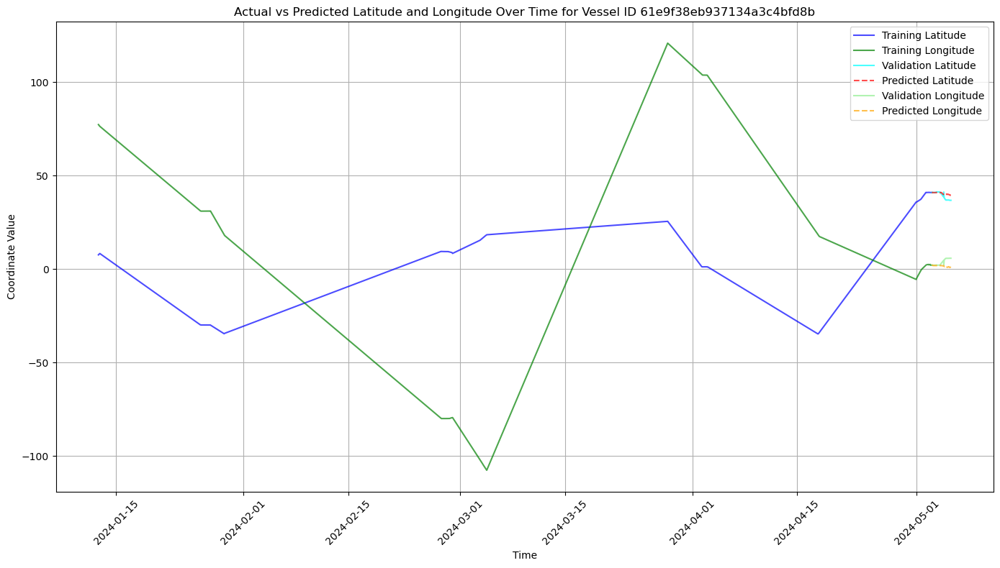

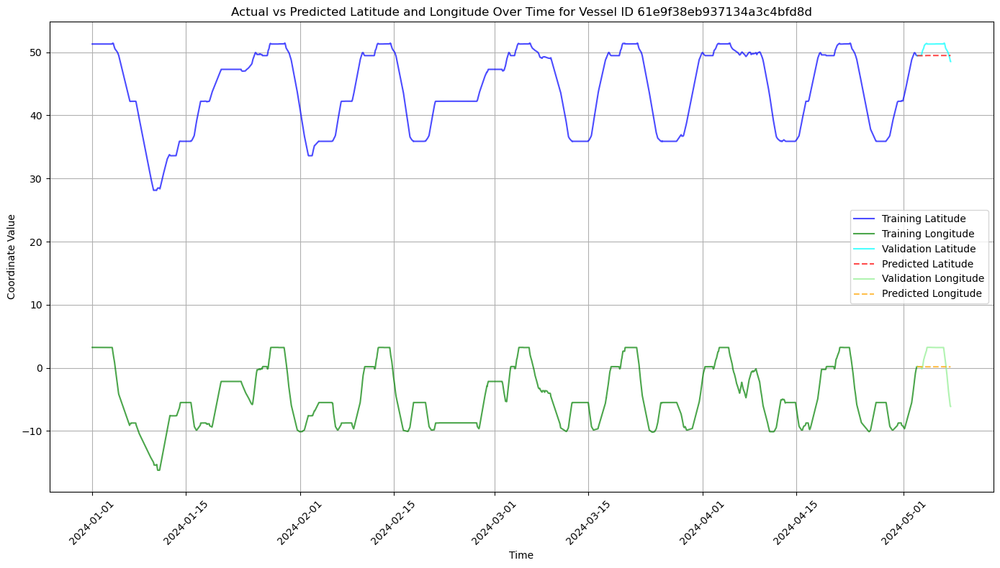

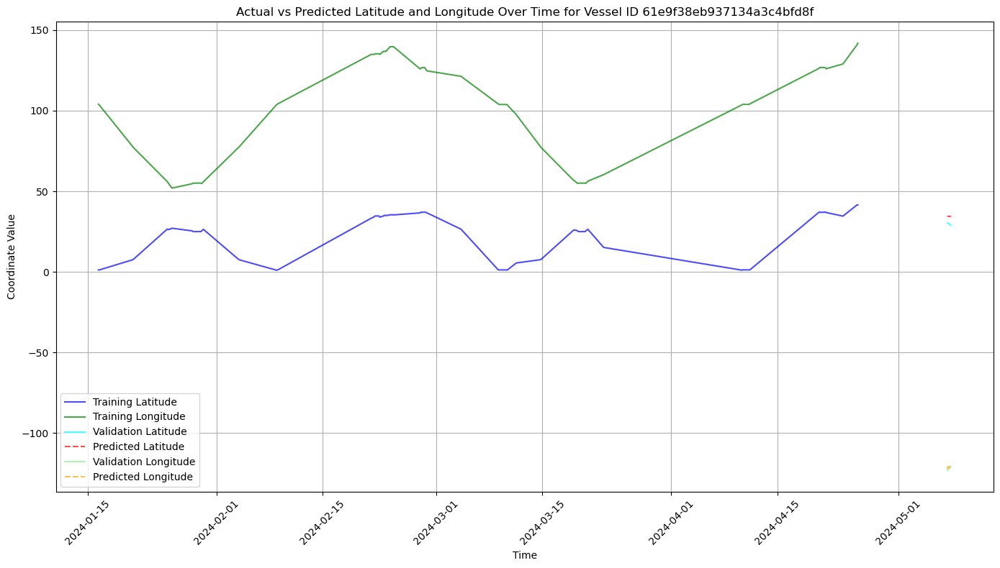

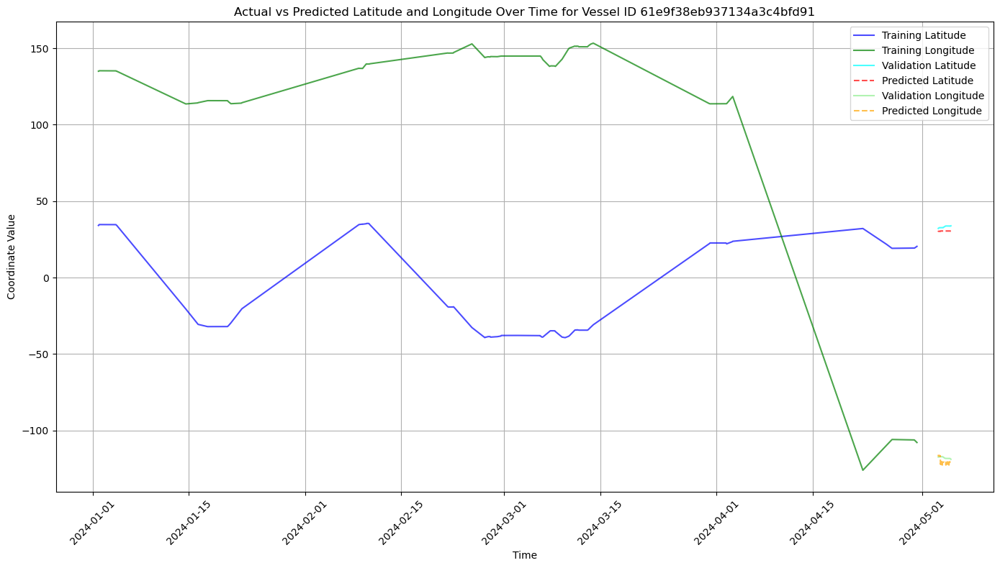

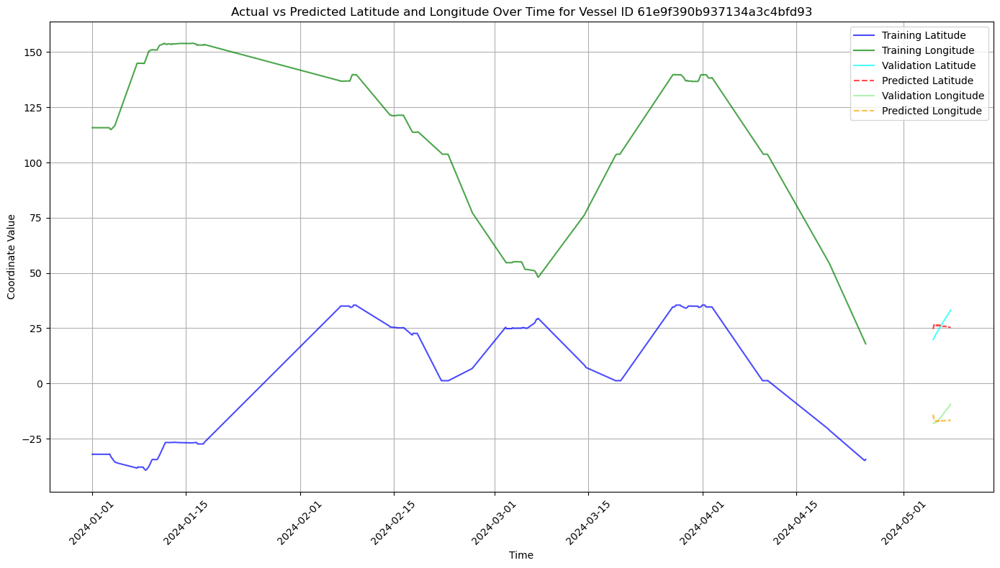

...

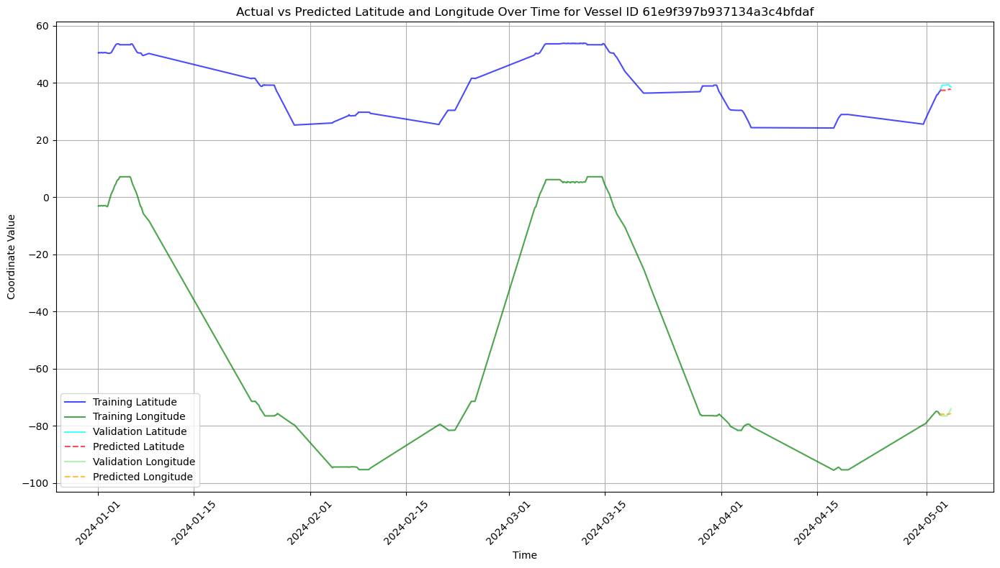

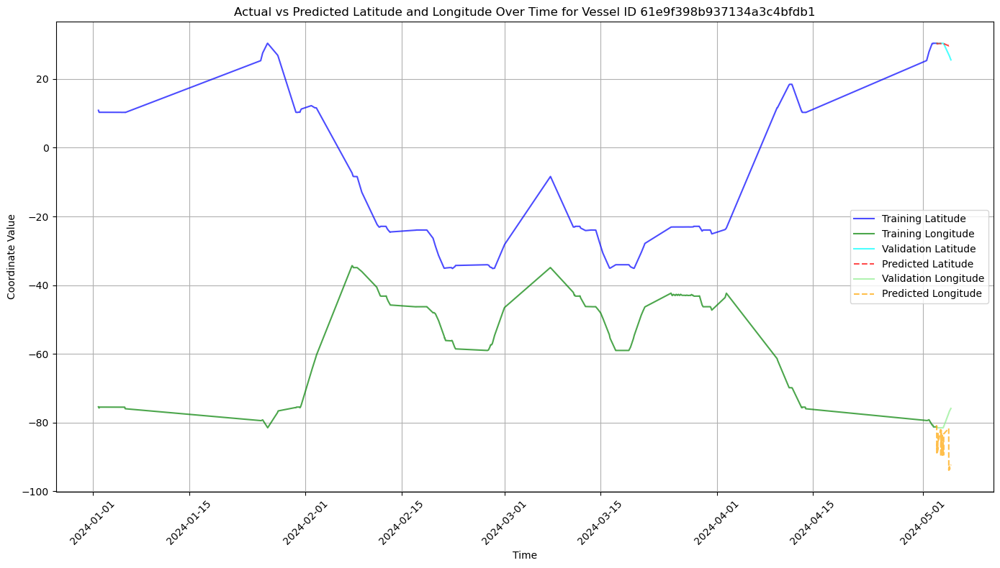

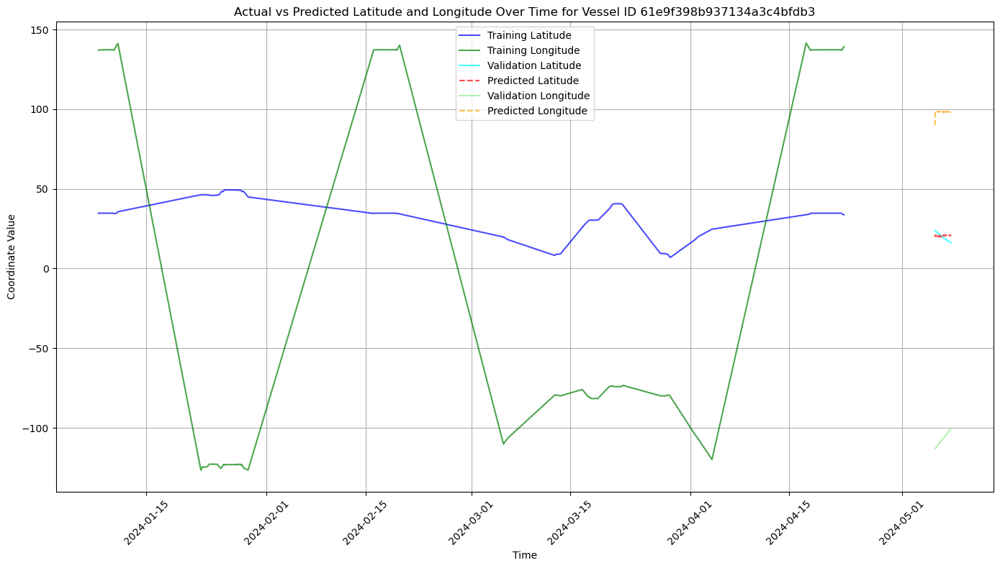

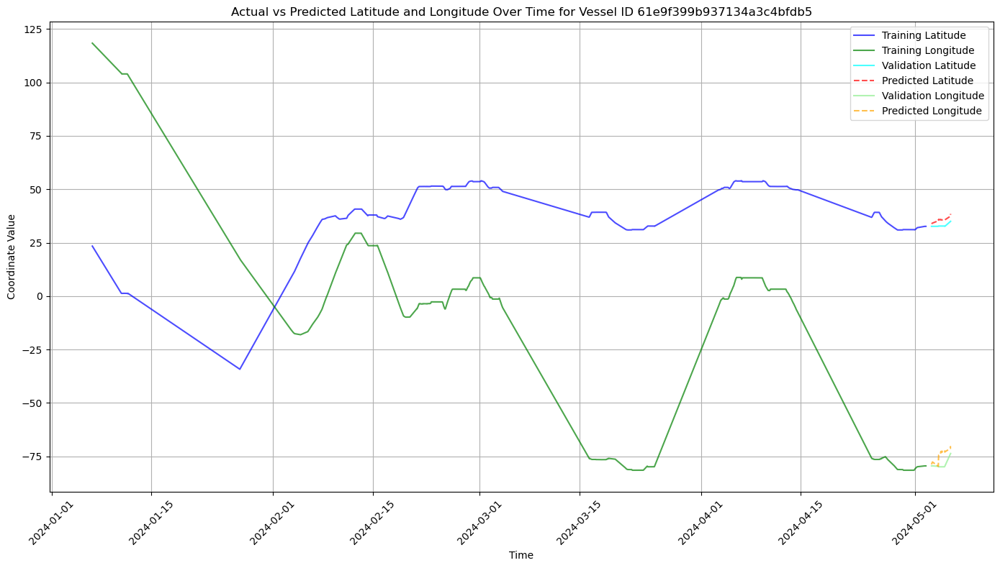

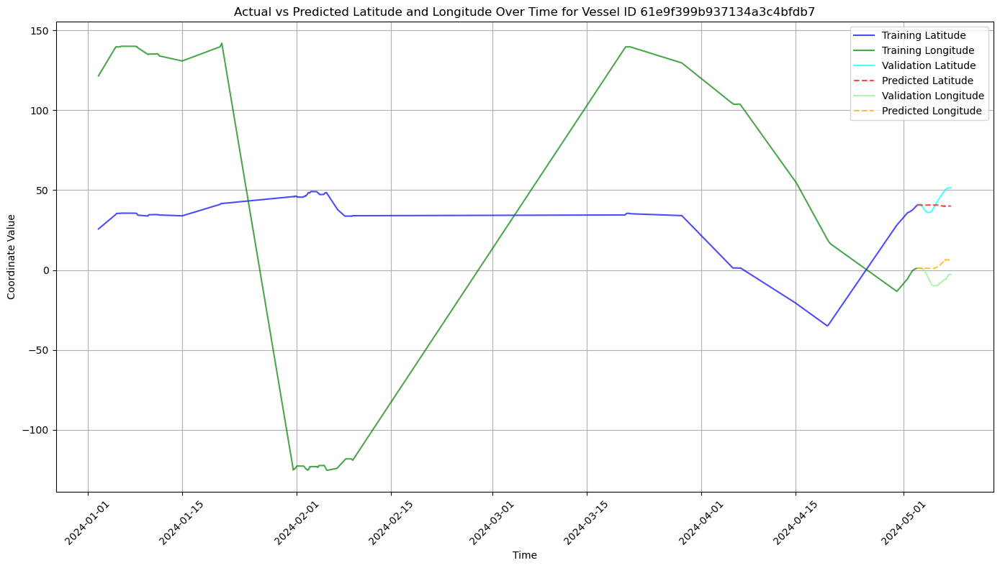

In [ ]:
def plot_coordinates_for_vessel_with_train(prediction_data, train_data, vessel_id):
    """
    Plots the actual and predicted latitude and longitude over time for a specific vessel,
    including data from both the training and prediction datasets.
    
    Parameters:
    - prediction_data: DataFrame containing validation or test actual and predicted coordinates
    - train_data: DataFrame containing training actual coordinates
    - vessel_id: The vesselId for which to plot the coordinates
    """
    # Filter data for the specified vessel in both datasets
    vessel_train_data = train_data[train_data['vesselId'] == vessel_id].sort_values(by='time')
    vessel_prediction_data = prediction_data[prediction_data['vesselId'] == vessel_id].sort_values(by='time')
    
    # Check if there is data for the vessel
    if vessel_train_data.empty and vessel_prediction_data.empty:
        print(f"No data available for vessel ID {vessel_id}")
        return
    
    plt.figure(figsize=(14, 8))
    
    # Training data - actual latitude and longitude
    if not vessel_train_data.empty:
        plt.plot(vessel_train_data['time'], vessel_train_data['latitude_vessel'], label='Training Latitude', color='blue', linestyle='-', alpha=0.7)
        plt.plot(vessel_train_data['time'], vessel_train_data['longitude_vessel'], label='Training Longitude', color='green', linestyle='-', alpha=0.7)
    
    # Validation/test data - actual and predicted latitude and longitude
    if not vessel_prediction_data.empty:
        plt.plot(vessel_prediction_data['time'], vessel_prediction_data['latitude_vessel'], label='Validation Latitude', color='cyan', linestyle='-', alpha=0.7)
        plt.plot(vessel_prediction_data['time'], vessel_prediction_data['predicted_latitude'], label='Predicted Latitude', color='red', linestyle='--', alpha=0.7)
        plt.plot(vessel_prediction_data['time'], vessel_prediction_data['longitude_vessel'], label='Validation Longitude', color='lightgreen', linestyle='-', alpha=0.7)
        plt.plot(vessel_prediction_data['time'], vessel_prediction_data['predicted_longitude'], label='Predicted Longitude', color='orange', linestyle='--', alpha=0.7)

    # Adding labels and legend
    plt.xlabel('Time')
    plt.ylabel('Coordinate Value')
    plt.legend()
    plt.title(f'Actual vs Predicted Latitude and Longitude Over Time for Vessel ID {vessel_id}')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()  # Adjust layout to make room for x-axis labels
    plt.show()



#make list of n vessels to plot
n = 20
vessels = prediction_data['vesselId'].unique()[:n]
for vessel_id in vessels:
    plot_coordinates_for_vessel_with_train(prediction_data, ais_train, vessel_id)





# A Multiple model approach based on vessel-variance-clustering + feature importance Random Forest

# Setting variables



In [ ]:
import pandas as pd
import warnings
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.ensemble import GradientBoostingRegressor
import lightgbm as lgb
import matplotlib.pyplot as plt
from geopy.distance import geodesic
import os
from lightgbm import LGBMRegressor
from collections import deque
import geopandas as gpd
from shapely.geometry import Point
from shapely.ops import nearest_points
import global_land_mask as glm
import pyproj
import seaborn as sns


ais_train = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_train.csv', delimiter='|')
ais_test= pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_test.csv')

In [ ]:
# =========================
# Parameters
# =========================

number_of_days = 5  # 0 if not just predicting
remove_fraction = 0
max_depth = 15
n_estimators = 60
mode = 'validate'  # or 'validate'
remove_anomalies_speed = True  # Set to True to remove anomalies, False to keep all records
MAX_REALISTIC_SPEED_KNOTS = 30  # Speed threshold for anomalies
trim_train_data = True
remove_cog_sog_anomalies=True

number_of_lagged_coordinates = 1
list_of_features = ['lat_diff', 'lon_diff']
moving_avg_features = []

# New parameter for rolling window size
rolling_window_size = 5  # You can adjust this as needed


# Split data

In [ ]:
import pandas as pd

ais_test['time'] = pd.to_datetime(ais_test['time'])
ais_train['time'] = pd.to_datetime(ais_train['time'])

print('Splitting data...')
if mode == 'predict':
    # Extract the target variables for the training set
    X_val = ais_test.copy()
    X_train = ais_train.copy()
    #remove all vessels that are not in the neighboorhood of the test set 
    
else:
    # Sort the entire dataset by 'time' to ensure order
    ais_sorted = ais_train.sort_values(by='time')

    # Calculate the threshold date for the last number_of_days days
    threshold_date = ais_sorted['time'].max() - pd.Timedelta(days=number_of_days)

    # Identify validation set indices where 'time' is within the last number_pf_days_days days
    val_indices = ais_sorted[ais_sorted['time'] > threshold_date].index

    # Use these indices to create the validation set
    X_val = ais_train.loc[val_indices].reset_index(drop=True)

    # Drop these indices from ais_train to get the training set
    X_train = ais_train.drop(val_indices).reset_index(drop=True)

    # Calculate the minimum date in the validation set (i.e., the first validation day)
    first_val_time = X_val['time'].min()

    # Add a column to the validation set for days since the first validation date
    X_val['days_since_last_train'] = (pd.to_datetime(X_val['time']) - pd.to_datetime(first_val_time)).dt.days + 1

    # Cap the days_since_last_train at 5
    X_val['days_since_last_train'] = X_val['days_since_last_train'].apply(lambda day: min(day, 5))

    # Remove a random x% of rows for each day in the validation set
    if 0 < remove_fraction < 1:
        # Group by 'days_since_last_train' and sample a fraction of rows from each day
        X_val = X_val.groupby('days_since_last_train', group_keys=False).apply(
            lambda group: group.sample(frac=(1 - remove_fraction), random_state=42)
        ).reset_index(drop=True)
    
print('Data split done')


Splitting data...
Data split done


# Feature engeneering

In [ ]:
# Copy datasets
ais_test = X_val.copy()
ais_train = X_train.copy()

# Ignore future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Ensure 'time' is in datetime format and sort data
ais_train['time'] = pd.to_datetime(ais_train['time'])
ais_train.sort_values(['vesselId', 'time'], inplace=True)

# Convert relevant columns to numeric types
numeric_columns = ['latitude_vessel', 'longitude_vessel', 'cog', 'sog']
ais_train[numeric_columns] = ais_train[numeric_columns].apply(pd.to_numeric, errors='coerce')

print(f"Initial training records: {len(ais_train)}")

# =========================
# Anomaly Detection and Interpolation for Latitude/Longitude
# =========================
print(f"Interpolating records with speed_knots > {MAX_REALISTIC_SPEED_KNOTS}...")

# Calculate shifted coordinates
ais_train['prev_latitude'] = ais_train.groupby('vesselId')['latitude_vessel'].shift(1)
ais_train['prev_longitude'] = ais_train.groupby('vesselId')['longitude_vessel'].shift(1)

# Function to compute distance between two points
def compute_distance(row):
    if pd.isnull(row['prev_latitude']) or pd.isnull(row['prev_longitude']):
        return np.nan
    else:
        point1 = (row['prev_latitude'], row['prev_longitude'])
        point2 = (row['latitude_vessel'], row['longitude_vessel'])
        return geodesic(point1, point2).meters

# Calculate distance in meters between consecutive points
ais_train['distance_meters'] = ais_train.apply(compute_distance, axis=1)

# Calculate time difference in seconds within each 'vesselId'
ais_train['time_diff_seconds'] = ais_train.groupby('vesselId')['time'].diff().dt.total_seconds()
ais_train['time_diff_seconds'].replace(0, np.nan, inplace=True)  # Avoid division by zero

# Calculate speed in meters per second and convert to knots
ais_train['speed_m_s'] = ais_train['distance_meters'] / ais_train['time_diff_seconds']
ais_train['speed_knots'] = ais_train['speed_m_s'] * 1.94384

# Flag speed anomalies
ais_train['speed_anomaly'] = ais_train['speed_knots'] > MAX_REALISTIC_SPEED_KNOTS

# Set anomalies to NaN in 'latitude_vessel' and 'longitude_vessel'
ais_train.loc[ais_train['speed_anomaly'], ['latitude_vessel', 'longitude_vessel']] = np.nan

# =========================
# Anomaly Detection and Interpolation for COG/SOG
# =========================
print("Interpolating out-of-range COG and SOG values...")

# Flag COG anomalies
ais_train['cog_anomaly'] = (ais_train['cog'] >= 360) | (ais_train['cog'] < 0)
ais_train['sog_anomaly'] = ais_train['sog'] > 30

# Set out-of-range COG and SOG values to NaN for interpolation
ais_train.loc[ais_train['cog_anomaly'], 'cog'] = np.nan
ais_train.loc[ais_train['sog_anomaly'], 'sog'] = np.nan

# =========================
# Interpolation for All Features
# =========================
# Set 'time' as the index for interpolation
ais_train.set_index('time', inplace=True)

# Interpolate within each 'vesselId' group and fill missing values forward/backward
ais_train[['latitude_vessel', 'longitude_vessel', 'cog', 'sog']] = ais_train.groupby('vesselId')[
    ['latitude_vessel', 'longitude_vessel', 'cog', 'sog']
].transform(lambda group: group.interpolate(method='time').ffill().bfill())

# Reset the index after interpolation
ais_train.reset_index(inplace=True)

# Drop the anomaly flag columns as they're no longer needed
ais_train.drop(columns=['speed_anomaly', 'cog_anomaly', 'sog_anomaly'], inplace=True)

# Drop any remaining NaN values resulting from shifts or interpolation limits
ais_train.dropna(subset=['latitude_vessel', 'longitude_vessel', 'cog', 'sog'], inplace=True)

print(f"Anomalies interpolated. Remaining training records: {len(ais_train)}")


Initial training records: 1461559
Interpolating records with speed_knots > 30...
Interpolating out-of-range COG and SOG values...
Anomalies interpolated. Remaining training records: 1461559


In [ ]:
import seaborn as sns
# Ensure the DataFrames are sorted by 'vesselId' and 'time'
ais_train = ais_train.sort_values(['vesselId', 'time'] )
ais_test = ais_test.sort_values(['vesselId', 'time'])

# 3. Calculate the time difference between consecutive rows within each 'vesselId'
ais_train['time_diff_seconds'] = ais_train.groupby('vesselId')['time'].diff().dt.total_seconds()


# 4. Create lagged time difference features
for i in range(1, number_of_lagged_coordinates + 2):
    if i == 1:
        # For lag 1, use the current 'time_diff_seconds' without shifting
        ais_train[f'prev{i}_time_diff_seconds'] = ais_train['time_diff_seconds']
        ais_test[f'prev{i}_time_diff_seconds'] = np.nan
    else:
        # For lags >1, shift 'time_diff_seconds' by (i -1)
        ais_train[f'prev{i}_time_diff_seconds'] = ais_train.groupby('vesselId')['time_diff_seconds'].shift(i - 1)
        ais_test[f'prev{i}_time_diff_seconds'] = np.nan
    
    # Append the feature name to the list of features
for i in range(1, number_of_lagged_coordinates + 1):
    list_of_features.append(f'prev{i}_time_diff_seconds')


# 5. (Optional) Drop the intermediate 'time_diff_seconds' column if not needed
ais_train.drop(columns=['time_diff_seconds'], inplace=True)


#generate number_of_lagged_coordinates lagged coordinates and corresponting time differences
for i in range(1, number_of_lagged_coordinates + 2):
    ais_train[f'prev{i}_longitude'] = ais_train.groupby('vesselId')['longitude_vessel'].shift(i)
    ais_train[f'prev{i}_latitude'] = ais_train.groupby('vesselId')['latitude_vessel'].shift(i)
    ais_test[f'prev{i}_longitude'] = np.nan
    ais_test[f'prev{i}_latitude'] = np.nan
for i in range (1, number_of_lagged_coordinates + 1):
    list_of_features.extend([f'prev{i}_longitude', f'prev{i}_latitude'])
    

        
if moving_avg_features:
    for feature in moving_avg_features.copy():
        if feature=='cog':
            #decompose the cog feature
            ais_train['xcog'] = ais_train['cog'].apply(lambda x: np.cos(np.radians(x)))
            ais_train['ycog'] = ais_train['cog'].apply(lambda x: np.sin(np.radians(x)))
            ais_train['xcog_moving_avg'] = ais_train.groupby('vesselId')['xcog'].transform(lambda x: x.rolling(rolling_window_size, min_periods=1).mean())
            ais_train['ycog_moving_avg'] = ais_train.groupby('vesselId')['ycog'].transform(lambda x: x.rolling(rolling_window_size, min_periods=1).mean())
            ais_test['xcog_moving_avg'] = np.nan
            ais_test['ycog_moving_avg'] = np.nan
            moving_avg_features.remove('cog')
            moving_avg_features.append('xcog')
            moving_avg_features.append('ycog')
            list_of_features.append('xcog_moving_avg')
            list_of_features.append('ycog_moving_avg')
        else:
            ais_train[f'{feature}_moving_avg'] = ais_train.groupby('vesselId')[feature].transform(lambda x: x.rolling(rolling_window_size, min_periods=1).mean())
            ais_test[f'{feature}_moving_avg'] = np.nan
            list_of_features.append(f'{feature}_moving_avg')

#drop rows with NaN values due to shift
ais_train.dropna(subset=['prev1_longitude', 'prev1_latitude', 'prev2_longitude', 'prev2_latitude'], inplace=True)
            
for feature in list_of_features.copy():
    if feature == 'weekday':      
        ais_train['weekday'] = ais_train['time'].dt.weekday.astype(int)
        ais_test['weekday'] = ais_test['time'].dt.weekday.astype(int)
    elif feature == 'month':
        ais_train['month'] = ais_train['time'].dt.month
        ais_test['month'] = ais_test['time'].dt.month
    elif feature == 'hour':
        ais_train['hour'] = ais_train['time'].dt.hour
        ais_test['hour'] = ais_test['time'].dt.hour
    # seconds after 1970
    elif feature == 'total_seconds':
        # Calculate `total_seconds` in a consistent manner across training and test sets
        reference_time = min(ais_train['time'].min(), ais_test['time'].min())
        # Update `total_seconds` calculation
        ais_train['total_seconds'] = (ais_train['time'] - reference_time).dt.total_seconds()
        ais_test['total_seconds'] = (ais_test['time'] - reference_time).dt.total_seconds()
    elif feature == 'day_of_year':
        ais_train['day_of_year'] = ais_train['time'].dt.dayofyear
        ais_test['day_of_year'] = ais_test['time'].dt.dayofyear
    elif feature == 'lon_diff':
        ais_train['lon_diff'] = ((ais_train['prev1_longitude'] - ais_train['prev2_longitude'])/ais_train['prev2_time_diff_seconds']*ais_train['prev1_time_diff_seconds'])
        ais_test['lon_diff'] = np.nan
    elif feature == 'lat_diff':
        ais_train['lat_diff'] = (((ais_train['prev1_latitude'] - ais_train['prev2_latitude'])/ais_train['prev2_time_diff_seconds'])*ais_train['prev1_time_diff_seconds'])
        ais_test['lat_diff'] = np.nan
    elif feature == 'distance':
        ais_train['distance'] = ais_train.apply(
        lambda x: geodesic(
            (x['prev2_latitude'], x['prev2_longitude']), 
            (x['prev1_latitude'], x['prev1_longitude'])  # Corrected
            ).meters, 
            axis=1)
        ais_test['distance'] = np.nan  # As per your original logic
    elif feature == 'xcogxtime':
        ais_train['xcogxtime'] = ais_train['xcog']*ais_train['prev1_time_diff_seconds']
        ais_test['xcogxtime'] = np.nan
    elif feature == 'ycogxtime':
        ais_train['ycogxtime'] = ais_train['ycog']*ais_train['prev1_time_diff_seconds']
        ais_test['ycogxtime'] = np.nan
    elif feature=='sogxtime':
        ais_train['sogxtime'] = ais_train['sog']*ais_train['prev1_time_diff_seconds']
        ais_test['sogxtime'] = np.nan
    
    
ais_train['haversine_distance'] = 6371000 * 2 * np.arcsin(
np.sqrt(
np.sin(np.radians((ais_train['latitude_vessel'] - ais_train['prev1_latitude']) / 2))**2 +
np.cos(np.radians(ais_train['prev1_latitude'])) * np.cos(np.radians(ais_train['latitude_vessel'])) *
np.sin(np.radians((ais_train['longitude_vessel'] - ais_train['prev1_longitude']) / 2))**2
    )
)

# Define bins and labels in meters
bins = [-np.inf, 0.1e12, 0.3e12, np.inf]  # <3.75e6, 3.75e6-11e6, >11e6 meters
labels = ['cluster_distance_0', 'cluster_distance_1', 'cluster_distance_2']

# Calculate average Haversine distance per vessel
var_haversine = ais_train.groupby('vesselId')['haversine_distance'].var()

# After assigning cluster labels
cluster_labels = pd.cut(var_haversine, bins=bins, labels=[0, 1, 2])

# Create a mapping from 'vesselId' to cluster number
cluster_mapping = cluster_labels.to_dict()

#Map cluster labels to ais_train and ais_test
ais_train['cluster_distance'] = ais_train['vesselId'].map(cluster_mapping)
ais_test['cluster_distance'] = ais_test['vesselId'].map(cluster_mapping)

                
# Create a dictionary mapping vesselId to cluster number
#cluster_dict = ais_train.set_index('vesselId')[['cluster_distance_0', 'cluster_distance_1', 'cluster_distance_2']].idxmax(axis=1).str[-1].astype(int).to_dict()

#print number of vessels in each cluster
print(ais_train['cluster_distance'].value_counts())
#print number of unique vessels in each cluster
print(ais_train.groupby('cluster_distance')['vesselId'].nunique())

        
ais_train.dropna(subset=list_of_features, inplace=True)

#sort by vesselId and time
ais_train.sort_values(by=['vesselId', 'time'], inplace=True)
ais_test.sort_values(by=['vesselId', 'time'], inplace=True)




cluster_distance
0    903301
1    467946
2     88937
Name: count, dtype: int64
cluster_distance
0    268
1    307
2    112
Name: vesselId, dtype: int64


# Trim train set

In [ ]:

if trim_train_data:
    # Find the median number of rows per vessel in the training set
    median_rows_per_vessel = ais_train.groupby('vesselId').size().median()
    print(median_rows_per_vessel)

    # Calculate the number of rows per vessel in the training set
    rows_per_vessel = ais_train.groupby('vesselId').size()

    # Find vessels with fewer than the median number of rows
    vessels_with_few_rows = set(rows_per_vessel[rows_per_vessel < 100].index)

    # Find vessels that are in the training set but not in the test set
    vessels_not_in_test = set(ais_train['vesselId']) - set(ais_test['vesselId'])

    # Combine conditions: vessels with few rows AND not in test set
    vessels_to_remove = vessels_with_few_rows & vessels_not_in_test

    # Remove rows corresponding to these vessels from the training set
    ais_train = ais_train[~ais_train['vesselId'].isin(vessels_to_remove)]

    #print number of negative time differences
    print(ais_train[ais_train['prev1_time_diff_seconds'] < 0].shape[0])
    
if mode == 'validate':
    #ais_test = ais_test[~ais_test['vesselId'].isin(vessels_to_remove)]
    #if boat is not in train set but in test set, remove it from test set
    ais_test = ais_test[ais_test['vesselId'].isin(ais_train['vesselId'])]
    


moving_avg_dicts = {}

for feature in moving_avg_features:
    moving_avg_dicts[f"{feature}_moving_avg"] = {}
    
    
# Initialize with training data
for vessel_id, group in ais_train.groupby('vesselId'):
    #sort by time
    group.sort_values(by='time', inplace=True) 
    for feature in moving_avg_features:
        moving_avg_dicts[f"{feature}_moving_avg"][vessel_id] = deque(group[f'{feature}_moving_avg'].tail(rolling_window_size), maxlen=rolling_window_size)
        
        
def update_moving_averages(vessel_id, feature, new_value):
    moving_avg_dicts[f"{feature}_moving_avg"][vessel_id].append(new_value)
    return np.mean(moving_avg_dicts[f"{feature}_moving_avg"][vessel_id])   
    

1626.0
0


# Define training features

# Train model

In [ ]:
print('Training models...')

# Initialize dictionaries to store models for each cluster
models_long = {}
models_lat = {}

# Train separate longitude and latitude models for each cluster
for cluster in [0, 1, 2]:
    print(f'Processing cluster {cluster}...')
    if cluster == 2:
        # For cluster 2, combine data from clusters 0, 1, and 2
        X_cluster = ais_train[ais_train['cluster_distance'].isin([0, 1, 2])][list_of_features]
        y_long_cluster = ais_train[ais_train['cluster_distance'].isin([0, 1, 2])]['longitude_vessel']
        y_lat_cluster = ais_train[ais_train['cluster_distance'].isin([0, 1, 2])]['latitude_vessel']
    elif cluster == 1:
        # For cluster 1, combine data from clusters 0 and 1
        X_cluster = ais_train[ais_train['cluster_distance'].isin([0, 1])][list_of_features]
        y_long_cluster = ais_train[ais_train['cluster_distance'].isin([0, 1])]['longitude_vessel']
        y_lat_cluster = ais_train[ais_train['cluster_distance'].isin([0, 1])]['latitude_vessel']
    else:
        X_cluster = ais_train[ais_train['cluster_distance'] == cluster][list_of_features]
        y_long_cluster = ais_train[ais_train['cluster_distance'] == cluster]['longitude_vessel']
        y_lat_cluster = ais_train[ais_train['cluster_distance'] == cluster]['latitude_vessel']

    if not X_cluster.empty:
        print(f'Training longitude model for cluster {cluster}...')
        models_long[cluster] = RandomForestRegressor(
            n_estimators=n_estimators, 
            max_depth=max_depth, 
            random_state=42, 
            n_jobs=-1, 
            verbose=0
        ).fit(X_cluster, y_long_cluster)
        
        print(f'Training latitude model for cluster {cluster}...')
        models_lat[cluster] = RandomForestRegressor(
            n_estimators=n_estimators, 
            max_depth=max_depth, 
            random_state=42, 
            n_jobs=-1, 
            verbose=0
        ).fit(X_cluster, y_lat_cluster)
        
        # Print feature importance
        print(f'Feature importance for longitude model (Cluster {cluster}):')
        for feature, importance in zip(list_of_features, models_long[cluster].feature_importances_):
            print(f'{feature}: {importance:.4f}')
        
        print(f'Feature importance for latitude model (Cluster {cluster}):')
        for feature, importance in zip(list_of_features, models_lat[cluster].feature_importances_):
            print(f'{feature}: {importance:.4f}')
    else:
        print(f"No data for cluster {cluster}. Skipping model training for this cluster.")

print('Model training complete.')


Training models...
Processing cluster 0...
Training longitude model for cluster 0...
Training latitude model for cluster 0...
Feature importance for longitude model (Cluster 0):
lat_diff: 0.0002
lon_diff: 0.0006
prev1_time_diff_seconds: 0.0008
prev1_longitude: 0.9983
prev1_latitude: 0.0001
Feature importance for latitude model (Cluster 0):
lat_diff: 0.0007
lon_diff: 0.0003
prev1_time_diff_seconds: 0.0006
prev1_longitude: 0.0001
prev1_latitude: 0.9984
Processing cluster 1...
Training longitude model for cluster 1...
Training latitude model for cluster 1...
Feature importance for longitude model (Cluster 1):
lat_diff: 0.0002
lon_diff: 0.0016
prev1_time_diff_seconds: 0.0022
prev1_longitude: 0.9958
prev1_latitude: 0.0002
Feature importance for latitude model (Cluster 1):
lat_diff: 0.0013
lon_diff: 0.0004
prev1_time_diff_seconds: 0.0015
prev1_longitude: 0.0003
prev1_latitude: 0.9965
Processing cluster 2...
Training longitude model for cluster 2...
Training latitude model for cluster 2...
Fe

#  Predict



In [ ]:
def adjust_to_sea(lat, lon):
    """
    Adjusts a point to the closest sea point if it's on land.
    
    Parameters:
    - lat (float): Latitude of the point.
    - lon (float): Longitude of the point.
    
    Returns:
    - (new_lat, new_lon) (tuple): Adjusted coordinates on sea or original if already on sea.
    """
    if not glm.is_land(lat, lon):
        return lat, lon  # Already on sea
    
    point = Point(lon, lat)
    nearest = nearest_points(point, coastline)[1]
    azimuth, _, _ = geod.inv(nearest.x, nearest.y, point.x, point.y)
    sea_azimuth = (azimuth + 180) % 360  # Direction towards sea
    
    # Move 1 km towards sea
    new_lon, new_lat, _ = geod.fwd(nearest.x, nearest.y, sea_azimuth, 10)
    if not glm.is_land(new_lat, new_lon):
        print('jadda')
        return new_lat, new_lon
    
    # If still on land, move further (up to 100 km)
    for distance in [ 50, 100, 200, 500, 1000, 2000, 5000, 10000, 20000, 50000, 100000]:
        new_lon, new_lat, _ = geod.fwd(nearest.x, nearest.y, sea_azimuth, distance)
        if not glm.is_land(new_lat, new_lon):
            print(f"Adjusted to sea at distance {distance} m")
            return new_lat, new_lon
    print(f"Warning: Could not find sea point for ({lat}, {lon}). Returning original coordinates.")
    return lat, lon  # Fallback to original if no sea point found

In [ ]:
# Initialize the prediction set from ais_test
prediction_data = ais_test.copy()
prediction_data['predicted_longitude'] = np.nan
prediction_data['predicted_latitude'] = np.nan

# Set up groups for efficient lookup by vessel
train_set_sorted = ais_train.sort_values(by=['vesselId', 'time'])
ais_train_groups = train_set_sorted.groupby('vesselId')

# Initialize counters for progress tracking
total_rows = len(prediction_data)
progress_interval = max(total_rows // 100, 1)  # Calculate for 1% intervals, minimum 1
processed_rows = 0  # Initialize counter for processed rows

# Set model to use a single thread for faster individual row processing
for model in models_long.values():
    model.set_params(n_jobs=1)
for model in models_lat.values():
    model.set_params(n_jobs=1)

# Loop through each vessel to perform sequential predictions
for vessel_id, group in prediction_data.groupby('vesselId'):
    # Get cluster number for the vessel
    cluster_num = cluster_mapping.get(vessel_id)
    
    # Get past data for this vessel
    past_data = ais_train_groups.get_group(vessel_id)
    # Track last known position within each vessel group
    last_known_data = past_data.iloc[-1].copy()
    
    last_known_data['predicted_longitude'] = last_known_data['longitude_vessel']
    last_known_data['predicted_latitude'] = last_known_data['latitude_vessel']
    
    # Iterate over each row for this vessel in prediction_data
    for idx, (index, row) in enumerate(group.iterrows()):
        dict_avgs = {}
        
        for feature in moving_avg_features:
            if feature == 'latitude_vessel':
                dict_avgs[feature] = update_moving_averages(
                    vessel_id,
                    feature,
                    last_known_data['predicted_latitude']
                )
            elif feature == 'longitude_vessel':
                dict_avgs[feature] = update_moving_averages(
                    vessel_id,
                    feature,
                    last_known_data['predicted_longitude']
                )
            else:
                dict_avgs[feature] = update_moving_averages(
                    vessel_id,
                    feature,
                    last_known_data[f'{feature}_moving_avg']
                )
        
        # Assign moving averages to the current row
        for feature in moving_avg_features:
            prediction_data.at[index, f'{feature}_moving_avg'] = dict_avgs[feature]
        
        # Update lagged time difference dynamically
        time_diff = (row['time'] - last_known_data['time']).total_seconds()
        
        prediction_data.at[index, 'prev1_time_diff_seconds'] = time_diff
        prediction_data.at[index, 'prev2_time_diff_seconds'] = last_known_data['prev1_time_diff_seconds']
        
        # Dynamically update lagged coordinates
        prediction_data.at[index, 'prev1_longitude'] = last_known_data['predicted_longitude']
        prediction_data.at[index, 'prev1_latitude'] = last_known_data['predicted_latitude']
        prediction_data.at[index, 'prev2_latitude'] = last_known_data['prev1_latitude']
        prediction_data.at[index, 'prev2_longitude'] = last_known_data['prev1_longitude']
        
        if 'lat_diff' in list_of_features:
            prediction_data.at[index, 'lat_diff'] = (((last_known_data['predicted_latitude'] - last_known_data['prev1_latitude']) / last_known_data['prev1_time_diff_seconds']) * time_diff)
            prediction_data.at[index, 'lon_diff'] = (((last_known_data['predicted_longitude'] - last_known_data['prev1_longitude']) / last_known_data['prev1_time_diff_seconds']) * time_diff)
        
        if 'distance' in list_of_features:
            prediction_data.at[index, 'distance'] = geodesic(
                (last_known_data['prev1_latitude'], last_known_data['prev1_longitude']),
                (last_known_data['predicted_latitude'], last_known_data['predicted_longitude'])
            ).meters
        
        if 'xcogxtime' in list_of_features:
            prediction_data.at[index, 'xcogxtime'] = prediction_data.at[index, 'xcog_moving_avg'] * time_diff
                
        if 'ycogxtime' in list_of_features:
            prediction_data.at[index, 'ycogxtime'] = prediction_data.at[index, 'ycog_moving_avg'] * time_diff
        
        if 'sogxtime' in list_of_features:
            prediction_data.at[index, 'sogxtime'] = prediction_data.at[index, 'sog_moving_avg'] * time_diff
        
        # Handling lag_lat_diff and lag_lon_diff
        if 'lag_lat_diff' in list_of_features:
            prediction_data.at[index, 'lag_lat_diff'] = last_known_data['lat_diff']
        if 'lag_lon_diff' in list_of_features:
            prediction_data.at[index, 'lag_lon_diff'] = last_known_data['lon_diff']

        if number_of_lagged_coordinates > 1:
            # Update higher-order lag features based on latest predictions
            for i in range(2, number_of_lagged_coordinates + 1):  
                # Shift previous predictions back for each lag
                prediction_data.at[index, f'prev{i}_longitude'] = last_known_data.get(f'prev{i-1}_longitude', np.nan)
                prediction_data.at[index, f'prev{i}_latitude'] = last_known_data.get(f'prev{i-1}_latitude', np.nan)
                prediction_data.at[index, f'prev{i}_time_diff_seconds'] = last_known_data.get(f'prev{i-1}_time_diff_seconds', np.nan)
        
        features = prediction_data.loc[index, list_of_features].to_frame().T
        
        if features.isnull().any().any():
            print(f"Invalid features at index {index}. Skipping prediction.")
            continue
                
        # Select the appropriate models based on cluster
        model_long_cluster = models_long.get(cluster_num)
        model_lat_cluster = models_lat.get(cluster_num)
        
        # Make predictions for the current row
        pred_long = model_long_cluster.predict(features)[0]
        pred_lat = model_lat_cluster.predict(features)[0]
        
        # Store predictions
        prediction_data.at[index, 'predicted_longitude'] = pred_long
        prediction_data.at[index, 'predicted_latitude'] = pred_lat
        
        # Update last known data with current prediction
        last_known_data = prediction_data.loc[index].copy()
        last_known_data['time'] = row['time']
        
        
        # Increment the counter for processed rows and print progress
        processed_rows += 1
        if processed_rows % progress_interval == 0:
            percent_complete = int((processed_rows / total_rows) * 100)
            print(f"Processing: {percent_complete}% complete.")
                
print("Processing: 100% complete.")



Processing: 0% complete.
Processing: 1% complete.
Processing: 2% complete.
Processing: 3% complete.
Processing: 4% complete.
Processing: 5% complete.
Processing: 6% complete.
Processing: 7% complete.
Processing: 8% complete.
Processing: 9% complete.
Processing: 10% complete.
Processing: 11% complete.
Processing: 12% complete.
Processing: 13% complete.
Processing: 14% complete.
Processing: 15% complete.
Processing: 16% complete.
Processing: 17% complete.
Processing: 18% complete.
Processing: 19% complete.
Processing: 20% complete.
Processing: 21% complete.
Processing: 22% complete.
Processing: 23% complete.
Processing: 24% complete.
Processing: 25% complete.
Processing: 26% complete.
Processing: 27% complete.
Processing: 28% complete.
Processing: 29% complete.
Processing: 30% complete.
Processing: 31% complete.
Processing: 32% complete.
Processing: 33% complete.
Processing: 34% complete.
Processing: 35% complete.
Processing: 36% complete.
Processing: 37% complete.
Processing: 38% comple

In [ ]:

#outputs
if mode=='predict':
    
    detailed_predictions = prediction_data
    detailed_predictions.to_csv('Detailed_Predictions.csv', index=False)
    print("Detailed predictions saved to Detailed_Predictions.csv.")

    submission_predictions = prediction_data[['ID', 'predicted_longitude', 'predicted_latitude']]
    submission_predictions.to_csv('Submission.csv', index=False)
    print("Submission predictions saved to Submission.csv.")
    
elif mode=='validate':
    
    def get_scaling_factor(row):
        if row['days_since_last_train'] == 1:
            return 0.3
        elif row['days_since_last_train'] == 2:
            return 0.25
        elif row['days_since_last_train'] == 3:
            return 0.2
        elif row['days_since_last_train'] == 4:
            return 0.15
        elif row['days_since_last_train'] == 5:
            return 0.1
        else:
            print('Error in the get_scaling_factor function')
        
    
    def weighted_haversine_distance(row):
        return geodesic((row['latitude_vessel'], row['longitude_vessel']), (row['predicted_latitude'], row['predicted_longitude'])).meters * get_scaling_factor(row)
    
    prediction_data['distance'] = prediction_data.apply(weighted_haversine_distance, axis=1)
    
    mean_distance = prediction_data['distance'].mean()/1000.0
    
    print(f"Mean distance: {mean_distance:.2f} kilometers")
    
    
    
    # Track validation results and parameters
    #Prepare data for saving
    result_data = {
        "features": [", ".join(list_of_features)],  # Join feature names as a single string
        "n_estimators": [n_estimators],
        "depth": [max_depth],
        "number_of_days": [number_of_days],
        "validation_score": [mean_distance],
        "remove_fraction": [remove_fraction]
    }

    # Create a DataFrame
    result_df = pd.DataFrame(result_data)

    # Define the output file
    output_file = "feature_validation_results.csv"

    # Append to CSV or create it if it doesn't exist
    if not os.path.exists(output_file):
        result_df.to_csv(output_file, index=False)
    else:
        result_df.to_csv(output_file, mode='a', header=False, index=False)

    print(f"Validation results saved to {output_file}")


Mean distance: 113.72 kilometers
Validation results saved to feature_validation_results.csv


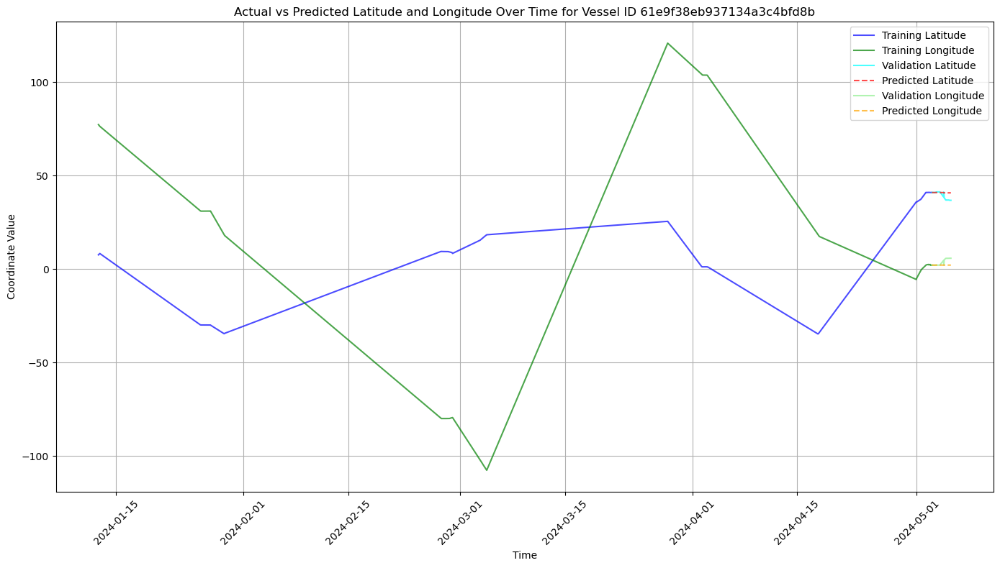

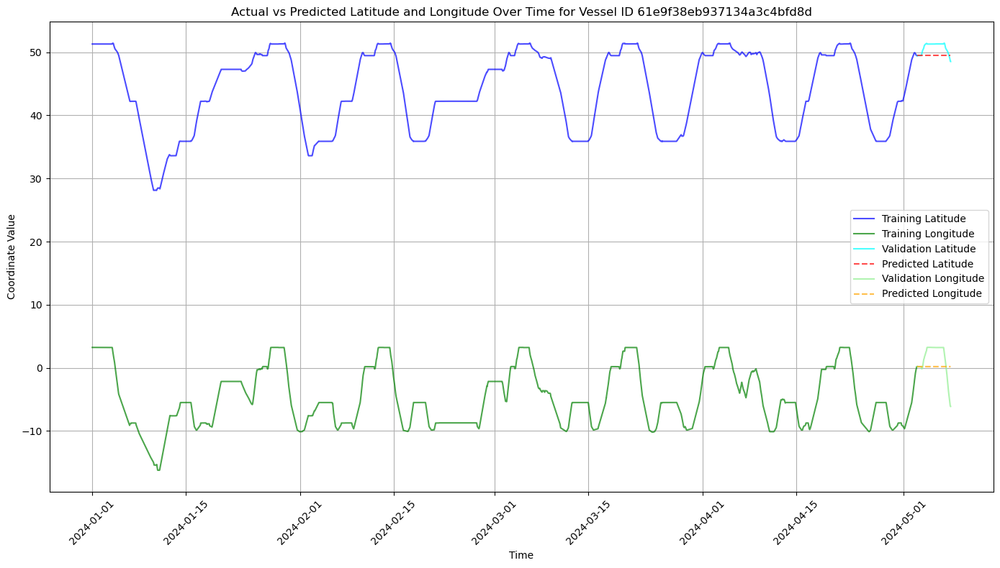

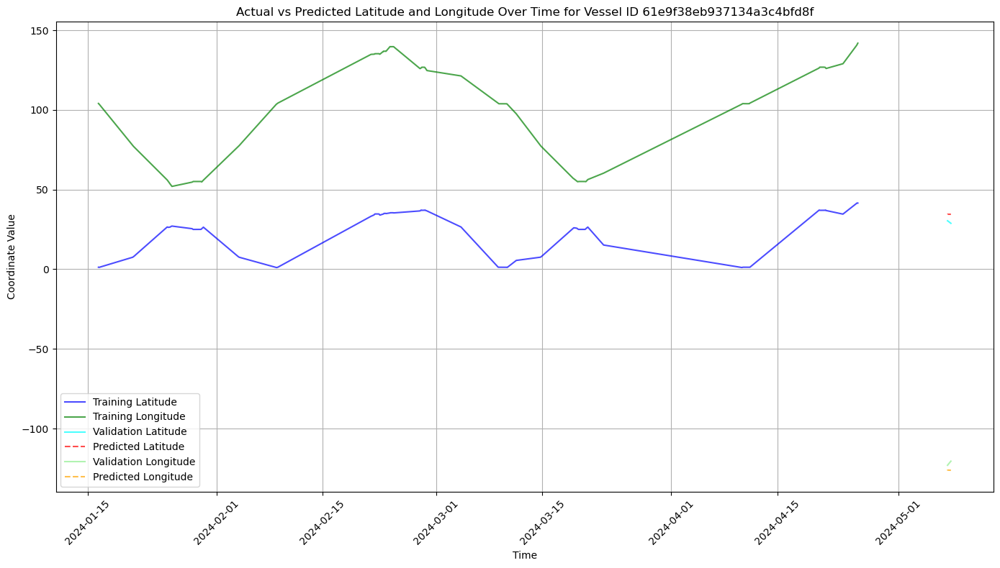

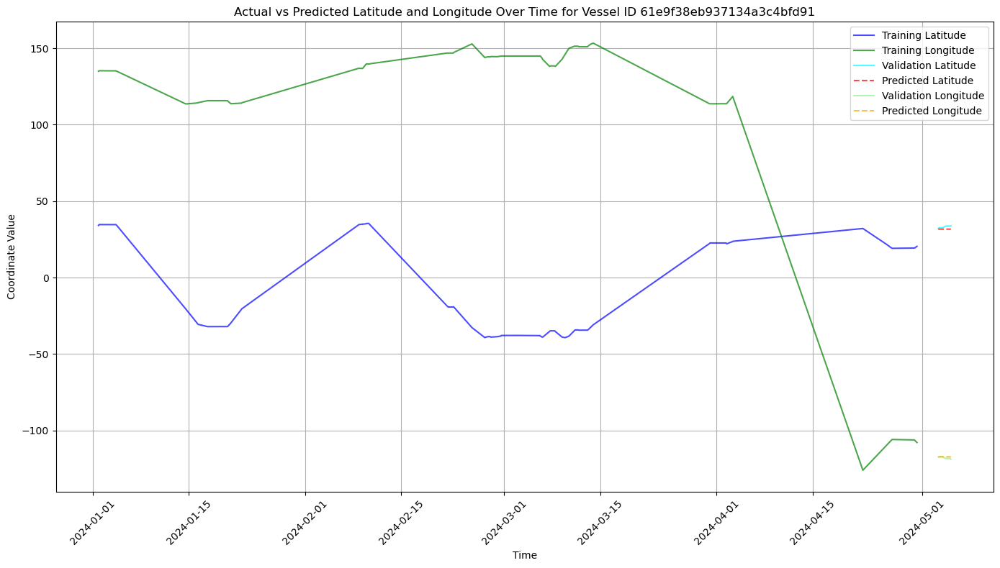

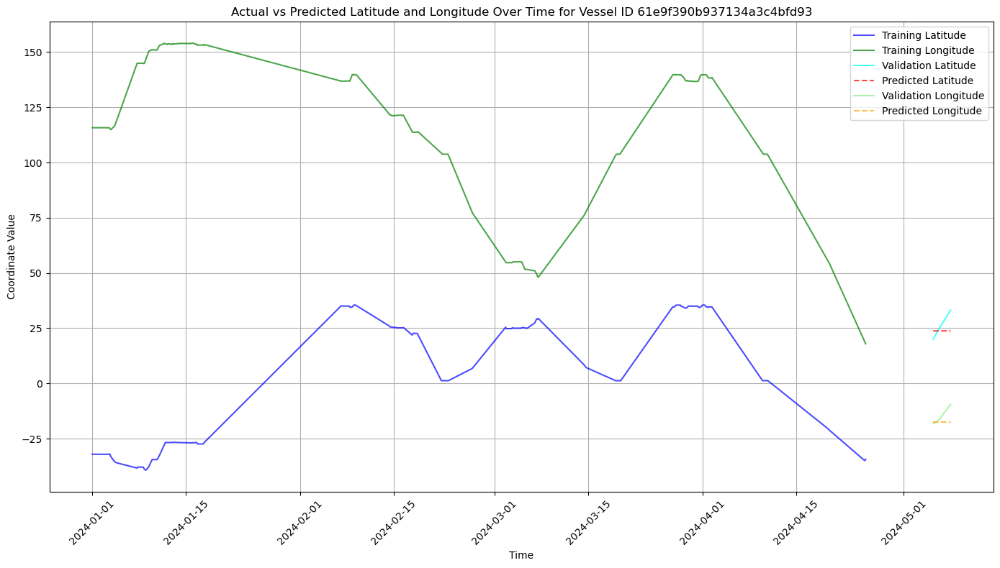

...

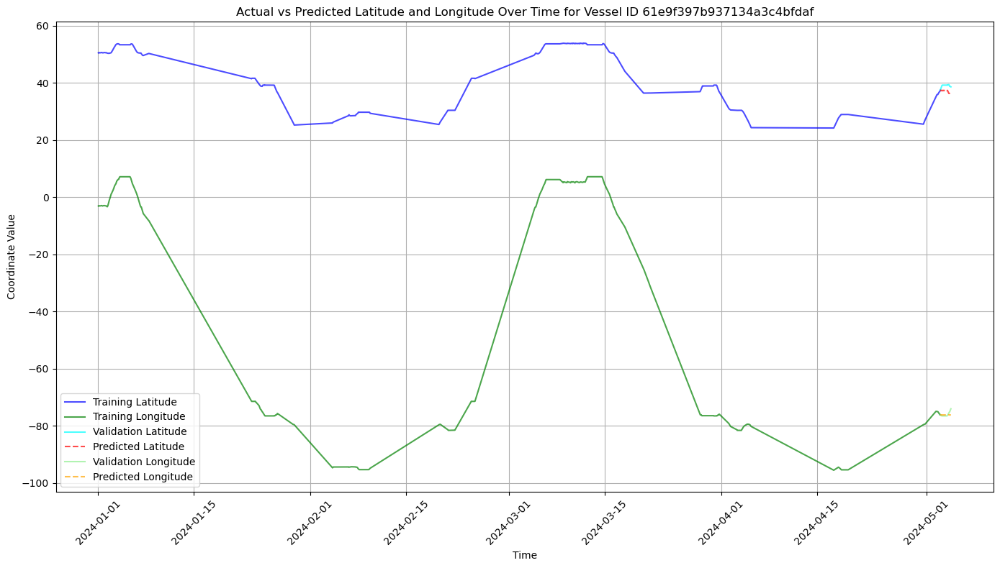

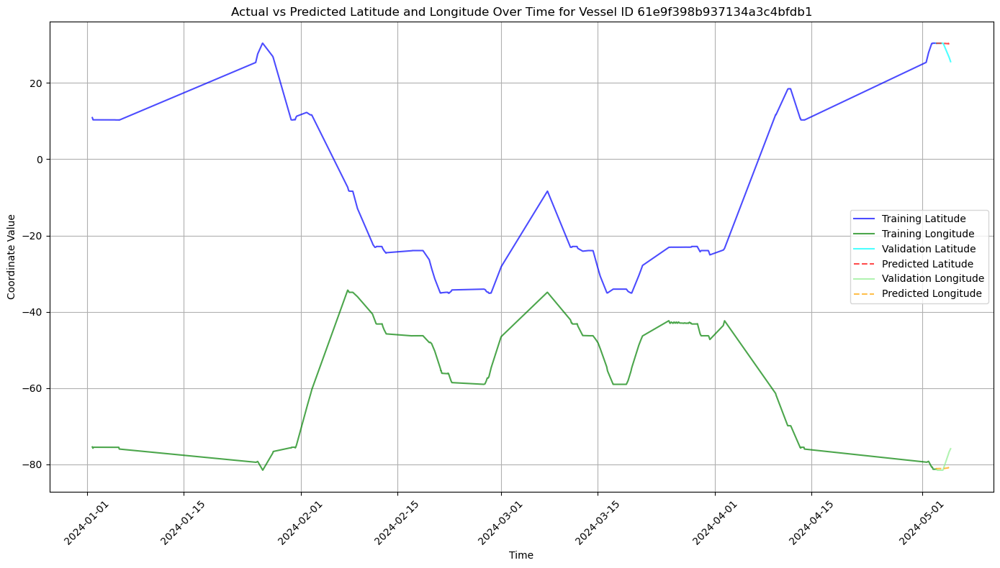

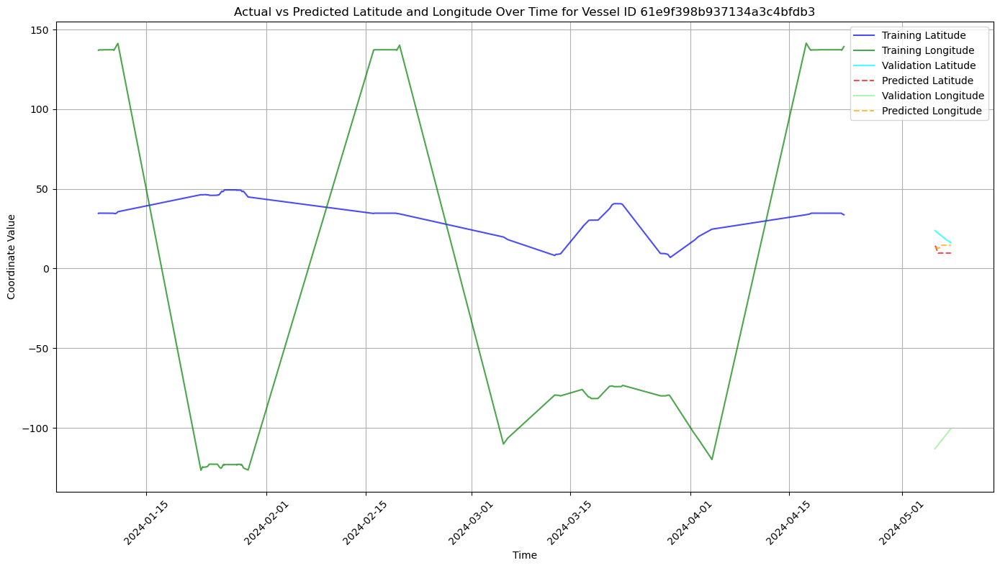

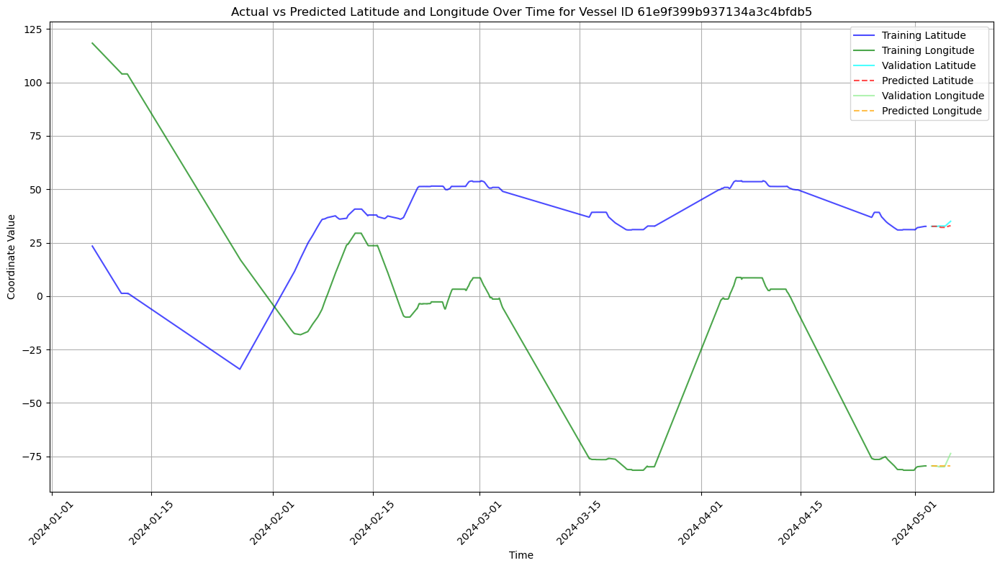

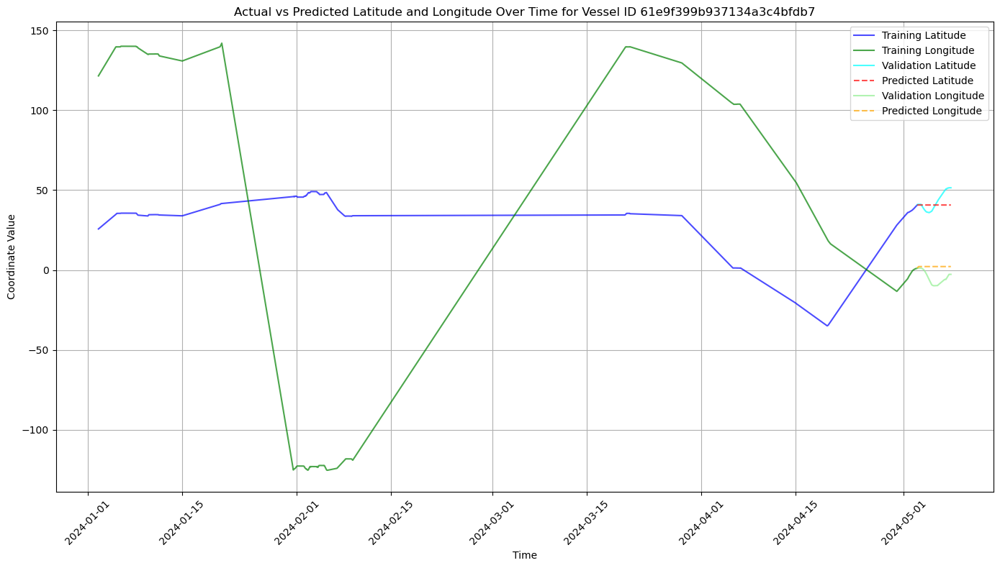

In [ ]:
def plot_coordinates_for_vessel_with_train(prediction_data, train_data, vessel_id):
    """
    Plots the actual and predicted latitude and longitude over time for a specific vessel,
    including data from both the training and prediction datasets.
    
    Parameters:
    - prediction_data: DataFrame containing validation or test actual and predicted coordinates
    - train_data: DataFrame containing training actual coordinates
    - vessel_id: The vesselId for which to plot the coordinates
    """
    # Filter data for the specified vessel in both datasets
    vessel_train_data = train_data[train_data['vesselId'] == vessel_id].sort_values(by='time')
    vessel_prediction_data = prediction_data[prediction_data['vesselId'] == vessel_id].sort_values(by='time')
    
    # Check if there is data for the vessel
    if vessel_train_data.empty and vessel_prediction_data.empty:
        print(f"No data available for vessel ID {vessel_id}")
        return
    
    plt.figure(figsize=(14, 8))
    
    # Training data - actual latitude and longitude
    if not vessel_train_data.empty:
        plt.plot(vessel_train_data['time'], vessel_train_data['latitude_vessel'], label='Training Latitude', color='blue', linestyle='-', alpha=0.7)
        plt.plot(vessel_train_data['time'], vessel_train_data['longitude_vessel'], label='Training Longitude', color='green', linestyle='-', alpha=0.7)
    
    # Validation/test data - actual and predicted latitude and longitude
    if not vessel_prediction_data.empty:
        plt.plot(vessel_prediction_data['time'], vessel_prediction_data['latitude_vessel'], label='Validation Latitude', color='cyan', linestyle='-', alpha=0.7)
        plt.plot(vessel_prediction_data['time'], vessel_prediction_data['predicted_latitude'], label='Predicted Latitude', color='red', linestyle='--', alpha=0.7)
        plt.plot(vessel_prediction_data['time'], vessel_prediction_data['longitude_vessel'], label='Validation Longitude', color='lightgreen', linestyle='-', alpha=0.7)
        plt.plot(vessel_prediction_data['time'], vessel_prediction_data['predicted_longitude'], label='Predicted Longitude', color='orange', linestyle='--', alpha=0.7)

    # Adding labels and legend
    plt.xlabel('Time')
    plt.ylabel('Coordinate Value')
    plt.legend()
    plt.title(f'Actual vs Predicted Latitude and Longitude Over Time for Vessel ID {vessel_id}')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()  # Adjust layout to make room for x-axis labels
    plt.show()



#make list of n vessels to plot
n = 20
vessels = prediction_data['vesselId'].unique()[:n]
for vessel_id in vessels:
    plot_coordinates_for_vessel_with_train(prediction_data, ais_train, vessel_id)





# HistGradientBoostingRegressor

# Setting variables



In [ ]:
import pandas as pd
import warnings
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.ensemble import GradientBoostingRegressor

import lightgbm as lgb
import matplotlib.pyplot as plt
from geopy.distance import geodesic
import os


ais_train = pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_train.csv', delimiter='|')
ais_test= pd.read_csv('/Users/danialbashir/Desktop/Projects/TDT4173-Main-Project-1/Data/ais_test.csv')

In [ ]:

number_of_days = 5 # 0 if not just predicting
remove_fraction = 0
max_depth = 10
n_estimators = 5000
mode = 'validate' #or 'validate'
remove_anomalies_speed = True  # Set to True to remove anomalies, False to keep all records
MAX_REALISTIC_SPEED_KNOTS = 35  # Speed threshold for anomalies
trim_train_data = False

number_of_lagged_coordinates = 1
list_of_features = ['total_seconds']


# Split data

In [ ]:
import pandas as pd

ais_test['time'] = pd.to_datetime(ais_test['time'])
ais_train['time'] = pd.to_datetime(ais_train['time'])

print('Splitting data...')
if mode == 'predict':
    # Extract the target variables for the training set
    X_val = ais_test.copy()
    X_train = ais_train.copy()
    #remove all vessels that are not in the neighboorhood of the test set 
    
else:
    # Sort the entire dataset by 'time' to ensure order
    ais_sorted = ais_train.sort_values(by='time')

    # Calculate the threshold date for the last number_of_days days
    threshold_date = ais_sorted['time'].max() - pd.Timedelta(days=number_of_days)

    # Identify validation set indices where 'time' is within the last number_pf_days_days days
    val_indices = ais_sorted[ais_sorted['time'] > threshold_date].index

    # Use these indices to create the validation set
    X_val = ais_train.loc[val_indices].reset_index(drop=True)

    # Drop these indices from ais_train to get the training set
    X_train = ais_train.drop(val_indices).reset_index(drop=True)

    # Calculate the minimum date in the validation set (i.e., the first validation day)
    first_val_time = X_val['time'].min()

    # Add a column to the validation set for days since the first validation date
    X_val['days_since_last_train'] = (pd.to_datetime(X_val['time']) - pd.to_datetime(first_val_time)).dt.days + 1

    # Cap the days_since_last_train at 5
    X_val['days_since_last_train'] = X_val['days_since_last_train'].apply(lambda day: min(day, 5))

    # Remove a random x% of rows for each day in the validation set
    if 0 < remove_fraction < 1:
        # Group by 'days_since_last_train' and sample a fraction of rows from each day
        X_val = X_val.groupby('days_since_last_train', group_keys=False).apply(
            lambda group: group.sample(frac=(1 - remove_fraction), random_state=42)
        ).reset_index(drop=True)
    
print('Data split done')


Splitting data...
Data split done


# Feature engeneering

In [ ]:
ais_test=X_val.copy()
ais_train=X_train.copy()

#ignore future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# =========================
# Anomaly Detection and Interpolation
# =========================

if remove_anomalies_speed:
    print(f"Interpolating records with speed_knots > {MAX_REALISTIC_SPEED_KNOTS}...")
    print(f"Initial training records: {len(X_train)}")

    # Function to compute distance between two points
    def compute_distance(row):
        if pd.isnull(row['prev_latitude']) or pd.isnull(row['prev_longitude']):
            return np.nan
        else:
            point1 = (row['prev_latitude'], row['prev_longitude'])
            point2 = (row['latitude_vessel'], row['longitude_vessel'])
            return geodesic(point1, point2).meters

    ais_train['time'] = pd.to_datetime(ais_train['time'])
    ais_train.sort_values(['vesselId', 'time'], inplace=True)

    # Calculate time difference in seconds within each 'vesselId'
    ais_train['time_diff_seconds'] = ais_train.groupby('vesselId')['time'].diff().dt.total_seconds()

    # Calculate distance in meters between consecutive points
    ais_train['prev_latitude'] = ais_train.groupby('vesselId')['latitude_vessel'].shift(1)
    ais_train['prev_longitude'] = ais_train.groupby('vesselId')['longitude_vessel'].shift(1)

    ais_train['distance_meters'] = ais_train.apply(compute_distance, axis=1)

    # Calculate speed in meters per second and convert to knots
    ais_train['speed_m_s'] = ais_train['distance_meters'] / ais_train['time_diff_seconds']
    ais_train['speed_knots'] = ais_train['speed_m_s'] * 1.94384

    # Flag anomalies based on speed threshold
    ais_train['speed_anomaly'] = ais_train['speed_knots'] > MAX_REALISTIC_SPEED_KNOTS

    # Set anomalies to NaN in 'latitude_vessel' and 'longitude_vessel'
    ais_train.loc[ais_train['speed_anomaly'], ['latitude_vessel', 'longitude_vessel']] = np.nan

    # Set 'time' as the index for interpolation
    ais_train.set_index('time', inplace=True)

    # Interpolate within each 'vesselId' using transform
    ais_train[['latitude_vessel', 'longitude_vessel']] = ais_train.groupby('vesselId')[
        ['latitude_vessel', 'longitude_vessel']
    ].transform(lambda group: group.interpolate(method='time'))

    # Reset the index after interpolation
    ais_train.reset_index(inplace=True)

    # Drop the 'speed_anomaly' column as it's no longer needed
    ais_train.drop(columns=['speed_anomaly'], inplace=True)

    # Drop any remaining NaN values resulting from shifts or interpolation limits
    ais_train.dropna(subset=['latitude_vessel', 'longitude_vessel', 'prev_latitude', 'prev_longitude'], inplace=True)

    print(f"Anomalies interpolated. Remaining training records: {len(ais_train)}")
else:
    print("Anomaly handling is disabled. Proceeding without removing or interpolating any records.")


  

Interpolating records with speed_knots > 35...
Initial training records: 1461559
Anomalies interpolated. Remaining training records: 1460871


In [ ]:

# Ensure the DataFrames are sorted by 'vesselId' and 'time'
ais_train = ais_train.sort_values(['vesselId', 'time'])
ais_test = ais_test.sort_values(['vesselId', 'time'])

# 3. Calculate the time difference between consecutive rows within each 'vesselId'
ais_train['time_diff_seconds'] = ais_train.groupby('vesselId')['time'].diff().dt.total_seconds()
ais_test['time_diff_seconds'] = ais_test.groupby('vesselId')['time'].diff().dt.total_seconds()

# 4. Create lagged time difference features
for i in range(1, number_of_lagged_coordinates + 1):
    if i == 1:
        # For lag 1, use the current 'time_diff_seconds' without shifting
        ais_train[f'prev{i}_time_diff_seconds'] = ais_train['time_diff_seconds']
        ais_test[f'prev{i}_time_diff_seconds'] = ais_test['time_diff_seconds']
    else:
        # For lags >1, shift 'time_diff_seconds' by (i -1)
        ais_train[f'prev{i}_time_diff_seconds'] = ais_train.groupby('vesselId')['time_diff_seconds'].shift(i - 1)
        ais_test[f'prev{i}_time_diff_seconds'] = ais_test.groupby('vesselId')['time_diff_seconds'].shift(i - 1)
    
    # Append the feature name to the list of features
    list_of_features.append(f'prev{i}_time_diff_seconds')


# 5. (Optional) Drop the intermediate 'time_diff_seconds' column if not needed
ais_train.drop(columns=['time_diff_seconds'], inplace=True)
ais_test.drop(columns=['time_diff_seconds'], inplace=True)


#generate number_of_lagged_coordinates lagged coordinates and corresponting time differences
for i in range(1, number_of_lagged_coordinates + 1):
    ais_train[f'prev{i}_longitude'] = ais_train.groupby('vesselId')['longitude_vessel'].shift(i)
    ais_train[f'prev{i}_latitude'] = ais_train.groupby('vesselId')['latitude_vessel'].shift(i)
    ais_test[f'prev{i}_longitude'] = -12345
    ais_test[f'prev{i}_latitude'] = -12345
    list_of_features.extend([f'prev{i}_longitude', f'prev{i}_latitude'])
    


for feature in list_of_features.copy():
    if feature == 'weekday':      
        ais_train['weekday'] = ais_train['time'].dt.weekday
        ais_test['weekday'] = ais_test['time'].dt.weekday
    elif feature == 'month':
        ais_train['month'] = ais_train['time'].dt.month
        ais_test['month'] = ais_test['time'].dt.month
    elif feature == 'hour':
        ais_train['hour'] = ais_train['time'].dt.hour
        ais_test['hour'] = ais_test['time'].dt.hour
    # seconds after 1970
    elif feature == 'total_seconds':
        # Calculate `total_seconds` in a consistent manner across training and test sets
        reference_time = min(ais_train['time'].min(), ais_test['time'].min())

        # Update `total_seconds` calculation
        ais_train['total_seconds'] = (ais_train['time'] - reference_time).dt.total_seconds()
        ais_test['total_seconds'] = (ais_test['time'] - reference_time).dt.total_seconds()

#drop rows with NaN values due to shift
ais_train.dropna(inplace=True)
        

#sort by vesselId and time
ais_train.sort_values(by=['vesselId', 'time'], inplace=True)
ais_test.sort_values(by=['vesselId', 'time'], inplace=True)



# Trim train set

In [ ]:

if trim_train_data:
    # Find the median number of rows per vessel in the training set
    median_rows_per_vessel = ais_train.groupby('vesselId').size().median()
    print(median_rows_per_vessel)

    # Calculate the number of rows per vessel in the training set
    rows_per_vessel = ais_train.groupby('vesselId').size()

    # Find vessels with fewer than the median number of rows
    vessels_with_few_rows = set(rows_per_vessel[rows_per_vessel < 100].index)

    # Find vessels that are in the training set but not in the test set
    vessels_not_in_test = set(ais_train['vesselId']) - set(ais_test['vesselId'])

    # Combine conditions: vessels with few rows AND not in test set
    vessels_to_remove = vessels_with_few_rows & vessels_not_in_test

    # Remove rows corresponding to these vessels from the training set
    ais_train = ais_train[~ais_train['vesselId'].isin(vessels_to_remove)]

    #print number of negative time differences
    print(ais_train[ais_train['prev1_time_diff_seconds'] < 0].shape[0])
    
if mode == 'validate':
    #ais_test = ais_test[~ais_test['vesselId'].isin(vessels_to_remove)]
    #if boat is not in train set but in test set, remove it from test set
    ais_test = ais_test[ais_test['vesselId'].isin(ais_train['vesselId'])]


# Define training features

In [ ]:

#sort and group by vesselId
ais_train.sort_values(by=['vesselId', 'time'], inplace=True)

X_for_training = ais_train[list_of_features]

# Extract the target variables for the training set
y_train_long = ais_train['longitude_vessel']
y_train_lat = ais_train['latitude_vessel']

X_for_training.head()

,total_seconds,prev1_time_diff_seconds,prev1_longitude,prev1_latitude
2,1003206.0,1583.0,77.49505,7.57302
3,1004491.0,1285.0,77.39404,7.65043
4,1005750.0,1259.0,77.31394,7.71275
5,1006651.0,901.0,77.23585,7.77191
6,1007862.0,1211.0,77.18147,7.81285


# Train model

In [ ]:
from lightgbm import LGBMRegressor

print('Training model...')


# Initialize the models with your chosen hyperparameters
model_long = HistGradientBoostingRegressor(
    learning_rate=0.1,
    max_iter=100,
    max_leaf_nodes=63,
    max_depth=10,
    min_samples_leaf=20,
    verbose=0,
    random_state=42,
    l2_regularization=10
)

model_lat = HistGradientBoostingRegressor(
    learning_rate=0.1,
    max_iter=100,
    max_leaf_nodes=63,
    max_depth=10,
    min_samples_leaf=20,
    verbose=0,
    random_state=42,
    l2_regularization=10
)

# Fit the models
model_long.fit(X_for_training, y_train_long)
model_lat.fit(X_for_training, y_train_lat)



print('Model trained.')

Training model...
Model trained.


#  Predict



In [ ]:
# Initialize the prediction set from ais_test
prediction_data = ais_test.copy()
prediction_data['predicted_longitude'] = np.nan
prediction_data['predicted_latitude'] = np.nan

# Set up groups for efficient lookup by vessel
train_set_sorted = ais_train.sort_values(by=['vesselId', 'time'])
ais_train_groups = train_set_sorted.groupby('vesselId')

# Initialize counters for progress tracking
total_rows = len(prediction_data)
progress_interval = max(total_rows // 100, 1)  # Calculate for 1% intervals, minimum 1
processed_rows = 0  # Initialize counter for processed rows

# Set model to use a single thread for faster individual row processing
#model_long.n_jobs = 1
#model_lat.n_jobs = 1

# Loop through each vessel to perform sequential predictions
for vessel_id, group in prediction_data.groupby('vesselId'):
    # Get past data for this vessel
    past_data = ais_train_groups.get_group(vessel_id)
    # Track last known position within each vessel group
    last_known_data = past_data.iloc[-1].copy()
    last_known_data['predicted_longitude'] = last_known_data['longitude_vessel']
    last_known_data['predicted_latitude'] = last_known_data['latitude_vessel']
    
    # Iterate over each row for this vessel in prediction_data
    for idx, (index, row) in enumerate(group.iterrows()):
        # Update lagged time difference dynamically
        time_diff = (row['time'] - last_known_data['time']).total_seconds()
        prediction_data.at[index, 'prev1_time_diff_seconds'] = time_diff
        
        # Dynamically update lagged coordinates
        prediction_data.at[index, 'prev1_longitude'] = last_known_data['predicted_longitude']
        prediction_data.at[index, 'prev1_latitude'] = last_known_data['predicted_latitude']

        
        if number_of_lagged_coordinates > 1:
        # Update higher-order lag features based on latest predictions
            for i in range(2, number_of_lagged_coordinates + 1):  
                # Shift previous predictions back for each lag
                prediction_data.at[index, f'prev{i}_longitude'] = last_known_data.get(f'prev{i-1}_longitude', np.nan)
                prediction_data.at[index, f'prev{i}_latitude'] = last_known_data.get(f'prev{i-1}_latitude', np.nan)
                prediction_data.at[index, f'prev{i}_time_diff_seconds'] = last_known_data.get(f'prev{i-1}_time_diff_seconds', np.nan)
        

        features = prediction_data.loc[index, list_of_features].to_frame().T

        # Prepare features for the current row
        features = features.apply(pd.to_numeric)
             
        
        # Make predictions for the current row
        pred_long = model_long.predict(features)[0]
        pred_lat = model_lat.predict(features)[0]
        
        # Store predictions
        prediction_data.at[index, 'predicted_longitude'] = pred_long
        prediction_data.at[index, 'predicted_latitude'] = pred_lat
        
        # Update last known data with current prediction
        last_known_data = prediction_data.loc[index].copy()
        
        # Increment the counter for processed rows and print progress
        processed_rows += 1
        if processed_rows % progress_interval == 0:
            percent_complete = int((processed_rows / total_rows) * 100)
            print(f"Processing: {percent_complete}% complete.")
            
print("Processing: 100% complete.")

Processing: 0% complete.
Processing: 1% complete.
Processing: 2% complete.
Processing: 3% complete.
Processing: 4% complete.
Processing: 5% complete.
Processing: 6% complete.
Processing: 7% complete.
Processing: 8% complete.
Processing: 9% complete.
Processing: 10% complete.
Processing: 11% complete.
Processing: 12% complete.
Processing: 13% complete.
Processing: 14% complete.
Processing: 15% complete.
Processing: 16% complete.
Processing: 17% complete.
Processing: 18% complete.
Processing: 19% complete.
Processing: 20% complete.
Processing: 21% complete.
Processing: 22% complete.
Processing: 23% complete.
Processing: 24% complete.
Processing: 25% complete.
Processing: 26% complete.
Processing: 27% complete.
Processing: 28% complete.
Processing: 29% complete.
Processing: 30% complete.
Processing: 31% complete.
Processing: 32% complete.
Processing: 33% complete.
Processing: 34% complete.
Processing: 35% complete.
Processing: 36% complete.
Processing: 37% complete.
Processing: 38% comple

In [ ]:

#outputs
if mode=='predict':
    
    detailed_predictions = prediction_data
    detailed_predictions.to_csv('Detailed_Predictions.csv', index=False)
    print("Detailed predictions saved to Detailed_Predictions.csv.")

    submission_predictions = prediction_data[['ID', 'predicted_longitude', 'predicted_latitude']]
    submission_predictions.to_csv('Submission.csv', index=False)
    print("Submission predictions saved to Submission.csv.")
    
elif mode=='validate':
    
    def get_scaling_factor(row):
        if row['days_since_last_train'] == 1:
            return 0.3
        elif row['days_since_last_train'] == 2:
            return 0.25
        elif row['days_since_last_train'] == 3:
            return 0.2
        elif row['days_since_last_train'] == 4:
            return 0.15
        elif row['days_since_last_train'] == 5:
            return 0.1
        else:
            print('Error in the get_scaling_factor function')
        
    
    def weighted_haversine_distance(row):
        return geodesic((row['latitude_vessel'], row['longitude_vessel']), (row['predicted_latitude'], row['predicted_longitude'])).meters * get_scaling_factor(row)
    
    prediction_data['distance'] = prediction_data.apply(weighted_haversine_distance, axis=1)
    
    mean_distance = prediction_data['distance'].mean()/1000.0
    
    print(f"Mean distance: {mean_distance:.2f} kilometers")
    
    
    
    # Track validation results and parameters
    #Prepare data for saving
    result_data = {
        "features": [", ".join(list_of_features)],  # Join feature names as a single string
        "n_estimators": [n_estimators],
        "depth": [max_depth],
        "number_of_days": [number_of_days],
        "validation_score": [mean_distance],
        "remove_fraction": [remove_fraction]
    }

    # Create a DataFrame
    result_df = pd.DataFrame(result_data)

    # Define the output file
    output_file = "feature_validation_results.csv"

    # Append to CSV or create it if it doesn't exist
    if not os.path.exists(output_file):
        result_df.to_csv(output_file, index=False)
    else:
        result_df.to_csv(output_file, mode='a', header=False, index=False)

    print(f"Validation results saved to {output_file}")


Mean distance: 166.26 kilometers
Validation results saved to feature_validation_results.csv


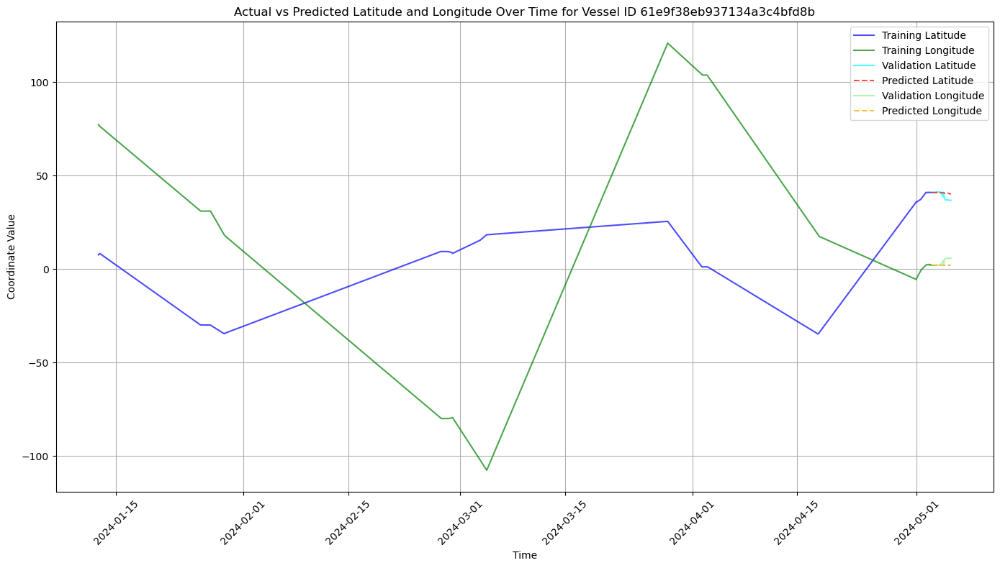

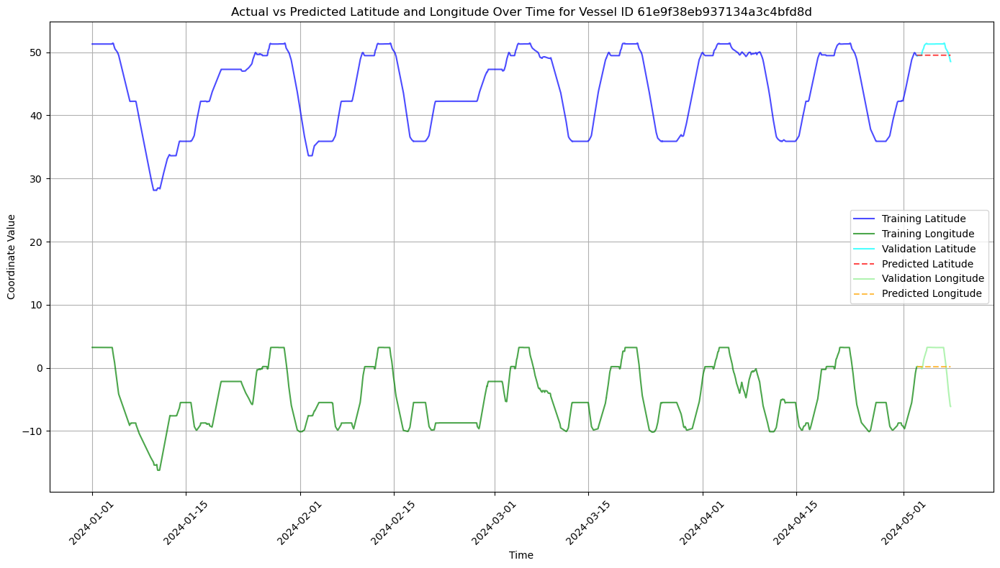

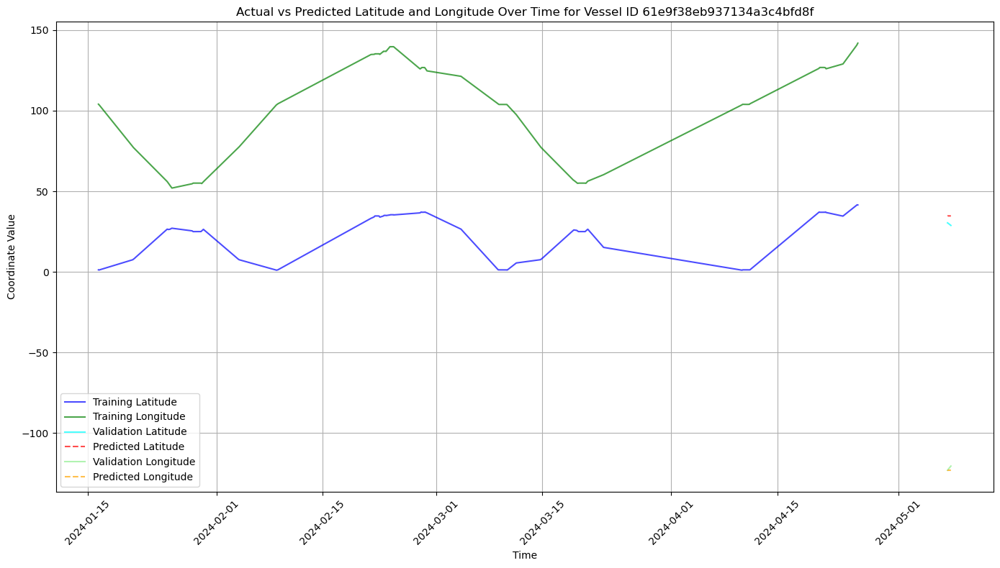

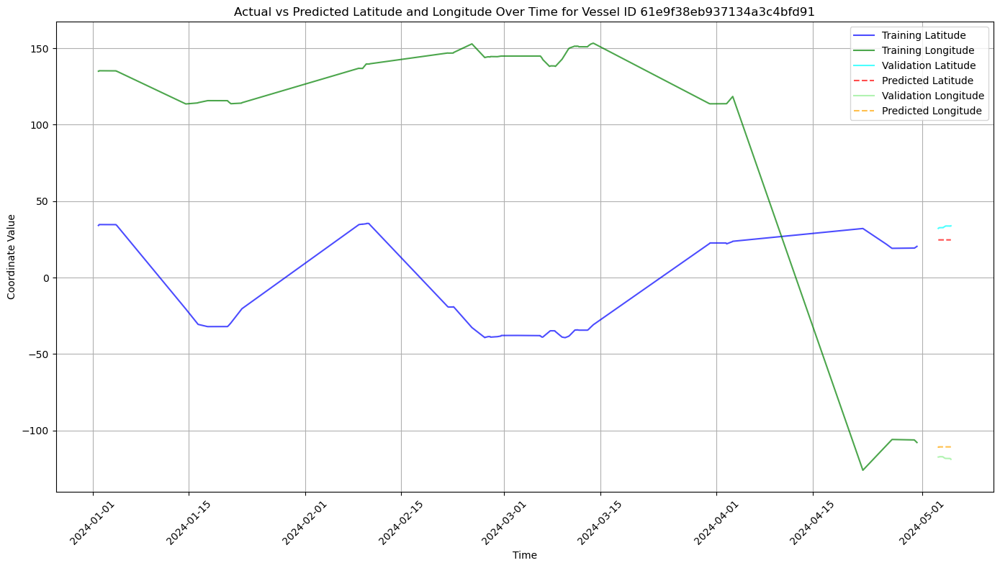

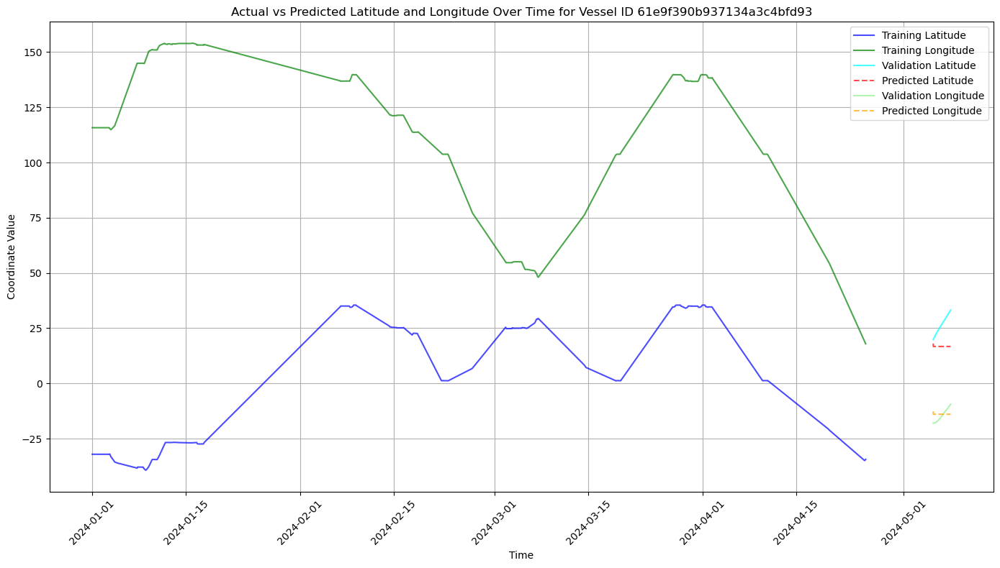

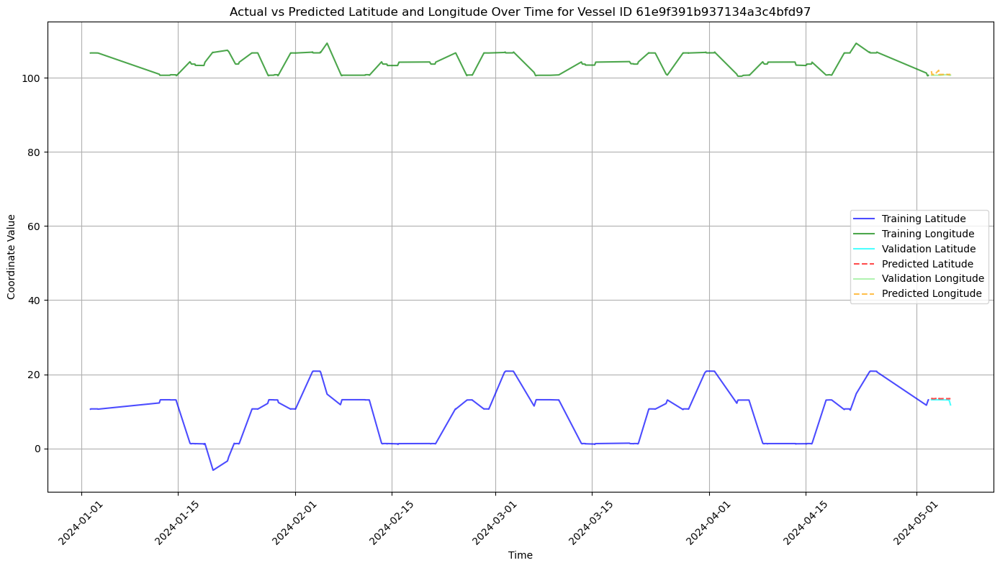

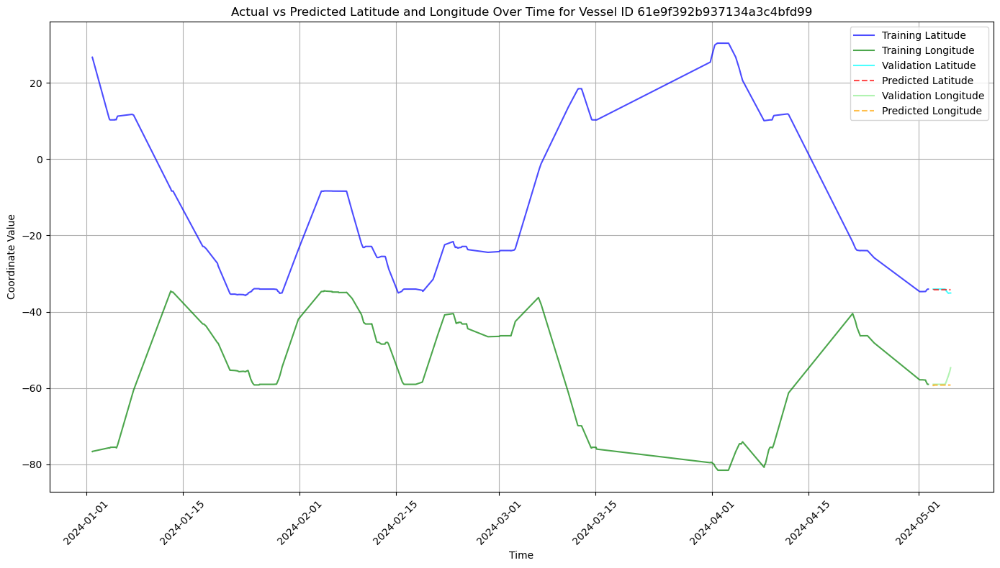

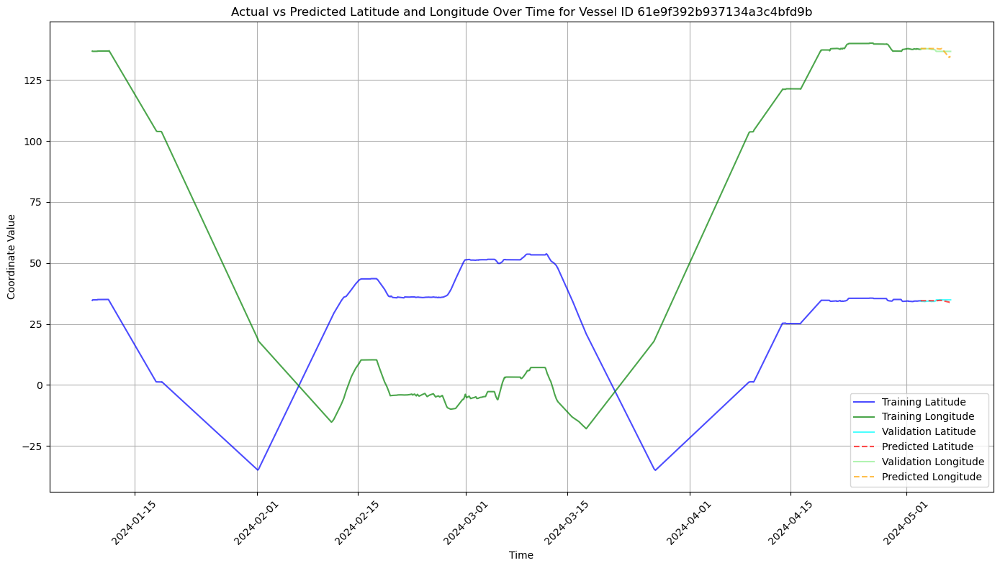

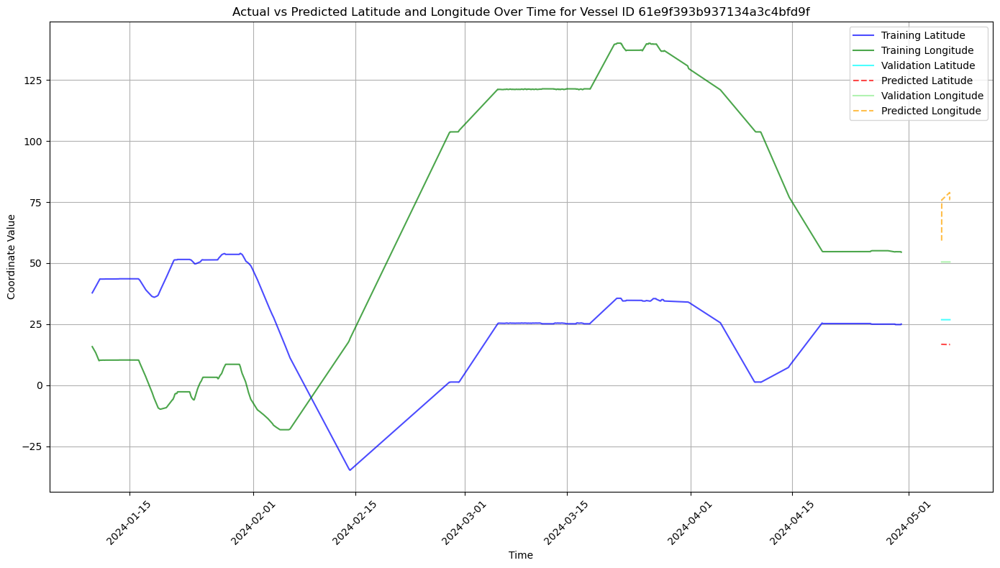

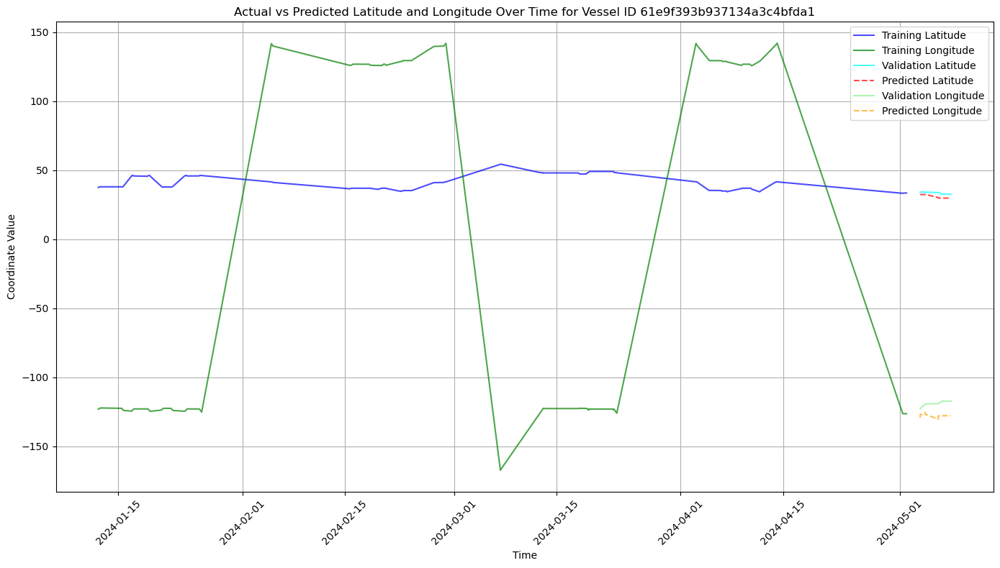

In [ ]:
def plot_coordinates_for_vessel_with_train(prediction_data, train_data, vessel_id):
    """
    Plots the actual and predicted latitude and longitude over time for a specific vessel,
    including data from both the training and prediction datasets.
    
    Parameters:
    - prediction_data: DataFrame containing validation or test actual and predicted coordinates
    - train_data: DataFrame containing training actual coordinates
    - vessel_id: The vesselId for which to plot the coordinates
    """
    # Filter data for the specified vessel in both datasets
    vessel_train_data = train_data[train_data['vesselId'] == vessel_id].sort_values(by='time')
    vessel_prediction_data = prediction_data[prediction_data['vesselId'] == vessel_id].sort_values(by='time')
    
    # Check if there is data for the vessel
    if vessel_train_data.empty and vessel_prediction_data.empty:
        print(f"No data available for vessel ID {vessel_id}")
        return
    
    plt.figure(figsize=(14, 8))
    
    # Training data - actual latitude and longitude
    if not vessel_train_data.empty:
        plt.plot(vessel_train_data['time'], vessel_train_data['latitude_vessel'], label='Training Latitude', color='blue', linestyle='-', alpha=0.7)
        plt.plot(vessel_train_data['time'], vessel_train_data['longitude_vessel'], label='Training Longitude', color='green', linestyle='-', alpha=0.7)
    
    # Validation/test data - actual and predicted latitude and longitude
    if not vessel_prediction_data.empty:
        plt.plot(vessel_prediction_data['time'], vessel_prediction_data['latitude_vessel'], label='Validation Latitude', color='cyan', linestyle='-', alpha=0.7)
        plt.plot(vessel_prediction_data['time'], vessel_prediction_data['predicted_latitude'], label='Predicted Latitude', color='red', linestyle='--', alpha=0.7)
        plt.plot(vessel_prediction_data['time'], vessel_prediction_data['longitude_vessel'], label='Validation Longitude', color='lightgreen', linestyle='-', alpha=0.7)
        plt.plot(vessel_prediction_data['time'], vessel_prediction_data['predicted_longitude'], label='Predicted Longitude', color='orange', linestyle='--', alpha=0.7)

    # Adding labels and legend
    plt.xlabel('Time')
    plt.ylabel('Coordinate Value')
    plt.legend()
    plt.title(f'Actual vs Predicted Latitude and Longitude Over Time for Vessel ID {vessel_id}')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()  # Adjust layout to make room for x-axis labels
    plt.show()



#make list of n vessels to plot
n = 10
vessels = prediction_data['vesselId'].unique()[:n]
for vessel_id in vessels:
    plot_coordinates_for_vessel_with_train(prediction_data, ais_train, vessel_id)



